# Individual Optional Project




### 1. Data Inspection

$\qquad \bullet$ [About the dataset and Kaggle](#about)<br>
$\qquad \bullet$ [Load the data](#load_data)<br>
$\qquad \bullet$ [Look at the data](#look_data)<br>
$\qquad \bullet$ [Look at the columns](#look_columns)<br>


### 2. Data Preprocessing

$\qquad \bullet$ [Variable to predict](#output_variable)<br>
$\qquad \bullet$ [Naive first model training](#naive_training)<br>
$\qquad \bullet$ [Convert date times](#convert_date)<br>
$\qquad \bullet$ [Convert strings into numerotated categories](#convert_strings)<br>
$\qquad \bullet$ [Inspect missing values](#nans)<br>
$\qquad \bullet$ [Save preprocessed data](#save_data)<br>
$\qquad \bullet$ [Fully numericalize data](#numericalize_data)<br>

### 3. Regression with Random Forests

$\qquad \bullet$ [Regression Model scoring, underfitting, overfitting](#model_scoring)<br>
$\qquad \bullet$ [Base model](#model_base)<br>
$\qquad \bullet$ [Decision Tree Regressor](#decision_tree)<br>
$\qquad \bullet$ [Tree bagging](#tree_bagging)<br>
$\qquad \bullet$ [OOB score](#oob_score)<br>
$\qquad \bullet$ [Stoping criteria](#tree_pruning)<br>
$\qquad \bullet$ [Data subsampling](#data_sampling)<br>
$\qquad \bullet$ [Feature subsampling](#feature_sampling)<br>
$\qquad \bullet$ [Bagging as general Ensemble method](#general_bagging)<br>
$\qquad \bullet$ [Cross validation](#cross_validation)<br>
$\qquad \bullet$ [Hyperparameter tuning for final model selection](#hyperparameter_tuning)<br>


### 4. Classification, and differences with Regression

$\qquad \bullet$ [Categorical target](#categorical_target)<br>
$\qquad \bullet$ [Decision Tree Classifier](#decision_tree_classifier)<br>
$\qquad \bullet$ [Random Forest Classifier](#random_forest_classifier)<br>
$\qquad \bullet$ [Evaluation criteria of binary classifiers](#binary_classifier_scoring)<br>
$\qquad \bullet$ [Dealing with imbalanced data 1 : Precision - Recall curve and threshold selection](#rec_prc_curve)<br>
$\qquad \bullet$ [Dealing with imbalanced data 2 : Class weights](#class_weight)<br>
$\qquad \bullet$ [Dealing with imbalanced data 3 : Model calibration](#model_calibration)<br>
$\qquad \bullet$ [Multiclass classification](#multiclass_classification)<br>


### 5. Model Interpretation

$\qquad \bullet$ [Random Forest features importance](#RF_feature_importance)<br>
$\qquad \bullet$ [Permutation importance](#permutation_feature_importance)<br>
$\qquad \bullet$ [Feature correlations](#redundant_features)<br>
$\qquad \bullet$ [Individual feature explicability](#feature_explicability)<br>


[Bottom](#bottom)

### Imports

In [1]:
%load_ext autoreload
%autoreload 2

%matplotlib inline

In [2]:
# base modules
import os
import sys
import copy
import logging
import IPython
import sklearn
import scipy

from collections import OrderedDict

# for manipulating data
try:
  from pandas_summary import DataFrameSummary
except:
  !pip install pandas_summary
  from pandas_summary import DataFrameSummary

try:
  import dill
except:
  !pip install dill
  import dill

# for Machine Learning
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier, BaggingRegressor
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier, plot_tree
from sklearn import metrics
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import cross_val_score, KFold, GridSearchCV
from sklearn.calibration import CalibratedClassifierCV
from sklearn.inspection import permutation_importance
from scipy.cluster import hierarchy
from sklearn.metrics import explained_variance_score
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
import statsmodels.api as sm
import lightgbm as lgb
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import VotingRegressor

# for visualization
from IPython.display import display
from matplotlib import pyplot as plt

#!pip install -U plotnine
# install plotnine with conda command :  conda install -c conda-forge plotnine

from plotnine import ggplot, aes
from plotnine.stats import stat_smooth
try:
  from pdpbox import pdp
except:
  !pip install pdpbox==0.1.0
  from pdpbox import pdp
try:
  import graphviz
except:
  !pip install graphviz
  import graphviz

!pip install pyarrow

In [3]:
import pandas as pd
import numpy as np
import re
import math

from pandas.api.types import is_string_dtype, is_numeric_dtype, is_categorical_dtype

In [4]:
def add_datepart(df, fldnames, drop=True, time=False, errors="raise"):
    """add_datepart converts a column of df from a datetime64 to many columns containing
    the information from the date. This applies changes inplace.

    Parameters:
    -----------
    df: A pandas data frame. df gain several new columns.
    fldname: A string or list of strings that is the name of the date column you wish to expand.
        If it is not a datetime64 series, it will be converted to one with pd.to_datetime.
    drop: If true then the original date column will be removed.
    time: If true time features: Hour, Minute, Second will be added.
    Examples:
    ---------
    >>> df = pd.DataFrame({ 'A' : pd.to_datetime(['3/11/2000', '3/12/2000', '3/13/2000'], infer_datetime_format=False) })
    >>> df
        A
    0   2000-03-11
    1   2000-03-12
    2   2000-03-13
    >>> add_datepart(df, 'A')
    >>> df
        AYear AMonth AWeek ADay ADayofweek ADayofyear AIs_month_end AIs_month_start AIs_quarter_end AIs_quarter_start AIs_year_end AIs_year_start AElapsed
    0   2000  3      10    11   5          71         False         False           False           False             False        False          952732800
    1   2000  3      10    12   6          72         False         False           False           False             False        False          952819200
    2   2000  3      11    13   0          73         False         False           False           False             False        False          952905600
    >>>df2 = pd.DataFrame({'start_date' : pd.to_datetime(['3/11/2000','3/13/2000','3/15/2000']),
                            'end_date':pd.to_datetime(['3/17/2000','3/18/2000','4/1/2000'],infer_datetime_format=True)})
    >>>df2
        start_date	end_date
    0	2000-03-11	2000-03-17
    1	2000-03-13	2000-03-18
    2	2000-03-15	2000-04-01
    >>>add_datepart(df2,['start_date','end_date'])
    >>>df2
    	start_Year	start_Month	start_Week	start_Day	start_Dayofweek	start_Dayofyear	start_Is_month_end	start_Is_month_start	start_Is_quarter_end	start_Is_quarter_start	start_Is_year_end	start_Is_year_start	start_Elapsed	end_Year	end_Month	end_Week	end_Day	end_Dayofweek	end_Dayofyear	end_Is_month_end	end_Is_month_start	end_Is_quarter_end	end_Is_quarter_start	end_Is_year_end	end_Is_year_start	end_Elapsed
    0	2000	    3	        10	        11	        5	            71	            False	            False	                False	                False	                False	            False	            952732800	    2000	    3	        11	        17	    4	            77	            False	            False	            False	            False	                False	        False	            953251200
    1	2000	    3	        11	        13	        0	            73	            False	            False	                False	                False               	False           	False           	952905600     	2000       	3	        11      	18  	5           	78          	False	            False           	False           	False               	False          	False           	953337600
    2	2000	    3	        11	        15	        2           	75          	False           	False               	False               	False               	False               False           	953078400      	2000    	4          	13      	1   	5           	92          	False           	True            	False           	True                	False          	False           	954547200
    """
    if isinstance(fldnames,str):
        fldnames = [fldnames]
    for fldname in fldnames:
        fld = df[fldname] # fld = df['saledate']
        fld_dtype = fld.dtype
        if isinstance(fld_dtype, pd.core.dtypes.dtypes.DatetimeTZDtype):
            fld_dtype = np.datetime64

        if not np.issubdtype(fld_dtype, np.datetime64):
            df[fldname] = fld = pd.to_datetime(fld, infer_datetime_format=True, errors=errors)
        targ_pre = re.sub('[Dd]ate$', '', fldname)
        attr = ['Year', 'Month', 'Week', 'Day', 'Dayofweek', 'Dayofyear',
                'Is_month_end', 'Is_month_start', 'Is_quarter_end', 'Is_quarter_start', 'Is_year_end', 'Is_year_start']
        if time: 
            attr = attr + ['Hour', 'Minute', 'Second']
        for n in attr: 
            if hasattr(fld.dt, n.lower()):
                df[targ_pre + n] = getattr(fld.dt, n.lower())
        df[targ_pre + 'Elapsed'] = fld.astype(np.int64) // 10 ** 9
        if drop: df.drop(fldname, axis=1, inplace=True)

def train_cats(df):
    """Change any columns of strings in a panda's dataframe to a column of
    categorical values. This applies the changes inplace.
    Parameters:
    -----------
    df: A pandas dataframe. Any columns of strings will be changed to
        categorical values.
    Examples:
    ---------
    >>> df = pd.DataFrame({'col1' : [1, 2, 3], 'col2' : ['a', 'b', 'a']})
    >>> df
       col1 col2
    0     1    a
    1     2    b
    2     3    a
    note the type of col2 is string
    >>> train_cats(df)
    >>> df
       col1 col2
    0     1    a
    1     2    b
    2     3    a
    now the type of col2 is category
    """
    for n, c in df.items():
        if is_string_dtype(c): df[n] = c.astype('category').cat.as_ordered()

def proc_df(df, y_fld=None, skip_flds=None, ignore_flds=None, do_scale=False, na_dict=None,
            preproc_fn=None, max_n_cat=None, subset=None, mapper=None):
    """ proc_df takes a data frame df and splits off the response variable, and
    changes the df into an entirely numeric dataframe. For each column of df
    which is not in skip_flds nor in ignore_flds, na values are replaced by the
    median value of the column.
    Parameters:
    -----------
    df: The data frame you wish to process.
    y_fld: The name of the response variable
    skip_flds: A list of fields that dropped from df.
    ignore_flds: A list of fields that are ignored during processing.
    do_scale: Standardizes each column in df. Takes Boolean Values(True,False)
    na_dict: a dictionary of na columns to add. Na columns are also added if there
        are any missing values.
    preproc_fn: A function that gets applied to df.
    max_n_cat: The maximum number of categories to break into dummy values, instead
        of integer codes.
    subset: Takes a random subset of size subset from df.
    mapper: If do_scale is set as True, the mapper variable
        calculates the values used for scaling of variables during training time (mean and standard deviation).
    Returns:
    --------
    [x, y, nas, mapper(optional)]:
        x: x is the transformed version of df. x will not have the response variable
            and is entirely numeric.
        y: y is the response variable
        nas: returns a dictionary of which nas it created, and the associated median.
        mapper: A DataFrameMapper which stores the mean and standard deviation of the corresponding continuous
        variables which is then used for scaling of during test-time.
    Examples:
    ---------
    >>> df = pd.DataFrame({'col1' : [1, 2, 3], 'col2' : ['a', 'b', 'a']})
    >>> df
       col1 col2
    0     1    a
    1     2    b
    2     3    a
    note the type of col2 is string
    >>> train_cats(df)
    >>> df
       col1 col2
    0     1    a
    1     2    b
    2     3    a
    now the type of col2 is category { a : 1, b : 2}
    >>> x, y, nas = proc_df(df, 'col1')
    >>> x
       col2
    0     1
    1     2
    2     1
    >>> data = DataFrame(pet=["cat", "dog", "dog", "fish", "cat", "dog", "cat", "fish"],
                 children=[4., 6, 3, 3, 2, 3, 5, 4],
                 salary=[90, 24, 44, 27, 32, 59, 36, 27])
    >>> mapper = DataFrameMapper([(:pet, LabelBinarizer()),
                          ([:children], StandardScaler())])
    >>>round(fit_transform!(mapper, copy(data)), 2)
    8x4 Array{Float64,2}:
    1.0  0.0  0.0   0.21
    0.0  1.0  0.0   1.88
    0.0  1.0  0.0  -0.63
    0.0  0.0  1.0  -0.63
    1.0  0.0  0.0  -1.46
    0.0  1.0  0.0  -0.63
    1.0  0.0  0.0   1.04
    0.0  0.0  1.0   0.21
    """
    if not ignore_flds: ignore_flds=[]
    if not skip_flds: skip_flds=[]
    if subset: df = get_sample(df, subset)
    else: df = df.copy()
    ignored_flds = df.loc[:, ignore_flds]
    df = df.drop(ignore_flds, axis = 1, inplace = False)
    if preproc_fn: preproc_fn(df)
    if y_fld is None: y = None
    else:
        if not is_numeric_dtype(df[y_fld]): df[y_fld] = pd.Categorical(df[y_fld]).codes
        y = df[y_fld].values
        skip_flds += [y_fld]
    df.drop(skip_flds, axis=1, inplace=True)

    if na_dict is None: na_dict = {}
    else: na_dict = na_dict.copy()
    na_dict_initial = na_dict.copy()
    for n,c in df.items(): na_dict = fix_missing(df, c, n, na_dict)
    if len(na_dict_initial.keys()) > 0:
        df.drop([a + '_na' for a in list(set(na_dict.keys()) - set(na_dict_initial.keys()))], axis=1, inplace=True)
    if do_scale: mapper = scale_vars(df, mapper)
    for n,c in df.items(): numericalize(df, c, n, max_n_cat)
    df = pd.get_dummies(df, dummy_na=True)
    df = pd.concat([ignored_flds, df], axis=1)
    res = [df, y, na_dict]
    if do_scale: res = res + [mapper]
    return res

def fix_missing(df, col, name, na_dict):
    """ Fill missing data in a column of df with the median, and add a {name}_na column
    which specifies if the data was missing.
    Parameters:
    -----------
    df: The data frame that will be changed.
    col: The column of data to fix by filling in missing data.
    name: The name of the new filled column in df.
    na_dict: A dictionary of values to create na's of and the value to insert. If
        name is not a key of na_dict the median will fill any missing data. Also
        if name is not a key of na_dict and there is no missing data in col, then
        no {name}_na column is not created.
    Examples:
    ---------
    >>> df = pd.DataFrame({'col1' : [1, np.NaN, 3], 'col2' : [5, 2, 2]})
    >>> df
       col1 col2
    0     1    5
    1   nan    2
    2     3    2
    >>> fix_missing(df, df['col1'], 'col1', {})
    >>> df
       col1 col2 col1_na
    0     1    5   False
    1     2    2    True
    2     3    2   False
    >>> df = pd.DataFrame({'col1' : [1, np.NaN, 3], 'col2' : [5, 2, 2]})
    >>> df
       col1 col2
    0     1    5
    1   nan    2
    2     3    2
    >>> fix_missing(df, df['col2'], 'col2', {})
    >>> df
       col1 col2
    0     1    5
    1   nan    2
    2     3    2
    >>> df = pd.DataFrame({'col1' : [1, np.NaN, 3], 'col2' : [5, 2, 2]})
    >>> df
       col1 col2
    0     1    5
    1   nan    2
    2     3    2
    >>> fix_missing(df, df['col1'], 'col1', {'col1' : 500})
    >>> df
       col1 col2 col1_na
    0     1    5   False
    1   500    2    True
    2     3    2   False
    """
    if is_numeric_dtype(col):
        if pd.isnull(col).sum() or (name in na_dict):
            df[name+'_na'] = pd.isnull(col)
            filler = na_dict[name] if name in na_dict else col.median()
            df[name] = col.fillna(filler)
            na_dict[name] = filler
    return na_dict

def numericalize(df, col, name, max_n_cat):
    """ Changes the column col from a categorical type to it's integer codes.
    Parameters:
    -----------
    df: A pandas dataframe. df[name] will be filled with the integer codes from
        col.
    col: The column you wish to change into the categories.
    name: The column name you wish to insert into df. This column will hold the
        integer codes.
    max_n_cat: If col has more categories than max_n_cat it will not change the
        it to its integer codes. If max_n_cat is None, then col will always be
        converted.
    Examples:
    ---------
    >>> df = pd.DataFrame({'col1' : [1, 2, 3], 'col2' : ['a', 'b', 'a']})
    >>> df
       col1 col2
    0     1    a
    1     2    b
    2     3    a
    note the type of col2 is string
    >>> train_cats(df)
    >>> df
       col1 col2
    0     1    a
    1     2    b
    2     3    a
    now the type of col2 is category { a : 1, b : 2}
    >>> numericalize(df, df['col2'], 'col3', None)
       col1 col2 col3
    0     1    a    1
    1     2    b    2
    2     3    a    1
    """
    if not is_numeric_dtype(col) and ( max_n_cat is None or len(col.cat.categories)>max_n_cat):
        df[name] = pd.Categorical(col).codes+1

def draw_tree(t, df, size=10, ratio=0.6, precision=0):
    """ Draws a representation of a random forest in IPython.
    Parameters:
    -----------
    t: The tree you wish to draw
    df: The data used to train the tree. This is used to get the names of the features.
    """
    from sklearn.tree import export_graphviz
    s=export_graphviz(t, out_file=None, feature_names=df.columns, filled=True,
                      special_characters=True, rotate=True, precision=precision)
    IPython.display.display(graphviz.Source(re.sub('Tree {',
       f'Tree {{ size={size}; ratio={ratio}', s)))

def get_sample(df,n):
    """ Gets a random sample of n rows from df, without replacement.
    Parameters:
    -----------
    df: A pandas data frame, that you wish to sample from.
    n: The number of rows you wish to sample.
    Returns:
    --------
    return value: A random sample of n rows of df.
    Examples:
    ---------
    >>> df = pd.DataFrame({'col1' : [1, 2, 3], 'col2' : ['a', 'b', 'a']})
    >>> df
       col1 col2
    0     1    a
    1     2    b
    2     3    a
    >>> get_sample(df, 2)
       col1 col2
    1     2    b
    2     3    a
    """
    idxs = sorted(np.random.permutation(len(df))[:n])
    return df.iloc[idxs].copy()

def display_all(df):
    with pd.option_context("display.max_rows", 1000, "display.max_columns", 1000):
        display(df)

def split_vals(df, n):
    return df[:n].copy(), df[n:].copy()

def rmse(y_gold, y_pred):
    return math.sqrt(((y_gold - y_pred)**2).mean())

def print_score(m, X_train, y_train, X_valid, y_valid):
    print('RMSE on train set: {:.4f}'.format(rmse(m.predict(X_train), y_train)))
    print('RMSE on valid set: {:.4f}'.format(rmse(m.predict(X_valid), y_valid)))
    print('R^2 on train set: {:.4f}'.format(m.score(X_train, y_train)))
    print('R^2 on valid set: {:.4f}'.format(m.score(X_valid, y_valid)))
    if hasattr(m, 'oob_score_'): print('R^2 on oob set: {:.4f}'.format(m.oob_score_))
    return

def split_vals(df, n):
    return df[:n].copy(), df[n:].copy()

# 1. Data Inspection

### $\bullet$ About the dataset and Kaggle

[Back to top](#plan)

We will be looking at the Blue Book for Bulldozers Kaggle Competition: "The goal of the contest is to predict the sale price of a particular piece of heavy equiment at auction based on it's usage, equipment type, and configuration.  The data is sourced from auction result postings and includes information on usage and equipment configurations."

This is a very common type of dataset and prediciton problem, and similar to what you may see in your project or workplace.

Kaggle is an awesome resource for aspiring data scientists or anyone looking to improve their machine learning skills.  There is nothing like being able to get hands-on practice and receiving real-time feedback to help you improve your skills.

Kaggle provides:

1. Interesting data sets
2. Feedback on how you're doing
3. A leader board to see what's good, what's possible, and what's state-of-art.
4. Blog posts by winning contestants share useful tips and techniques.



Kaggle provides info about some of the fields of our dataset; on the [Kaggle Data info](https://www.kaggle.com/c/bluebook-for-bulldozers/data) page they say the following:

For this competition, you are predicting the sale price of bulldozers sold at auctions. The data for this competition is split into three parts:

- **Train.csv** is the training set, which contains data through the end of 2011.
- **Valid.csv** is the validation set, which contains data from January 1, 2012 - April 30, 2012. You make predictions on this set throughout the majority of the competition. Your score on this set is used to create the public leaderboard.
- **Test.csv** is the test set, which won't be released until the last week of the competition. It contains data from May 1, 2012 - November 2012. Your score on the test set determines your final rank for the competition.

<a id="load_data"></a>

### $\bullet$ Import the data

[Back to top](#plan)

In [5]:
path_to_bulldozers = os.getcwd()


In [6]:
df_raw = pd.read_csv(path_to_bulldozers+'/Data Files/Train.csv', low_memory = False, parse_dates = ["saledate"])

In [7]:
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 401125 entries, 0 to 401124
Data columns (total 53 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   SalesID                   401125 non-null  int64         
 1   SalePrice                 401125 non-null  int64         
 2   MachineID                 401125 non-null  int64         
 3   ModelID                   401125 non-null  int64         
 4   datasource                401125 non-null  int64         
 5   auctioneerID              380989 non-null  float64       
 6   YearMade                  401125 non-null  int64         
 7   MachineHoursCurrentMeter  142765 non-null  float64       
 8   UsageBand                 69639 non-null   object        
 9   saledate                  401125 non-null  datetime64[ns]
 10  fiModelDesc               401125 non-null  object        
 11  fiBaseModel               401125 non-null  object        
 12  fi

<a id="look_data"></a>

### $\bullet$ Look at the data

[Back to top](#plan)

In any sort of data science work, it's **important to look at your data**, to make sure you understand the format, how it's stored, what type of values it holds, etc.<br>
Even if you've read descriptions about your data, the actual data may not be what you expect.

The key fields that are in train.csv are:

- SalesID: the unique identifier of the sale
- MachineID: the unique identifier of a machine.  A machine can be sold multiple times
- saleprice: what the machine sold for at auction (only provided in train.csv)
- saledate: the date of the sale

In [8]:
# print the 5 first and last rows
display_all(df_raw.head())
display_all(df_raw.tail())

,SalesID,SalePrice,MachineID,ModelID,datasource,auctioneerID,YearMade,MachineHoursCurrentMeter,UsageBand,saledate,fiModelDesc,fiBaseModel,fiSecondaryDesc,fiModelSeries,fiModelDescriptor,ProductSize,fiProductClassDesc,state,ProductGroup,ProductGroupDesc,Drive_System,Enclosure,Forks,Pad_Type,Ride_Control,Stick,Transmission,Turbocharged,Blade_Extension,Blade_Width,Enclosure_Type,Engine_Horsepower,Hydraulics,Pushblock,Ripper,Scarifier,Tip_Control,Tire_Size,Coupler,Coupler_System,Grouser_Tracks,Hydraulics_Flow,Track_Type,Undercarriage_Pad_Width,Stick_Length,Thumb,Pattern_Changer,Grouser_Type,Backhoe_Mounting,Blade_Type,Travel_Controls,Differential_Type,Steering_Controls
0,1139246,66000,999089,3157,121,3.0,2004,68.0,Low,2006-11-16,521D,521,D,NaN,NaN,NaN,Wheel Loader - 110.0 to 120.0 Horsepower,Alabama,WL,Wheel Loader,NaN,EROPS w AC,None or Unspecified,NaN,None or Unspecified,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2 Valve,NaN,NaN,NaN,NaN,None or Unspecified,None or Unspecified,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Standard,Conventional
1,1139248,57000,117657,77,121,3.0,1996,4640.0,Low,2004-03-26,950FII,950,F,II,NaN,Medium,Wheel Loader - 150.0 to 175.0 Horsepower,North Carolina,WL,Wheel Loader,NaN,EROPS w AC,None or Unspecified,NaN,None or Unspecified,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2 Valve,NaN,NaN,NaN,NaN,23.5,None or Unspecified,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Standard,Conventional
2,1139249,10000,434808,7009,121,3.0,2001,2838.0,High,2004-02-26,226,226,NaN,NaN,NaN,NaN,Skid Steer Loader - 1351.0 to 1601.0 Lb Operat...,New York,SSL,Skid Steer Loaders,NaN,OROPS,None or Unspecified,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Auxiliary,NaN,NaN,NaN,NaN,NaN,None or Unspecified,None or Unspecified,None or Unspecified,Standard,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1139251,38500,1026470,332,121,3.0,2001,3486.0,High,2011-05-19,PC120-6E,PC120,NaN,-6E,NaN,Small,"Hydraulic Excavator, Track - 12.0 to 14.0 Metr...",Texas,TEX,Track Excavators,NaN,EROPS w AC,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2 Valve,NaN,NaN,NaN,NaN,NaN,None or Unspecified,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1139253,11000,1057373,17311,121,3.0,2007,722.0,Medium,2009-07-23,S175,S175,NaN,NaN,NaN,NaN,Skid Steer Loader - 1601.0 to 1751.0 Lb Operat...,New York,SSL,Skid Steer Loaders,NaN,EROPS,None or Unspecified,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Auxiliary,NaN,NaN,NaN,NaN,NaN,None or Unspecified,None or Unspecified,None or Unspecified,Standard,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,SalesID,SalePrice,MachineID,ModelID,datasource,auctioneerID,YearMade,MachineHoursCurrentMeter,UsageBand,saledate,fiModelDesc,fiBaseModel,fiSecondaryDesc,fiModelSeries,fiModelDescriptor,ProductSize,fiProductClassDesc,state,ProductGroup,ProductGroupDesc,Drive_System,Enclosure,Forks,Pad_Type,Ride_Control,Stick,Transmission,Turbocharged,Blade_Extension,Blade_Width,Enclosure_Type,Engine_Horsepower,Hydraulics,Pushblock,Ripper,Scarifier,Tip_Control,Tire_Size,Coupler,Coupler_System,Grouser_Tracks,Hydraulics_Flow,Track_Type,Undercarriage_Pad_Width,Stick_Length,Thumb,Pattern_Changer,Grouser_Type,Backhoe_Mounting,Blade_Type,Travel_Controls,Differential_Type,Steering_Controls
401120,6333336,10500,1840702,21439,149,1.0,2005,NaN,NaN,2011-11-02,35NX2,35,NX,2,NaN,Mini,"Hydraulic Excavator, Track - 3.0 to 4.0 Metric...",Maryland,TEX,Track Excavators,NaN,EROPS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Auxiliary,NaN,NaN,NaN,NaN,NaN,None or Unspecified,NaN,NaN,NaN,Steel,None or Unspecified,None or Unspecified,None or Unspecified,None or Unspecified,Double,NaN,NaN,NaN,NaN,NaN
401121,6333337,11000,1830472,21439,149,1.0,2005,NaN,NaN,2011-11-02,35NX2,35,NX,2,NaN,Mini,"Hydraulic Excavator, Track - 3.0 to 4.0 Metric...",Maryland,TEX,Track Excavators,NaN,EROPS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Standard,NaN,NaN,NaN,NaN,NaN,None or Unspecified,NaN,NaN,NaN,Steel,None or Unspecified,None or Unspecified,None or Unspecified,None or Unspecified,Double,NaN,NaN,NaN,NaN,NaN
401122,6333338,11500,1887659,21439,149,1.0,2005,NaN,NaN,2011-11-02,35NX2,35,NX,2,NaN,Mini,"Hydraulic Excavator, Track - 3.0 to 4.0 Metric...",Maryland,TEX,Track Excavators,NaN,EROPS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Auxiliary,NaN,NaN,NaN,NaN,NaN,None or Unspecified,NaN,NaN,NaN,Steel,None or Unspecified,None or Unspecified,None or Unspecified,None or Unspecified,Double,NaN,NaN,NaN,NaN,NaN
401123,6333341,9000,1903570,21435,149,2.0,2005,NaN,NaN,2011-10-25,30NX,30,NX,NaN,NaN,Mini,"Hydraulic Excavator, Track - 2.0 to 3.0 Metric...",Florida,TEX,Track Excavators,NaN,EROPS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Standard,NaN,NaN,NaN,NaN,NaN,None or Unspecified,NaN,NaN,NaN,Steel,None or Unspecified,None or Unspecified,None or Unspecified,None or Unspecified,Double,NaN,NaN,NaN,NaN,NaN
401124,6333342,7750,1926965,21435,149,2.0,2005,NaN,NaN,2011-10-25,30NX,30,NX,NaN,NaN,Mini,"Hydraulic Excavator, Track - 2.0 to 3.0 Metric...",Florida,TEX,Track Excavators,NaN,EROPS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Standard,NaN,NaN,NaN,NaN,NaN,None or Unspecified,NaN,NaN,NaN,Steel,None or Unspecified,None or Unspecified,None or Unspecified,None or Unspecified,Double,NaN,NaN,NaN,NaN,NaN


<a id="look_columns"></a>

### $\bullet$ Look at the columns

[Back to top](#plan)

In [9]:
df_raw.columns

Index(['SalesID', 'SalePrice', 'MachineID', 'ModelID', 'datasource',
       'auctioneerID', 'YearMade', 'MachineHoursCurrentMeter', 'UsageBand',
       'saledate', 'fiModelDesc', 'fiBaseModel', 'fiSecondaryDesc',
       'fiModelSeries', 'fiModelDescriptor', 'ProductSize',
       'fiProductClassDesc', 'state', 'ProductGroup', 'ProductGroupDesc',
       'Drive_System', 'Enclosure', 'Forks', 'Pad_Type', 'Ride_Control',
       'Stick', 'Transmission', 'Turbocharged', 'Blade_Extension',
       'Blade_Width', 'Enclosure_Type', 'Engine_Horsepower', 'Hydraulics',
       'Pushblock', 'Ripper', 'Scarifier', 'Tip_Control', 'Tire_Size',
       'Coupler', 'Coupler_System', 'Grouser_Tracks', 'Hydraulics_Flow',
       'Track_Type', 'Undercarriage_Pad_Width', 'Stick_Length', 'Thumb',
       'Pattern_Changer', 'Grouser_Type', 'Backhoe_Mounting', 'Blade_Type',
       'Travel_Controls', 'Differential_Type', 'Steering_Controls'],
      dtype='object')

In [10]:
len(df_raw.columns)

53

In [11]:
df_raw.shape

(401125, 53)

In [12]:
display_all(df_raw.describe(include='all').T)

,count,unique,top,freq,mean,min,25%,50%,75%,max,std
SalesID,401125.0,NaN,NaN,NaN,1919712.521503,1139246.0,1418371.0,1639422.0,2242707.0,6333342.0,909021.492667
SalePrice,401125.0,NaN,NaN,NaN,31099.712848,4750.0,14500.0,24000.0,40000.0,142000.0,23036.898502
MachineID,401125.0,NaN,NaN,NaN,1217902.517971,0.0,1088697.0,1279490.0,1468067.0,2486330.0,440991.954249
ModelID,401125.0,NaN,NaN,NaN,6889.70298,28.0,3259.0,4604.0,8724.0,37198.0,6221.777842
datasource,401125.0,NaN,NaN,NaN,134.66581,121.0,132.0,132.0,136.0,172.0,8.962237
auctioneerID,380989.0,NaN,NaN,NaN,6.55604,0.0,1.0,2.0,4.0,99.0,16.976779
YearMade,401125.0,NaN,NaN,NaN,1899.156901,1000.0,1985.0,1995.0,2000.0,2013.0,291.797469
MachineHoursCurrentMeter,142765.0,NaN,NaN,NaN,3457.955353,0.0,0.0,0.0,3025.0,2483300.0,27590.256413
UsageBand,69639,3,Medium,33985,NaN,NaN,NaN,NaN,NaN,NaN,NaN
saledate,401125,NaN,NaN,NaN,2004-08-02 07:47:13.986413184,1989-01-17 00:00:00,2000-10-07 00:00:00,2006-03-23 00:00:00,2009-03-24 00:00:00,2011-12-30 00:00:00,NaN


In [13]:
df_raw.nunique()

SalesID                     401125
SalePrice                      899
MachineID                   341027
ModelID                       5218
datasource                       5
auctioneerID                    30
YearMade                        72
MachineHoursCurrentMeter     15152
UsageBand                        3
saledate                      3919
fiModelDesc                   4999
fiBaseModel                   1950
fiSecondaryDesc                175
fiModelSeries                  122
fiModelDescriptor              139
ProductSize                      6
fiProductClassDesc              74
state                           53
ProductGroup                     6
ProductGroupDesc                 6
Drive_System                     4
Enclosure                        6
Forks                            2
Pad_Type                         4
Ride_Control                     3
Stick                            2
Transmission                     8
Turbocharged                     2
Blade_Extension     

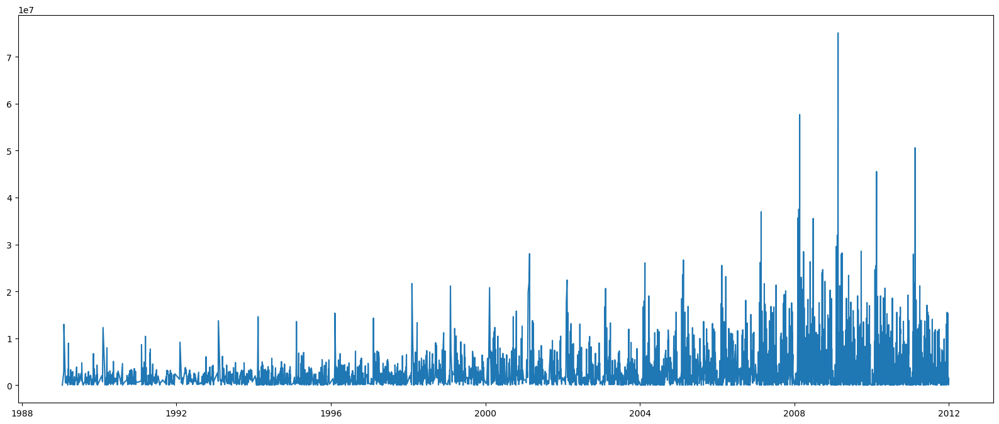

In [14]:
import matplotlib.pyplot as plt
#check data period
plt.figure(figsize=(20,8))
temp_df = df_raw.sort_values('saledate', ascending=True).reset_index(drop=True).groupby(by=['saledate']).agg({'SalePrice': 'sum'})
plt.plot(temp_df['SalePrice'], label='Sale Price')
plt.show()

Alabama


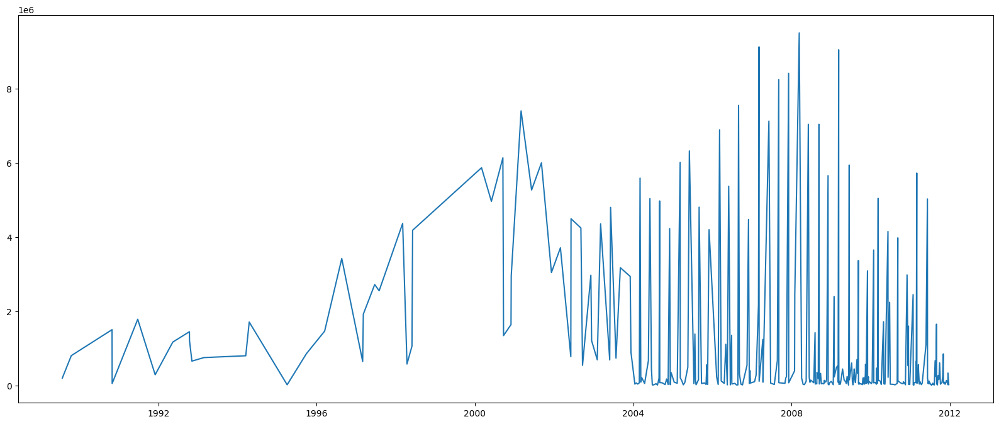

North Carolina


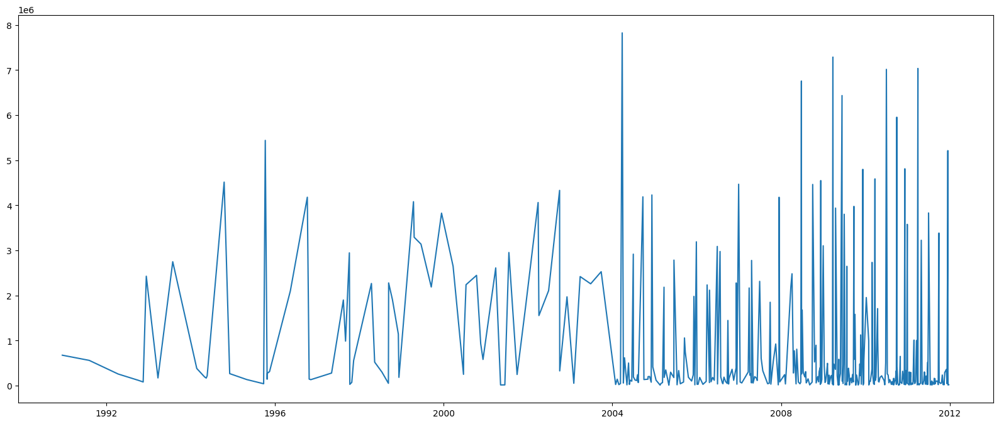

New York


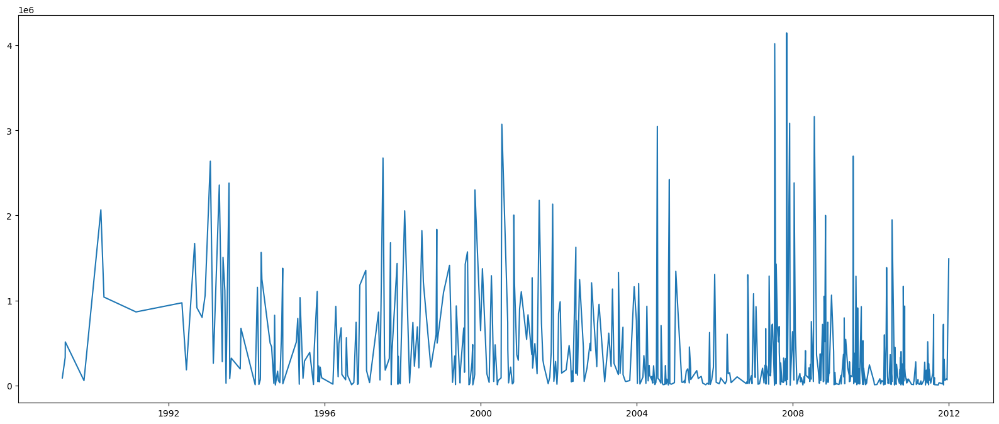

Texas


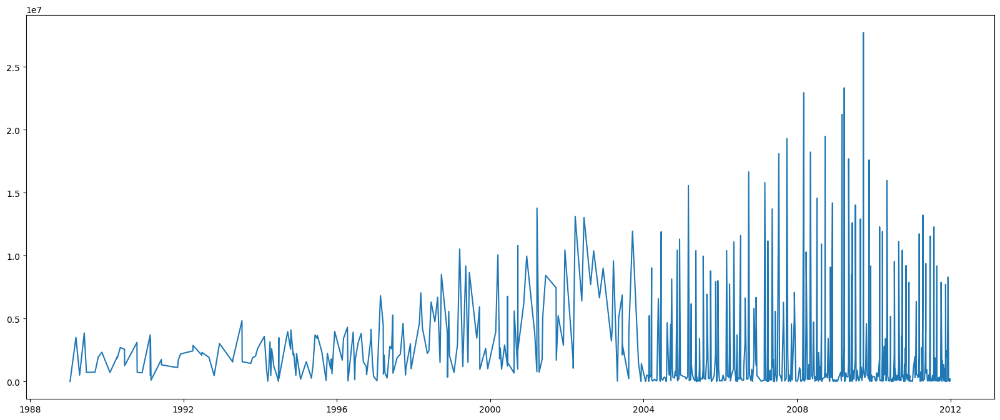

Arizona


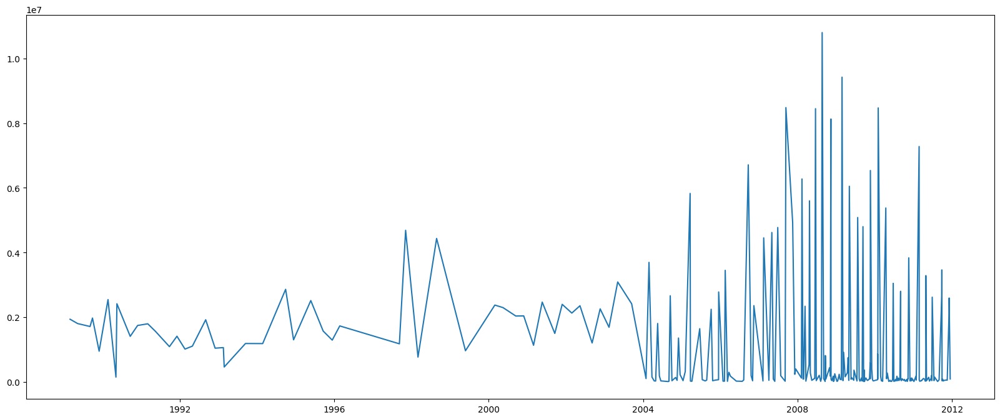

Florida


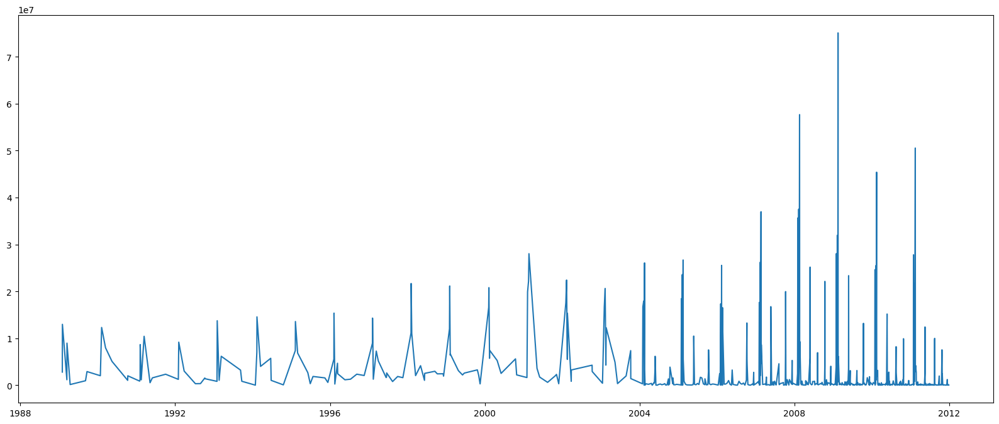

Illinois


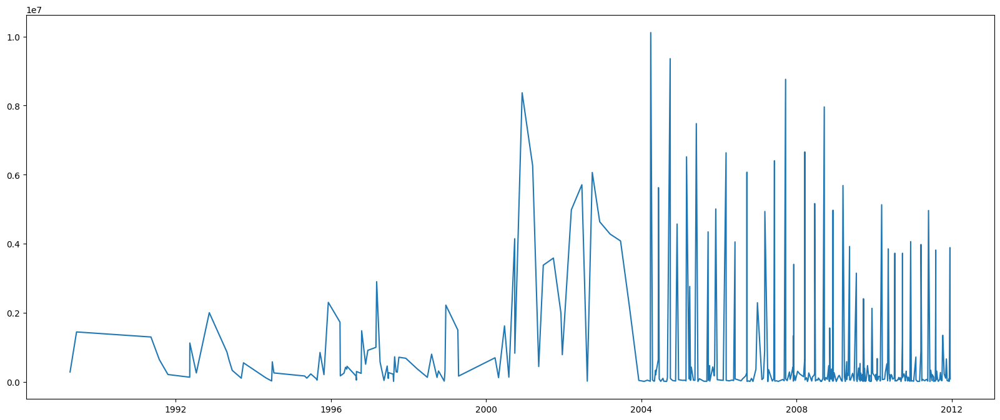

Oregon


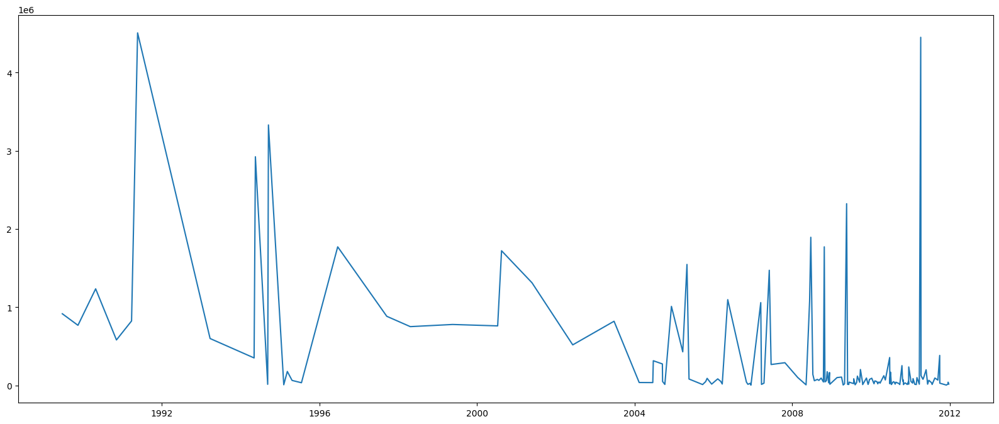

Ohio


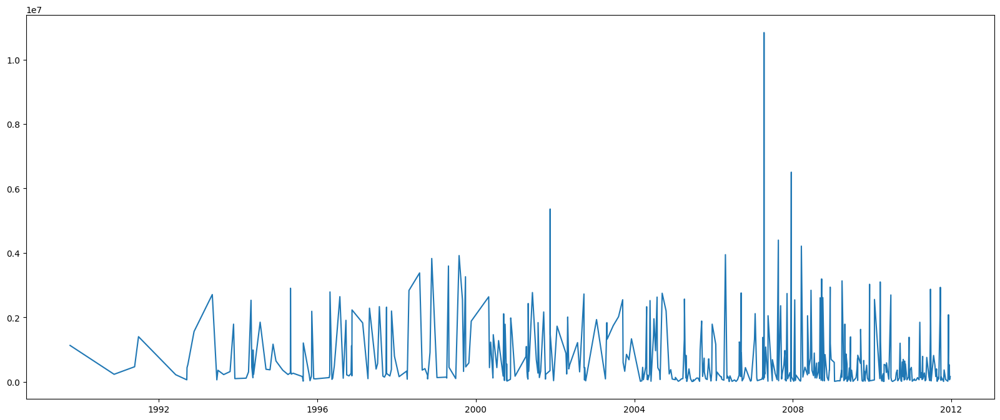

Arkansas


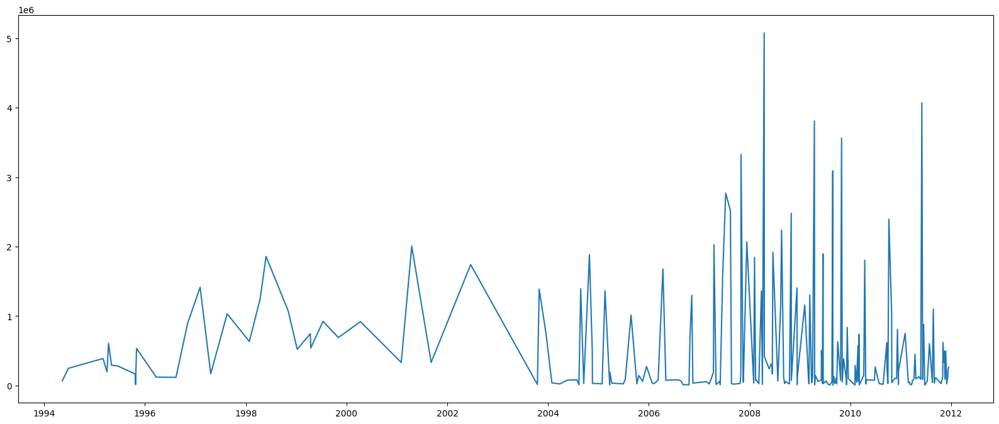

Wisconsin


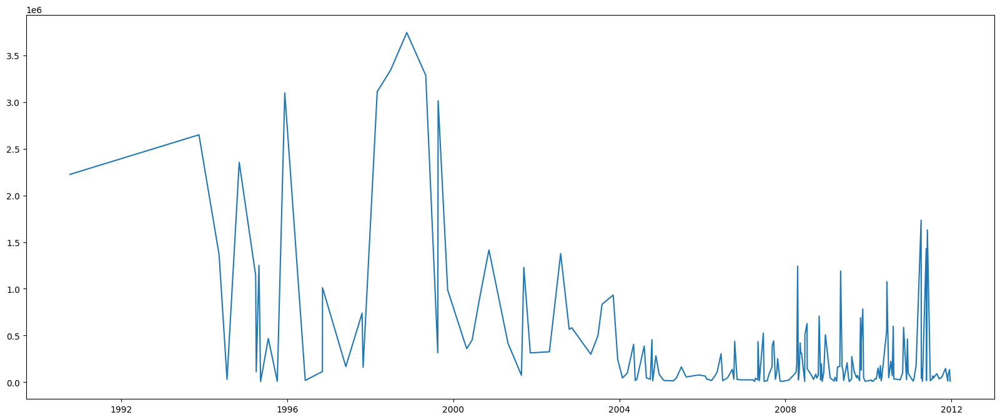

Kansas


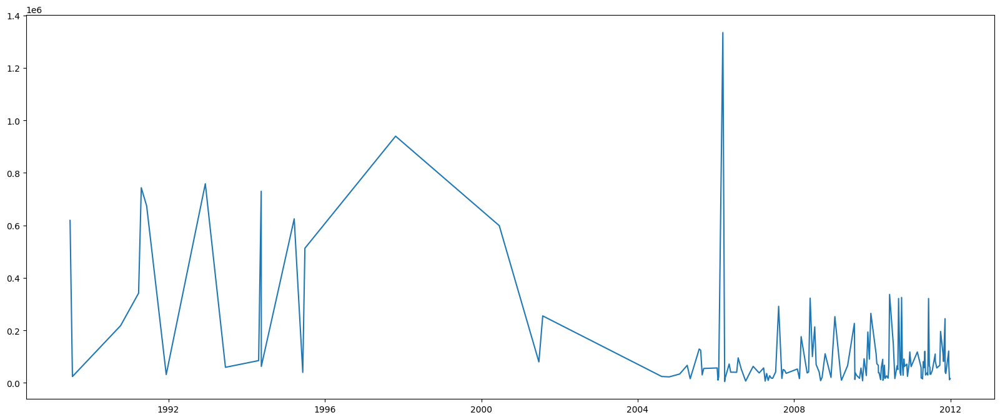

Nevada


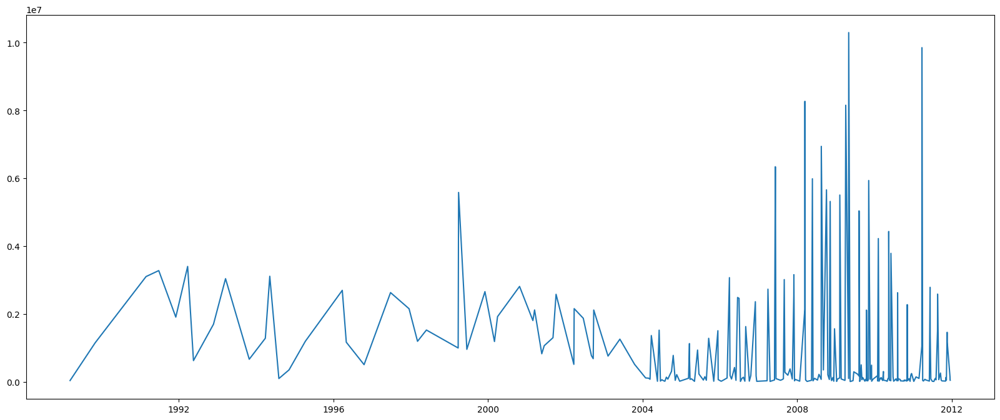

Iowa


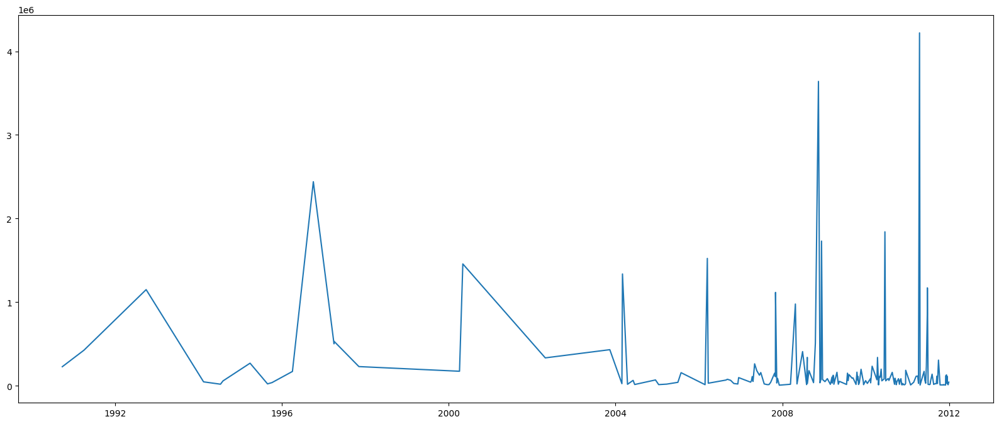

Maine


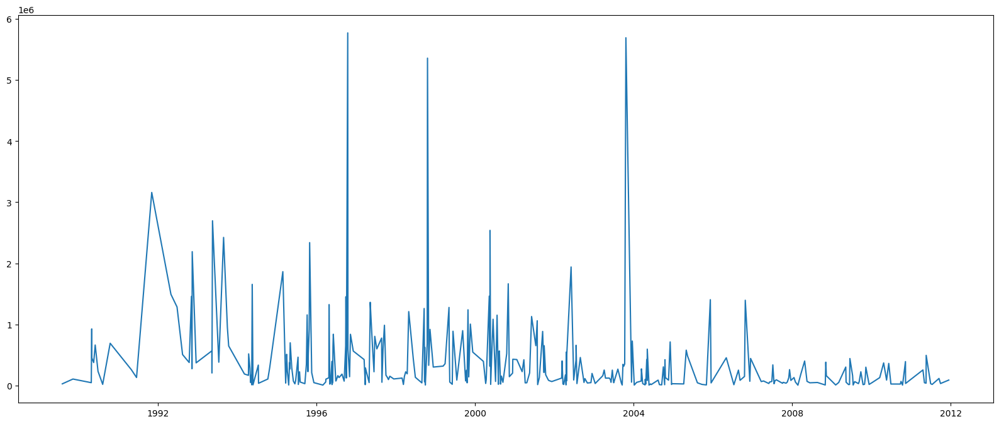

Massachusetts


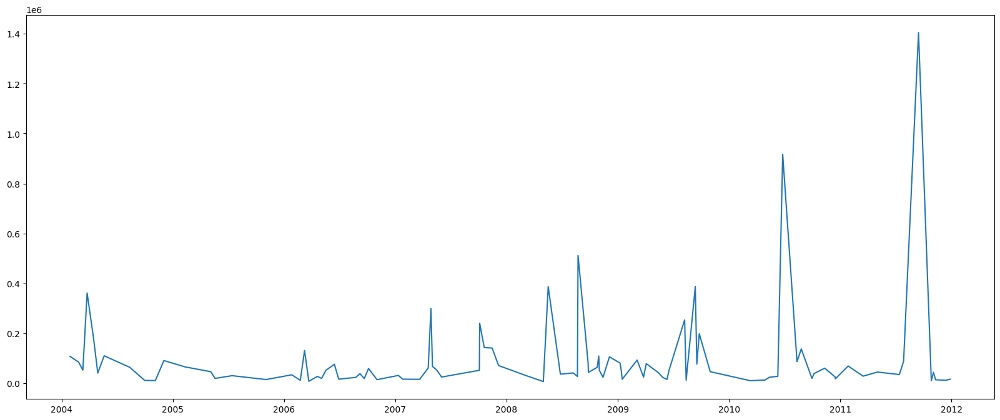

California


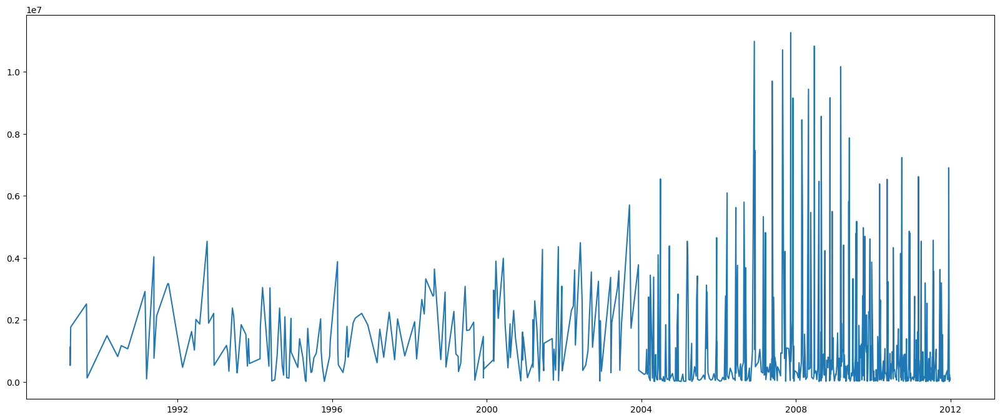

Louisiana


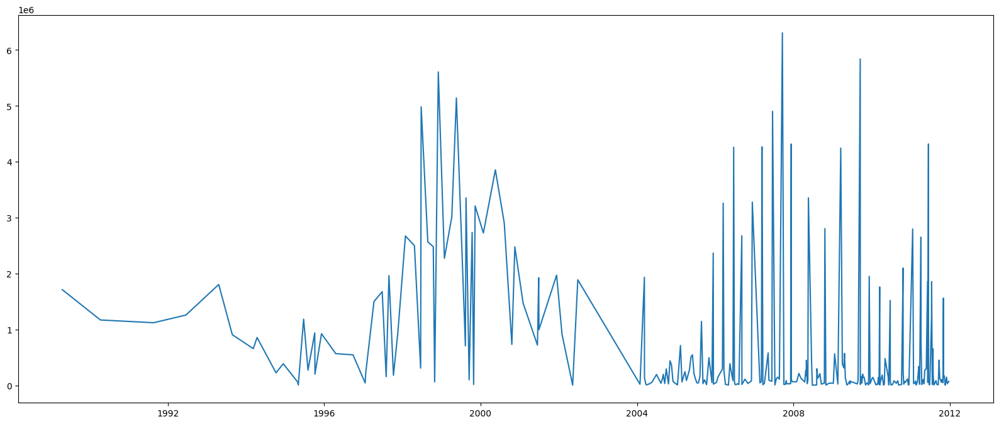

Minnesota


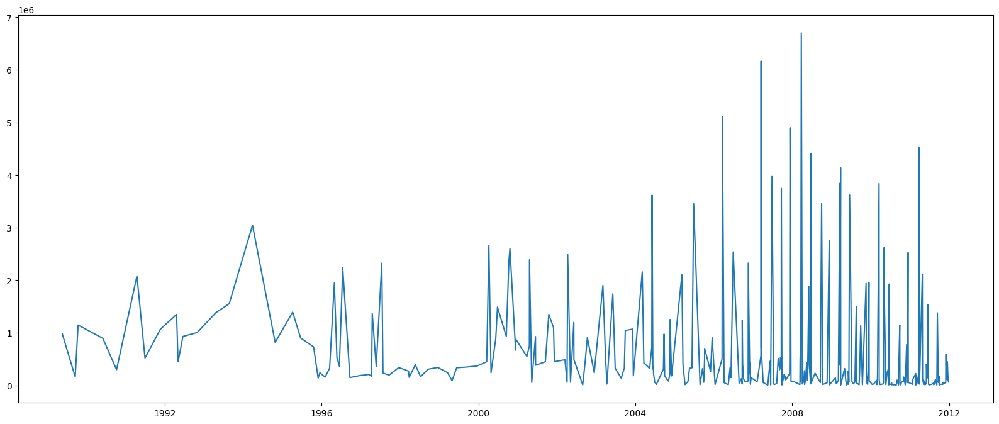

New Hampshire


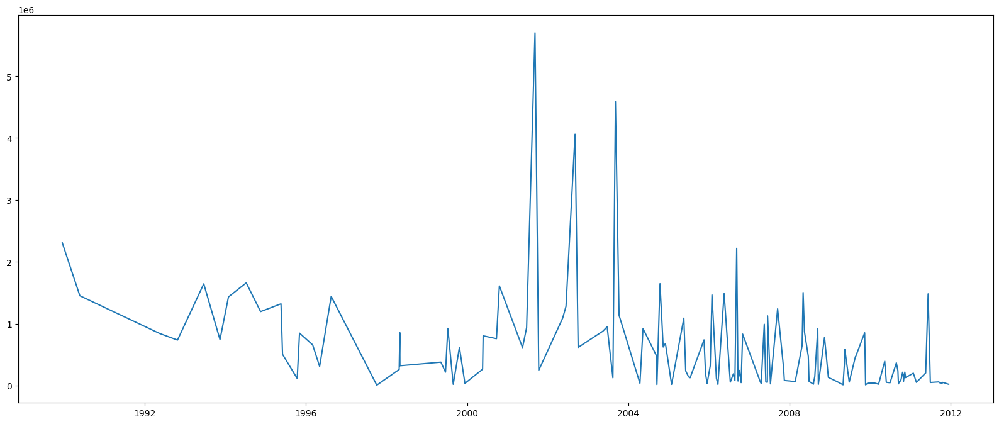

Idaho


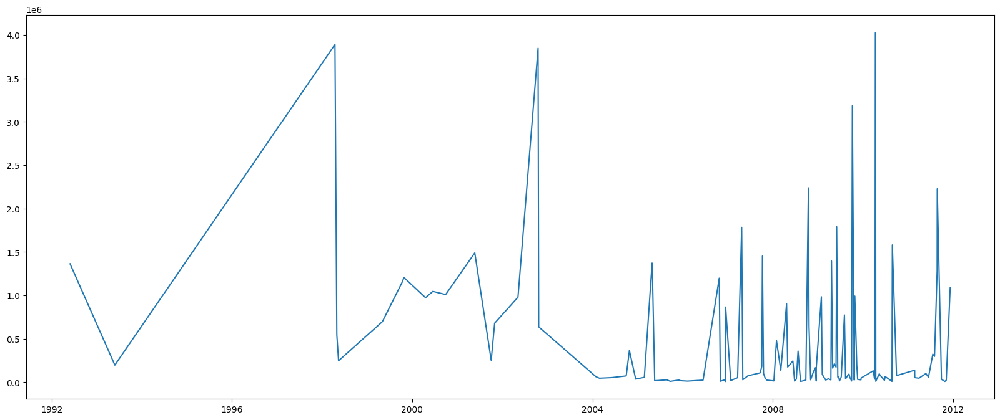

Michigan


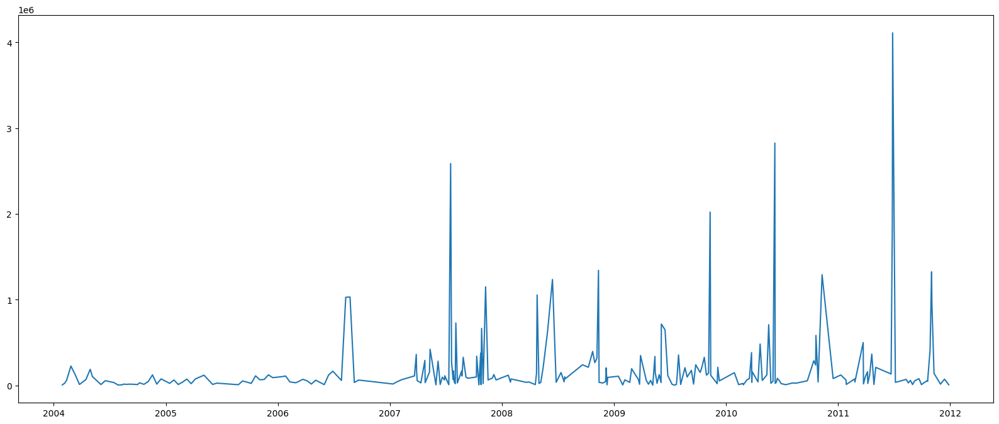

Mississippi


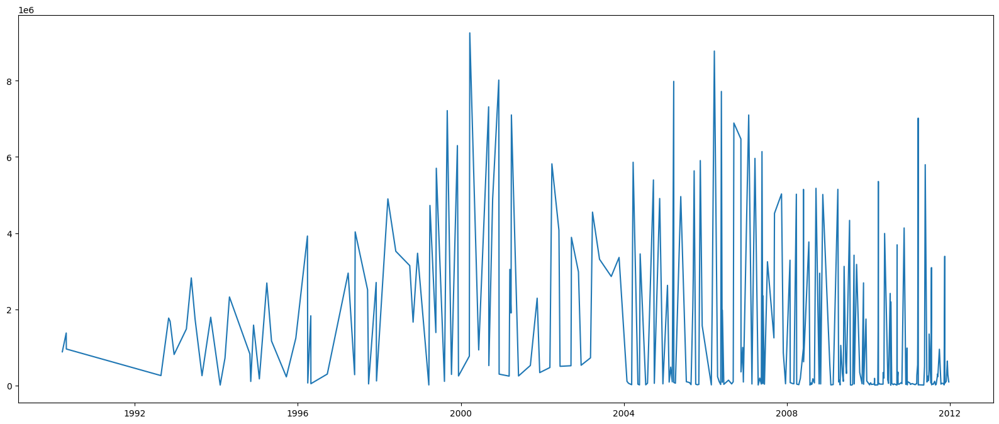

Georgia


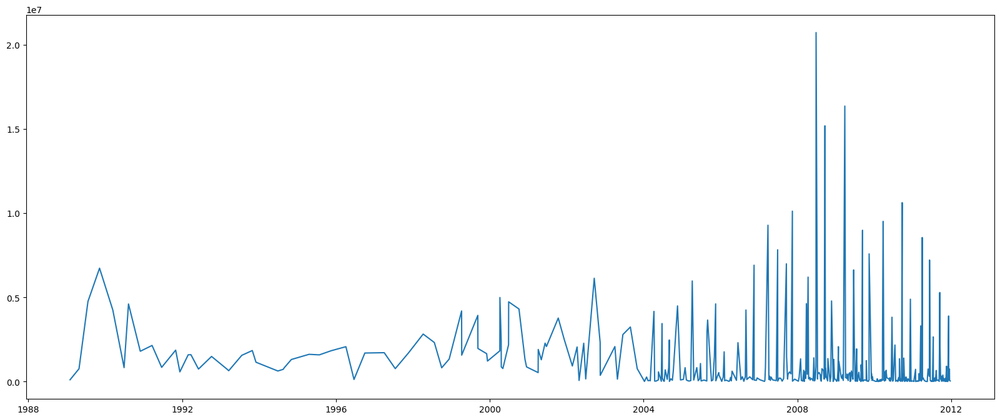

Missouri


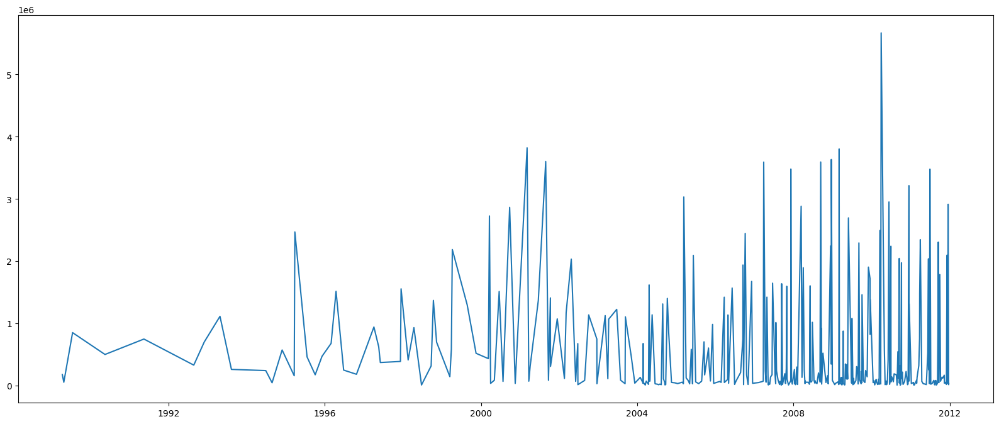

South Carolina


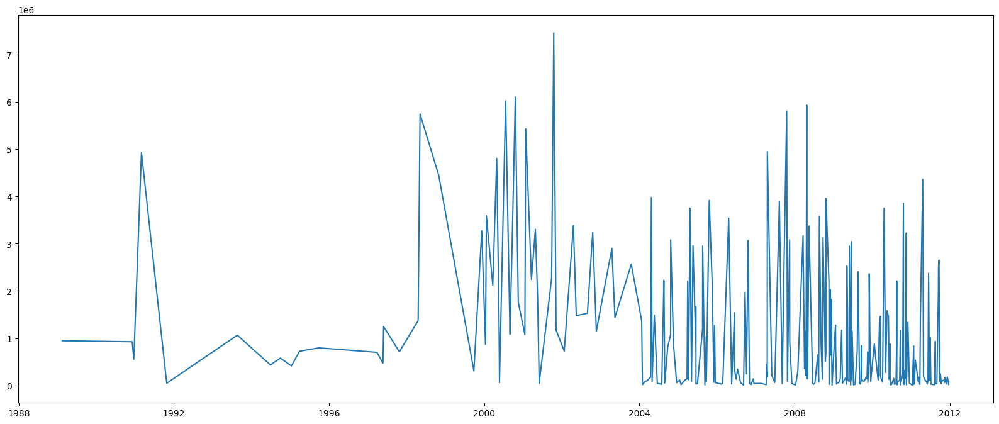

Utah


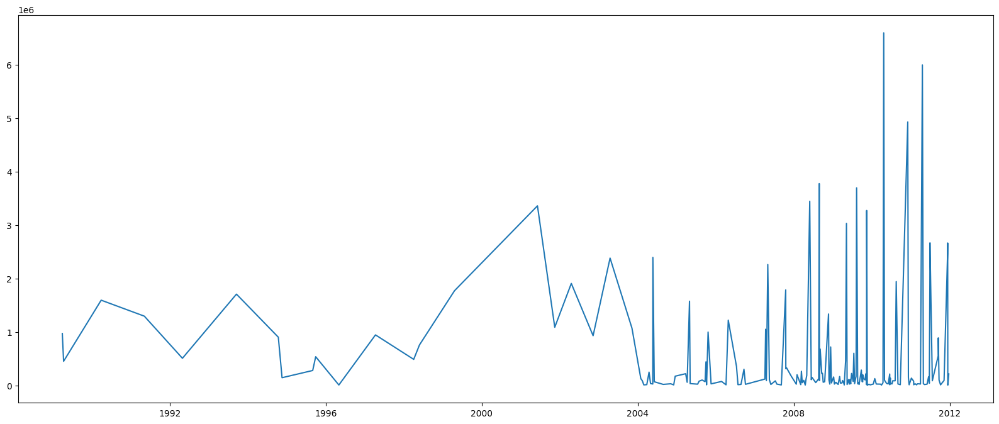

Tennessee


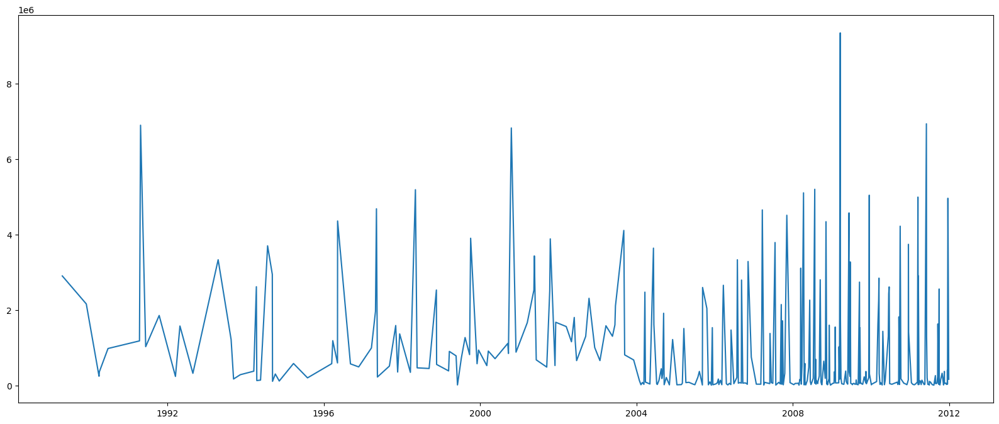

Washington


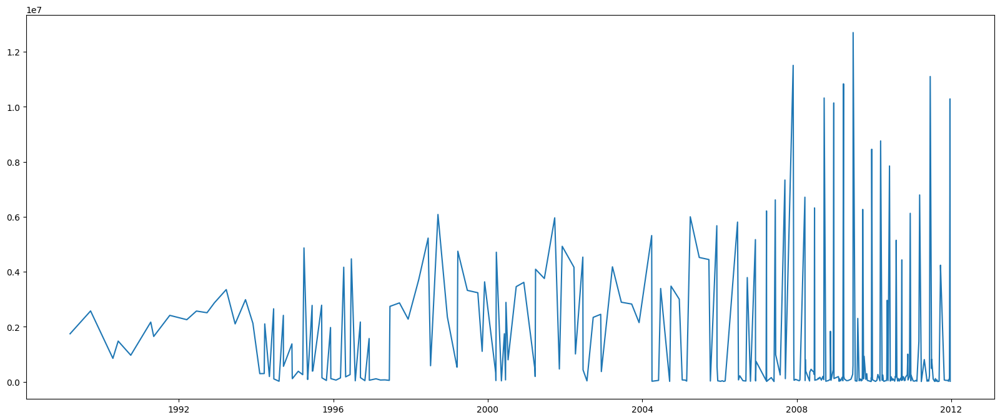

Virginia


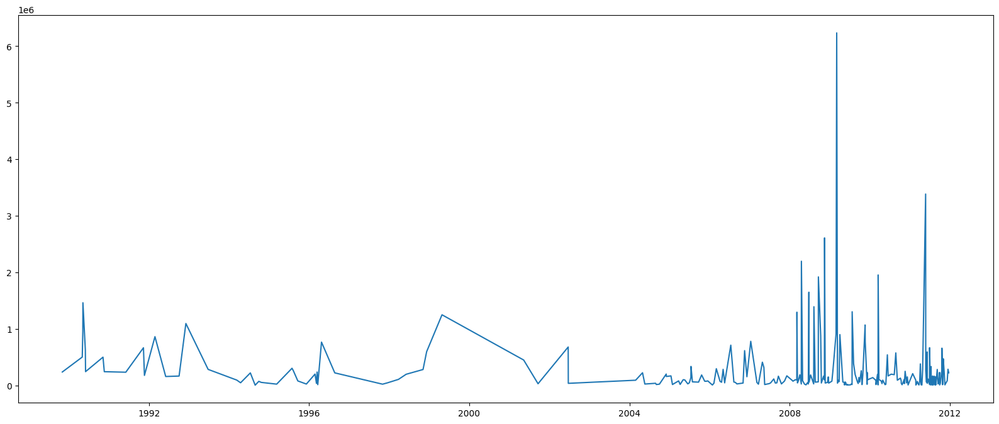

South Dakota


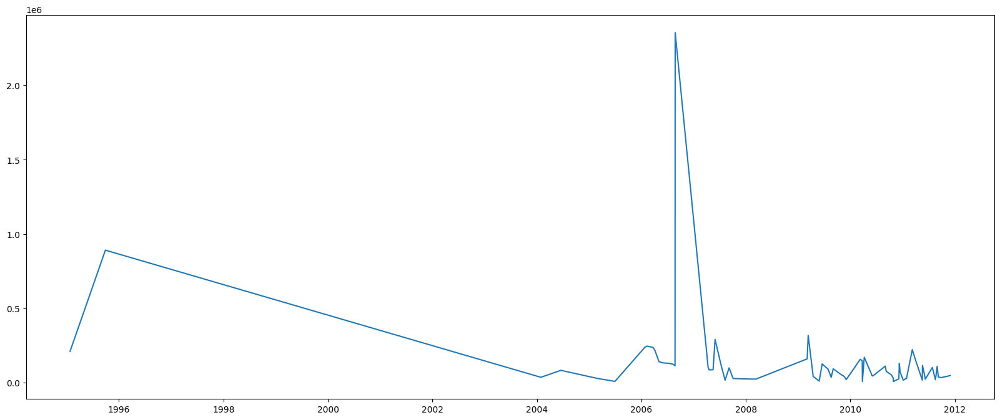

West Virginia


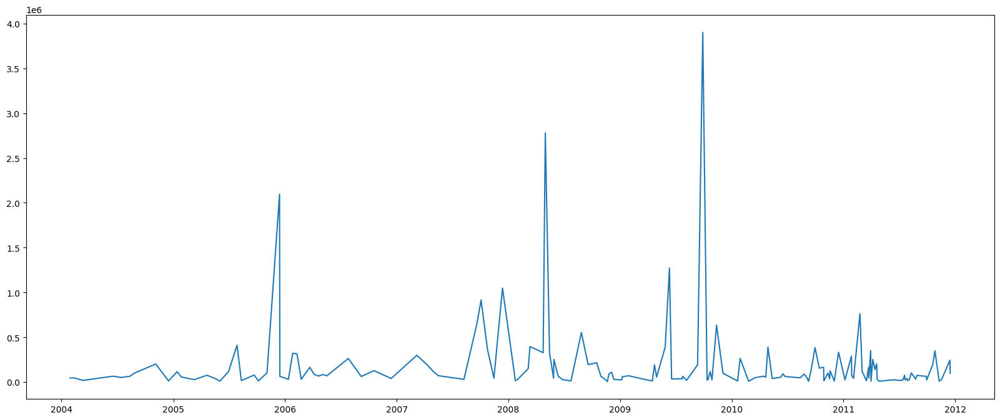

Oklahoma


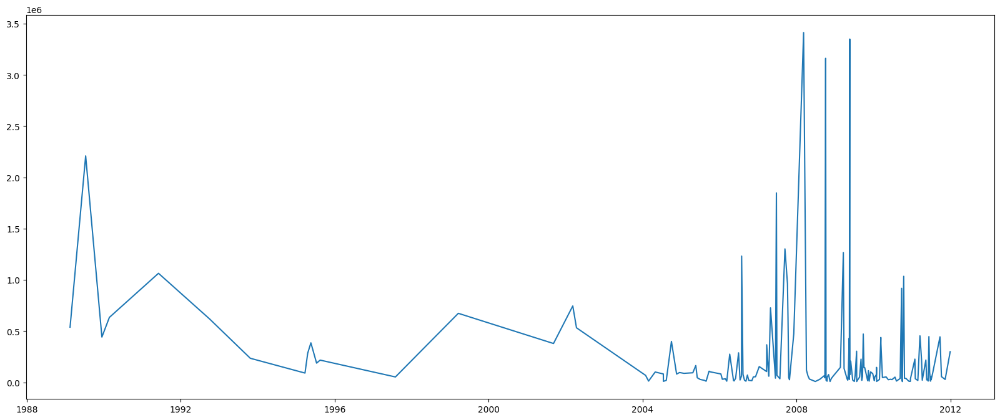

Pennsylvania


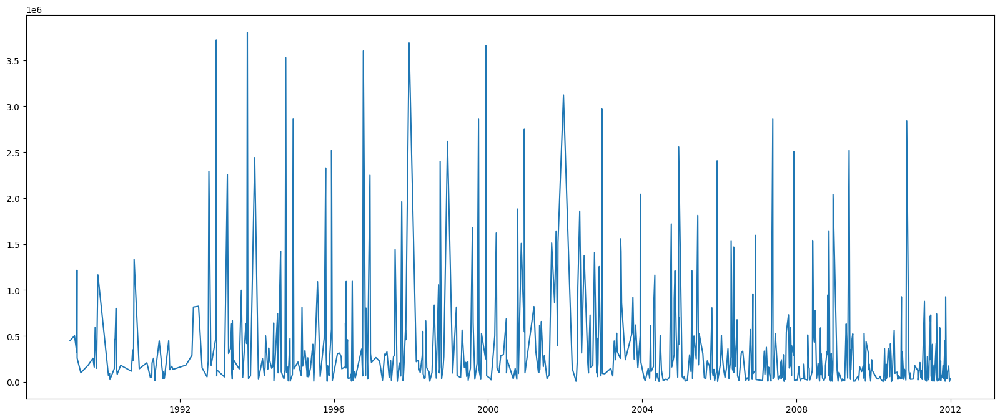

Wyoming


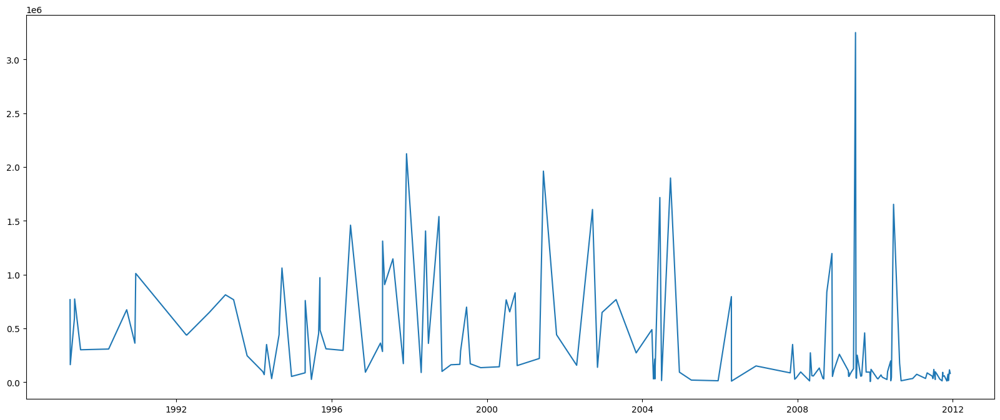

North Dakota


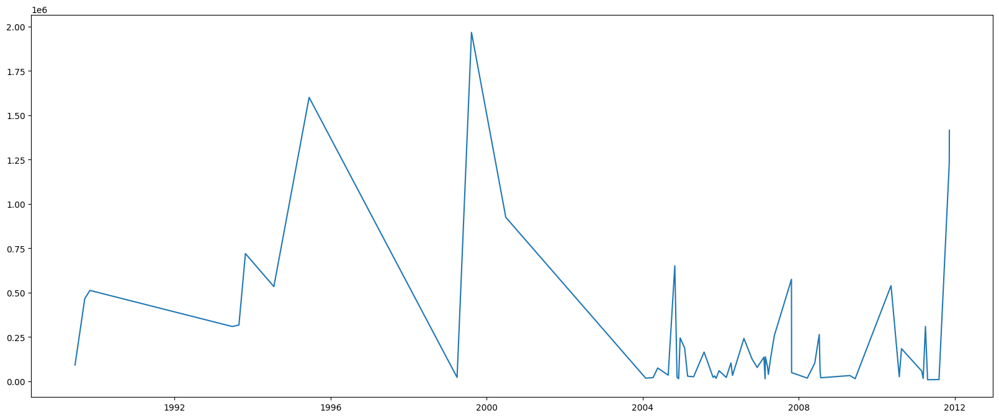

New Jersey


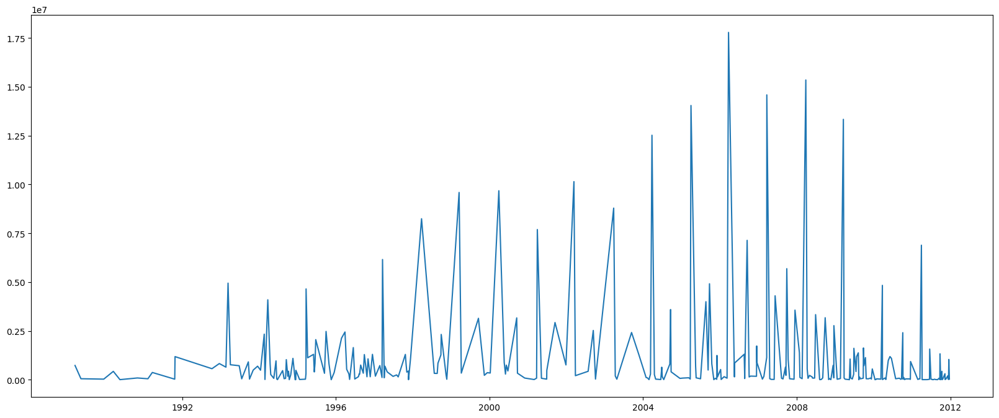

Kentucky


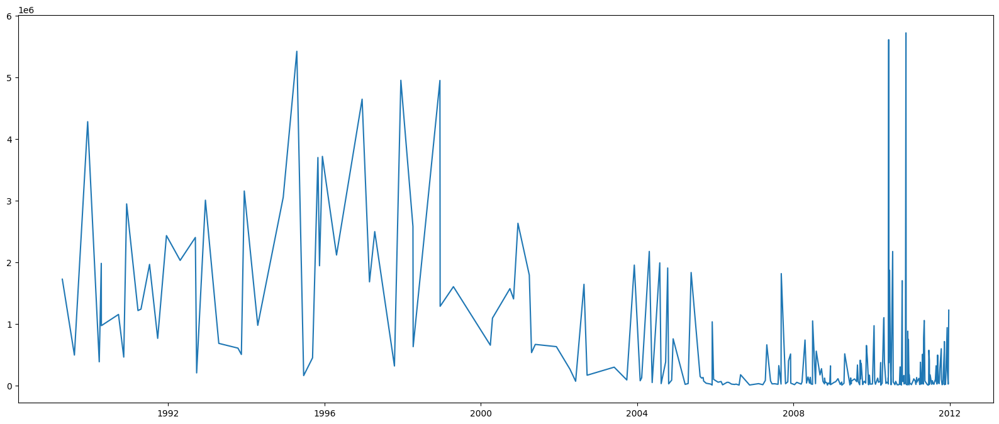

Montana


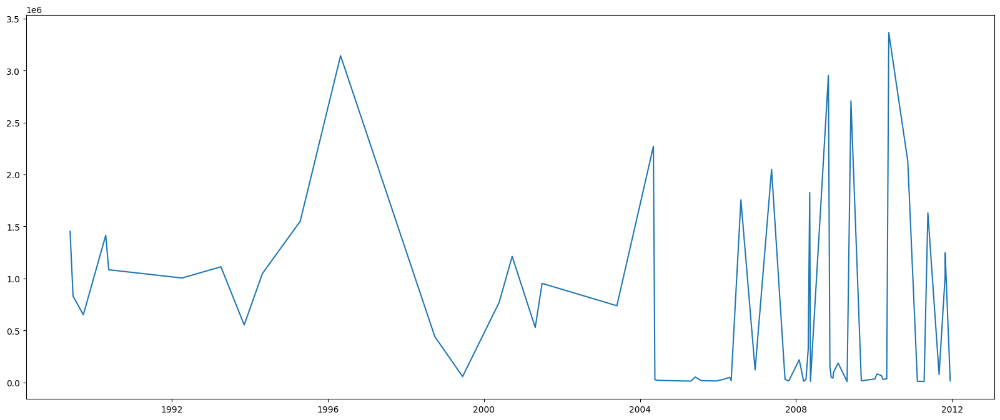

Alaska


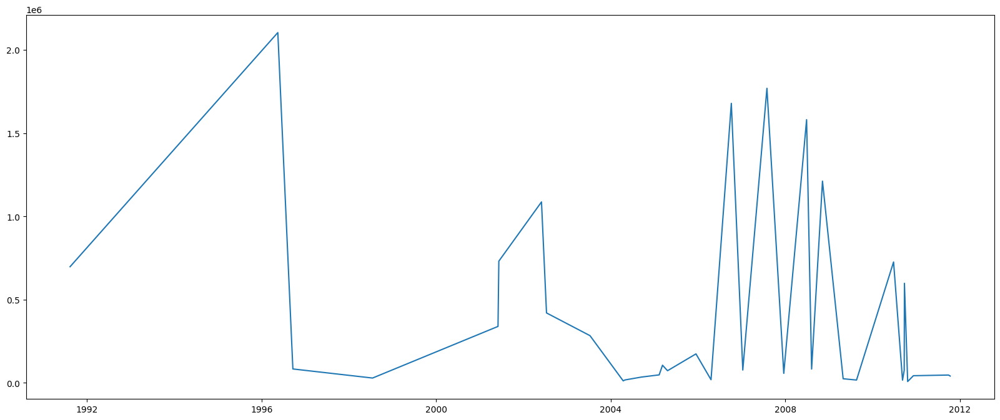

Nebraska


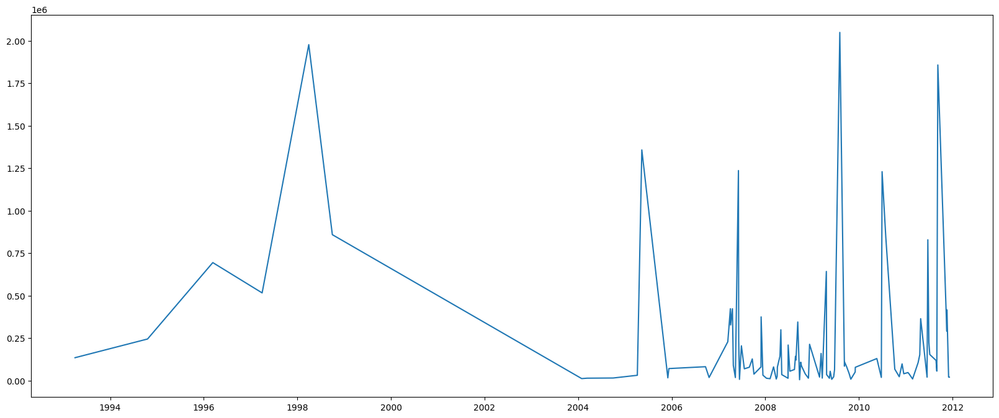

Maryland


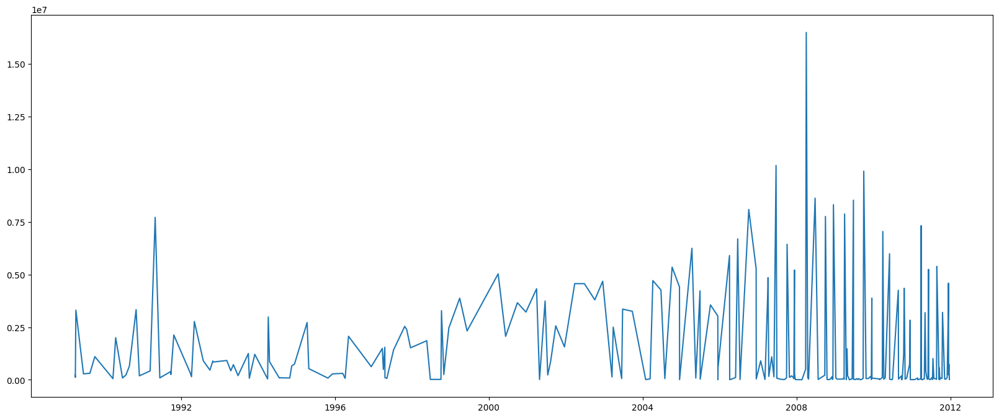

Hawaii


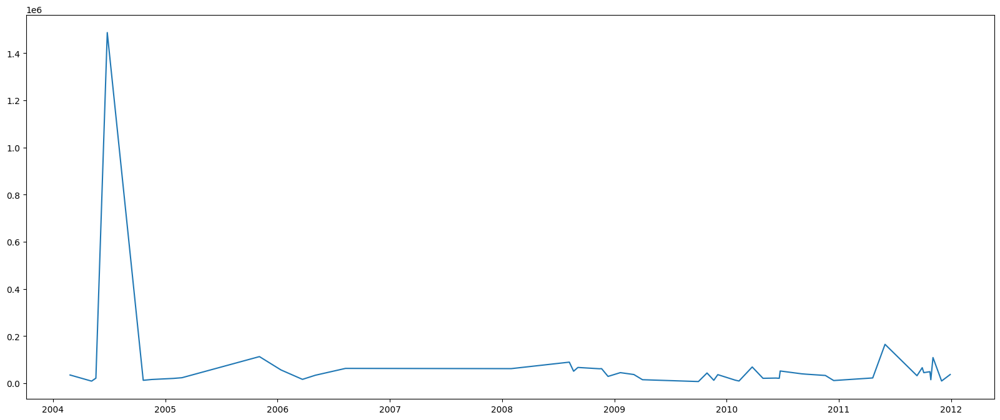

Colorado


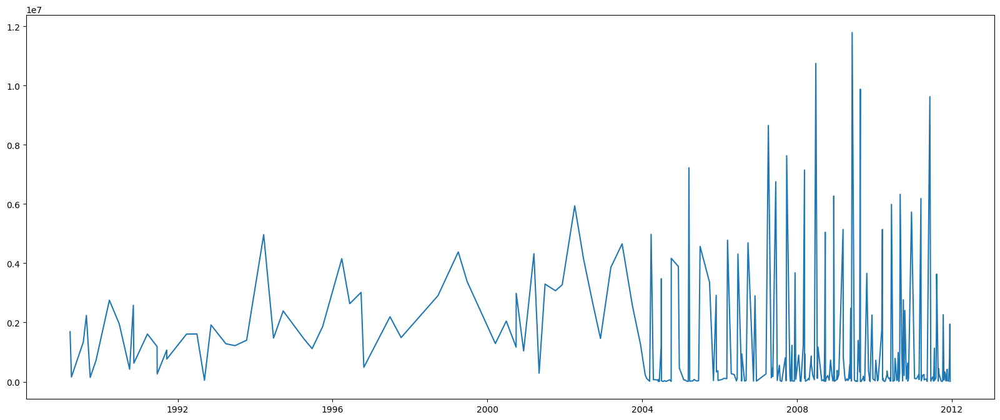

New Mexico


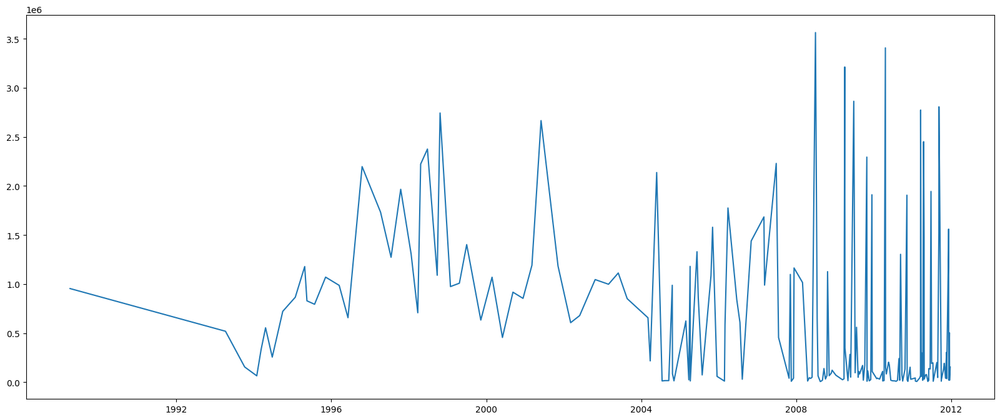

Indiana


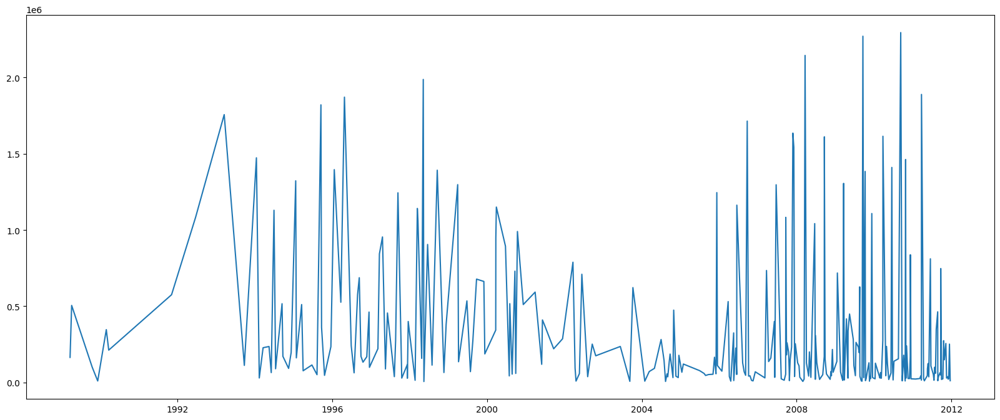

Connecticut


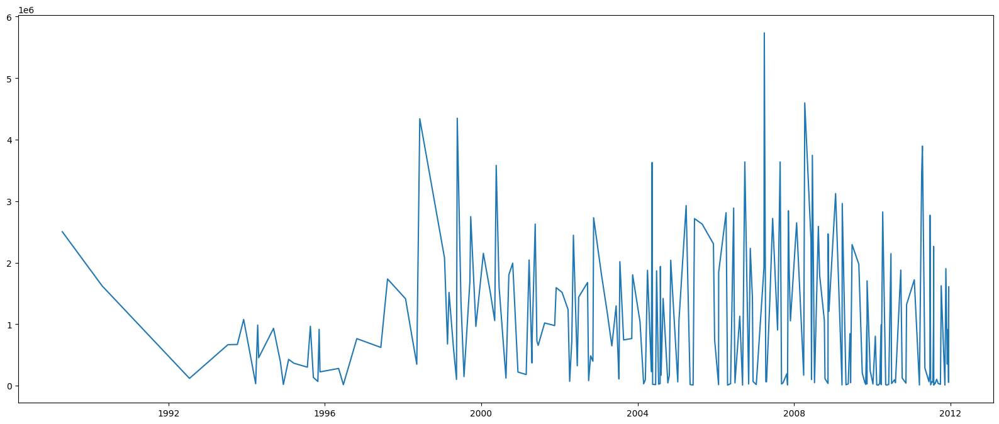

Delaware


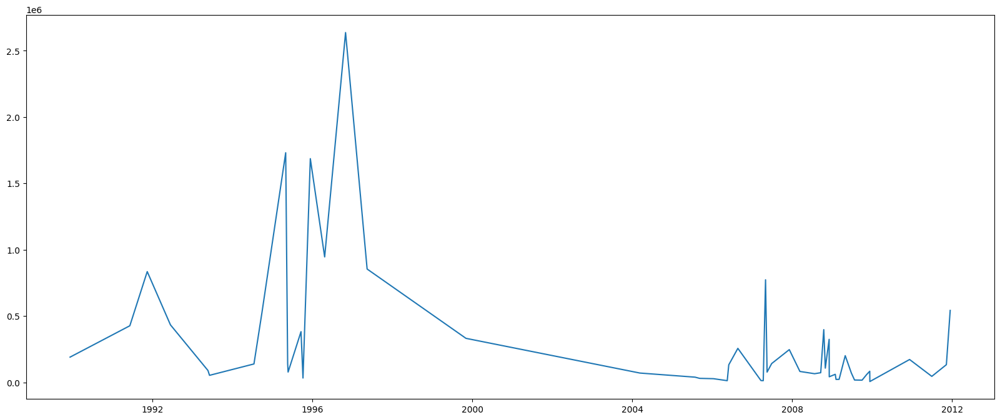

Rhode Island


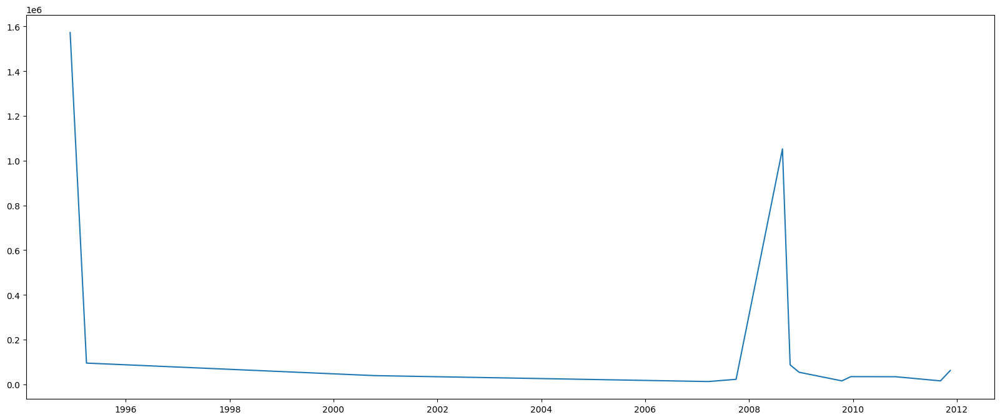

Vermont


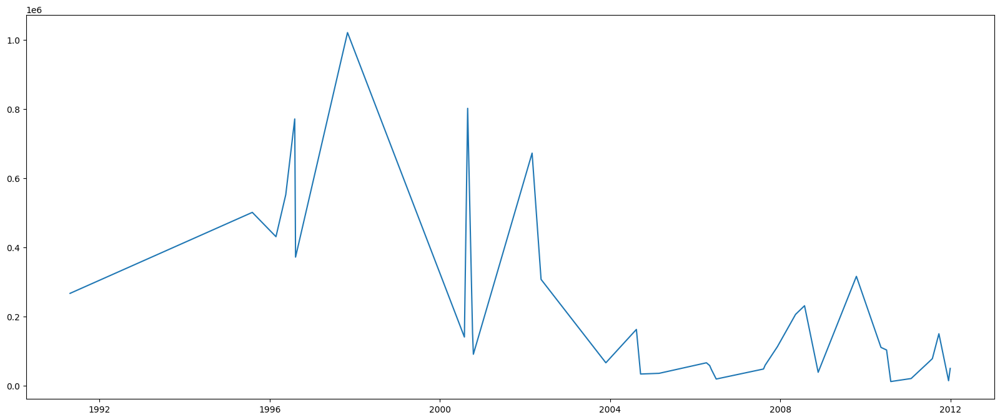

Washington DC


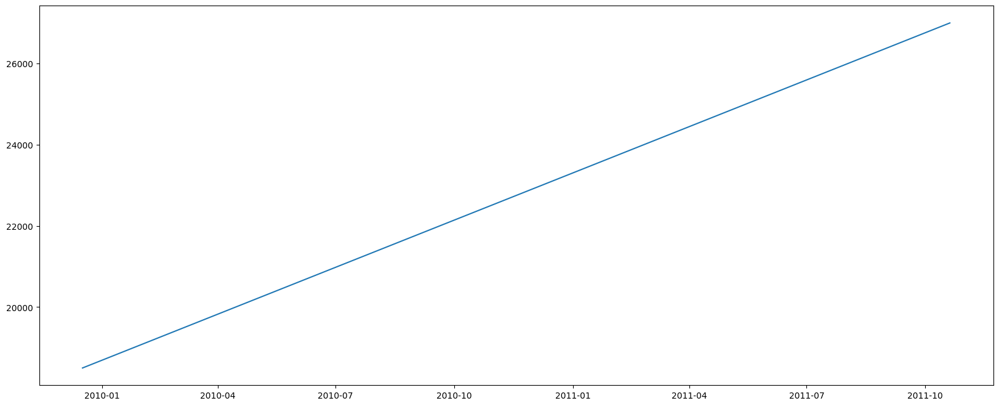

Puerto Rico


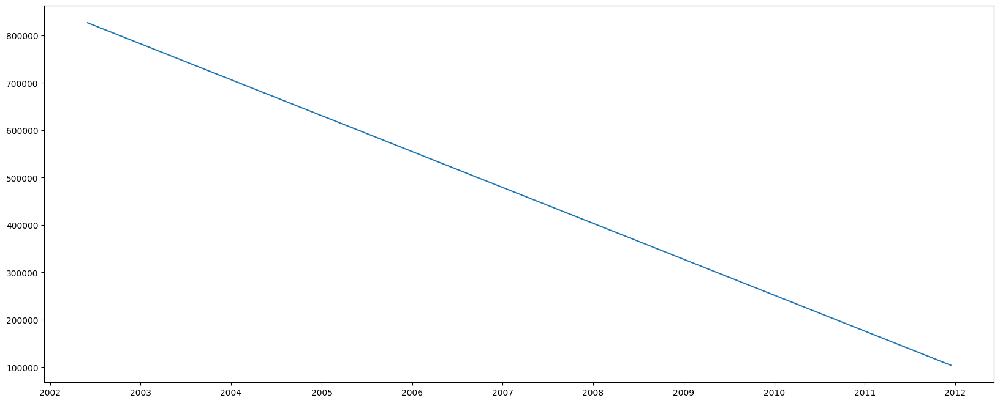

Unspecified


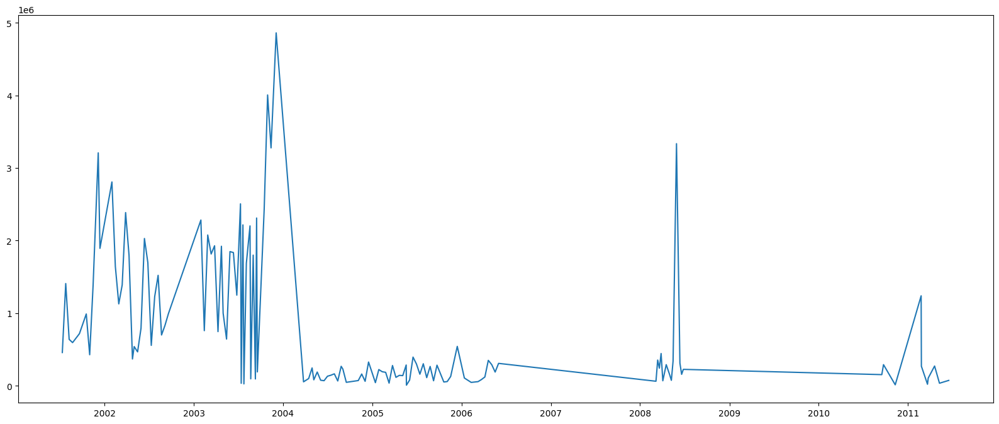

In [15]:
for state in df_raw.state.unique():
    print(state)
    plt.figure(figsize=(20,8))
    temp_df = df_raw.loc[df_raw['state'] == state].sort_values('saledate', ascending=True).groupby(by=['saledate']).agg({'SalePrice': 'sum'})
    plt.plot(temp_df['SalePrice'], label='Sale Price')
    plt.show()

# 2. Data Preprocessing

### $\bullet$ Variable to predict

[Back to top](#plan)

In [16]:
# Adding original values to a list
sale_prices = df_raw.SalePrice.tolist()

# Converting into log values
df_raw.SalePrice = np.log(df_raw.SalePrice)
df_raw.SalePrice


0         11.097410
1         10.950807
2          9.210340
3         10.558414
4          9.305651
            ...    
401120     9.259131
401121     9.305651
401122     9.350102
401123     9.104980
401124     8.955448
Name: SalePrice, Length: 401125, dtype: float64

### $\bullet$ Convert date times

[Back to top](#plan)

In [17]:
df_raw.saledate

0        2006-11-16
1        2004-03-26
2        2004-02-26
3        2011-05-19
4        2009-07-23
            ...    
401120   2011-11-02
401121   2011-11-02
401122   2011-11-02
401123   2011-10-25
401124   2011-10-25
Name: saledate, Length: 401125, dtype: datetime64[ns]

In [18]:
fld = df_raw.saledate
fld

0        2006-11-16
1        2004-03-26
2        2004-02-26
3        2011-05-19
4        2009-07-23
            ...    
401120   2011-11-02
401121   2011-11-02
401122   2011-11-02
401123   2011-10-25
401124   2011-10-25
Name: saledate, Length: 401125, dtype: datetime64[ns]

In [19]:
from copy import deepcopy
df_backup = deepcopy(df_raw)

In [20]:
# add_datepart adds new columns to the dataframe, INPLACE
add_datepart(df_raw, 'saledate')

In [21]:
# comparison of dataframe shape before & after applying add_datepart
print(df_backup.shape)
print(df_raw.shape)

(401125, 53)
(401125, 64)


In [22]:
df_raw.columns

Index(['SalesID', 'SalePrice', 'MachineID', 'ModelID', 'datasource',
       'auctioneerID', 'YearMade', 'MachineHoursCurrentMeter', 'UsageBand',
       'fiModelDesc', 'fiBaseModel', 'fiSecondaryDesc', 'fiModelSeries',
       'fiModelDescriptor', 'ProductSize', 'fiProductClassDesc', 'state',
       'ProductGroup', 'ProductGroupDesc', 'Drive_System', 'Enclosure',
       'Forks', 'Pad_Type', 'Ride_Control', 'Stick', 'Transmission',
       'Turbocharged', 'Blade_Extension', 'Blade_Width', 'Enclosure_Type',
       'Engine_Horsepower', 'Hydraulics', 'Pushblock', 'Ripper', 'Scarifier',
       'Tip_Control', 'Tire_Size', 'Coupler', 'Coupler_System',
       'Grouser_Tracks', 'Hydraulics_Flow', 'Track_Type',
       'Undercarriage_Pad_Width', 'Stick_Length', 'Thumb', 'Pattern_Changer',
       'Grouser_Type', 'Backhoe_Mounting', 'Blade_Type', 'Travel_Controls',
       'Differential_Type', 'Steering_Controls', 'saleYear', 'saleMonth',
       'saleDay', 'saleDayofweek', 'saleDayofyear', 'saleIs_mont

### $\bullet$ Convert strings into numbered categories

[Back to top](#plan)

In [23]:
# This function maps the categorical variables to integers

train_cats(df_raw)

In [24]:
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 401125 entries, 0 to 401124
Data columns (total 64 columns):
 #   Column                    Non-Null Count   Dtype   
---  ------                    --------------   -----   
 0   SalesID                   401125 non-null  int64   
 1   SalePrice                 401125 non-null  float64 
 2   MachineID                 401125 non-null  int64   
 3   ModelID                   401125 non-null  int64   
 4   datasource                401125 non-null  int64   
 5   auctioneerID              380989 non-null  float64 
 6   YearMade                  401125 non-null  int64   
 7   MachineHoursCurrentMeter  142765 non-null  float64 
 8   UsageBand                 69639 non-null   object  
 9   fiModelDesc               401125 non-null  category
 10  fiBaseModel               401125 non-null  category
 11  fiSecondaryDesc           263934 non-null  object  
 12  fiModelSeries             56908 non-null   object  
 13  fiModelDescriptor         719

In [26]:
df_raw.UsageBand = df_raw.UsageBand.astype('category')

df_raw.UsageBand.cat.categories.tolist()

df_raw.UsageBand = df_raw.UsageBand.cat.set_categories(['Low', 'Medium', 'High'], ordered=True)

# This step overwrites the raw categories with integers
df_raw.UsageBand = df_raw.UsageBand.cat.codes

# -1 values corresponds to NaN values in the original column
df_raw.UsageBand

0         0
1         0
2         2
3         2
4         1
         ..
401120   -1
401121   -1
401122   -1
401123   -1
401124   -1
Name: UsageBand, Length: 401125, dtype: int8

### $\bullet$ Inspect missing values

[Back to top](#plan)

In [27]:
display_all(df_raw.isnull().describe().T)

,count,unique,top,freq
SalesID,401125,1,False,401125
SalePrice,401125,1,False,401125
MachineID,401125,1,False,401125
ModelID,401125,1,False,401125
datasource,401125,1,False,401125
auctioneerID,401125,2,False,380989
YearMade,401125,1,False,401125
MachineHoursCurrentMeter,401125,2,True,258360
UsageBand,401125,1,False,401125
fiModelDesc,401125,1,False,401125


In [28]:
# display the percentage of missing values per column :

display_all(df_raw.isnull().sum().sort_index()*100/len(df_raw))

# column name          ratio of nans

Backhoe_Mounting            80.387161
Blade_Extension             93.712932
Blade_Type                  80.097725
Blade_Width                 93.712932
Coupler                     46.662013
Coupler_System              89.165971
Differential_Type           82.695918
Drive_System                73.982923
Enclosure                    0.081022
Enclosure_Type              93.712932
Engine_Horsepower           93.712932
Forks                       52.115425
Grouser_Tracks              89.189903
Grouser_Type                75.281271
Hydraulics                  20.082269
Hydraulics_Flow             89.189903
MachineHoursCurrentMeter    64.408850
MachineID                    0.000000
ModelID                      0.000000
Pad_Type                    80.271985
Pattern_Changer             75.265067
ProductGroup                 0.000000
ProductGroupDesc             0.000000
ProductSize                 52.545964
Pushblock                   93.712932
Ride_Control                62.952696
Ripper      

In [29]:
# Saving the preprocessed data

path_to_tmp = os.path.join(path_to_bulldozers,"Data Files")
os.makedirs(path_to_tmp, exist_ok = True)
path_to_bulldozers_raw = os.path.join(path_to_tmp, 'bulldozers-raw')

# Saving in this format to save memory
df_raw.to_feather(path_to_bulldozers_raw)

In [30]:
path_to_bulldozers_raw = os.path.join(path_to_bulldozers, 'bulldozers-raw')
df_raw = pd.read_feather(path_to_bulldozers + '/Data Files/bulldozers-raw')

In [31]:
# This function deals with missing values and numericalizes data
df, y, nas = proc_df(df_raw, 'SalePrice')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 401125 entries, 0 to 401124
Data columns (total 65 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   SalesID                      401125 non-null  int64  
 1   MachineID                    401125 non-null  int64  
 2   ModelID                      401125 non-null  int64  
 3   datasource                   401125 non-null  int64  
 4   auctioneerID                 401125 non-null  float64
 5   YearMade                     401125 non-null  int64  
 6   MachineHoursCurrentMeter     401125 non-null  float64
 7   UsageBand                    401125 non-null  int8   
 8   fiModelDesc                  401125 non-null  int16  
 9   fiBaseModel                  401125 non-null  int16  
 10  fiSecondaryDesc              401125 non-null  int16  
 11  fiModelSeries                401125 non-null  int8   
 12  fiModelDescriptor            401125 non-null  int16  
 13 

In [32]:
df.head()

,SalesID,MachineID,ModelID,datasource,auctioneerID,YearMade,MachineHoursCurrentMeter,UsageBand,fiModelDesc,fiBaseModel,...,saleDayofyear,saleIs_month_end,saleIs_month_start,saleIs_quarter_end,saleIs_quarter_start,saleIs_year_end,saleIs_year_start,saleElapsed,auctioneerID_na,MachineHoursCurrentMeter_na
0,1139246,999089,3157,121,3.0,2004,68.0,0,950,296,...,320,False,False,False,False,False,False,1163635200,False,False
1,1139248,117657,77,121,3.0,1996,4640.0,0,1725,527,...,86,False,False,False,False,False,False,1080259200,False,False
2,1139249,434808,7009,121,3.0,2001,2838.0,2,331,110,...,57,False,False,False,False,False,False,1077753600,False,False
3,1139251,1026470,332,121,3.0,2001,3486.0,2,3674,1375,...,139,False,False,False,False,False,False,1305763200,False,False
4,1139253,1057373,17311,121,3.0,2007,722.0,1,4208,1529,...,204,False,False,False,False,False,False,1248307200,False,False


We now have something we can pass to a random forest!

# 3. Regression with Random Forests

### $\bullet$ Regression Model scoring, underfitting, overfitting

[Back to top](#plan)

In [33]:
n_total = len(df)
n_valid = 12000  # same as Kaggle's test set size
n_train = n_total - n_valid
n_small = 20000

print('full number of data points : {}'.format(n_total))
print('number of validation data points : {}'.format(n_valid))
print('number of training data points : {}'.format(n_train))
print('number of subsampled training points : {}'.format(n_small))

full number of data points : 401125
number of validation data points : 12000
number of training data points : 389125
number of subsampled training points : 20000


In [34]:
X_train, X_valid = split_vals(df, n_train)
y_train, y_valid = split_vals(y, n_train)

# Updated the code so that X_small is a subset of X_train and not the entire df
X_small, _ = split_vals(X_train, n_small)
y_small, _ = split_vals(y_train, n_small)

print('Number of small training data points: X = {}, y = {}'.format(X_small.shape, y_small.shape))
print('Number of full training data points: X = {}, y = {}'.format(X_train.shape, y_train.shape))
print('Number of validation data points: X = {}, y = {}'.format(X_valid.shape, y_valid.shape))

Number of small training data points: X = (20000, 65), y = (20000,)
Number of full training data points: X = (389125, 65), y = (389125,)
Number of validation data points: X = (12000, 65), y = (12000,)


### $\bullet$ Decision Tree Regressor

[Back to top](#plan)


**Option 1**: Using _sklearn.tree.DecisionTreeRegressor_

In [35]:
model_dt = DecisionTreeRegressor(
    criterion = 'squared_error', # 'mse',
    splitter = 'best',
    max_depth = 3, # None
    min_samples_split = 2,
    min_samples_leaf = 1,
    min_weight_fraction_leaf = 0.0,
    max_features = None,
    max_leaf_nodes = None,
    min_impurity_decrease = 0.0,
    ccp_alpha = 0.0,
    random_state = 42, # None,
)

In [36]:
%time model_dt.fit(X_small, y_small)
print_score(model_dt, X_small, y_small, X_valid, y_valid)

CPU times: total: 46.9 ms
Wall time: 73 ms
RMSE on train set: 0.4966
RMSE on valid set: 0.5247
R^2 on train set: 0.5015
R^2 on valid set: 0.5084


[Text(0.5, 0.875, 'Coupler_System <= 0.5\nsquared_error = 0.495\nsamples = 20000\nvalue = 10.189'),
 Text(0.25, 0.625, 'Enclosure <= 2.0\nsquared_error = 0.414\nsamples = 16815\nvalue = 10.345'),
 Text(0.125, 0.375, 'ModelID <= 4573.0\nsquared_error = 0.331\nsamples = 4400\nvalue = 9.955'),
 Text(0.0625, 0.125, 'squared_error = 0.315\nsamples = 2002\nvalue = 10.226'),
 Text(0.1875, 0.125, 'squared_error = 0.232\nsamples = 2398\nvalue = 9.728'),
 Text(0.375, 0.375, 'Enclosure <= 4.5\nsquared_error = 0.37\nsamples = 12415\nvalue = 10.484'),
 Text(0.3125, 0.125, 'squared_error = 0.29\nsamples = 7193\nvalue = 10.736'),
 Text(0.4375, 0.125, 'squared_error = 0.272\nsamples = 5222\nvalue = 10.137'),
 Text(0.75, 0.625, 'YearMade <= 1999.5\nsquared_error = 0.109\nsamples = 3185\nvalue = 9.363'),
 Text(0.625, 0.375, 'fiProductClassDesc <= 40.5\nsquared_error = 0.101\nsamples = 468\nvalue = 8.988'),
 Text(0.5625, 0.125, 'squared_error = 0.069\nsamples = 293\nvalue = 8.896'),
 Text(0.6875, 0.125, 

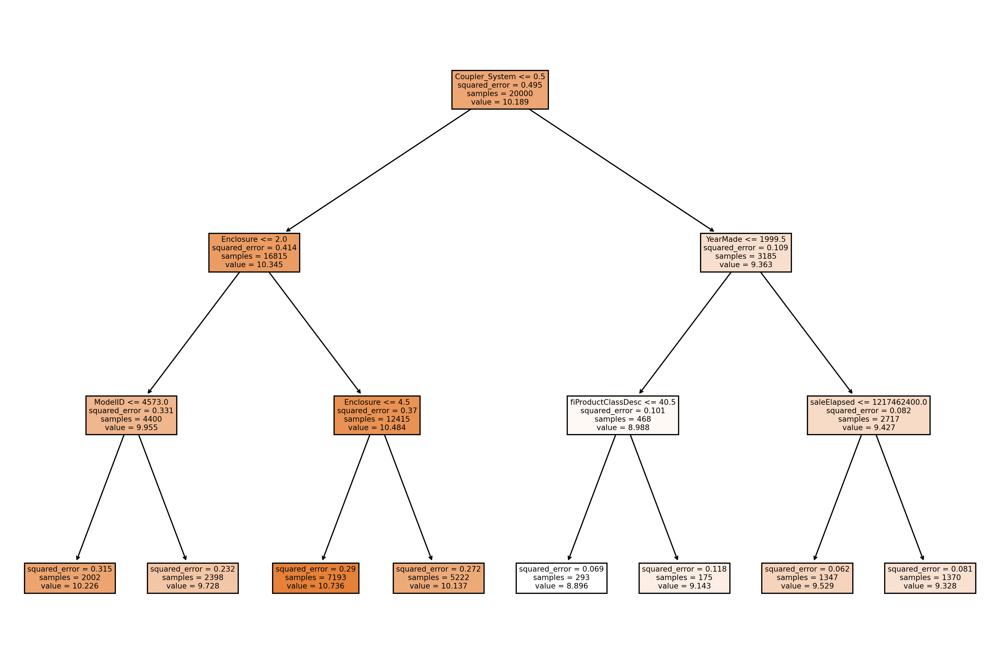

In [37]:
fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (15, 10), dpi = 300)
plot_tree(model_dt, filled = True, feature_names = list(df.columns))

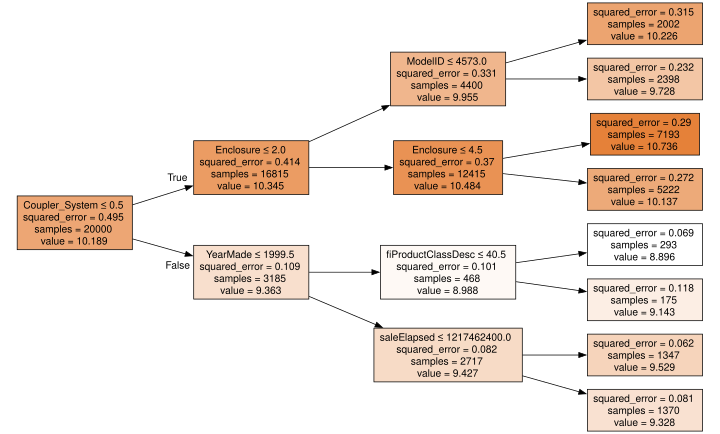

In [38]:
os.environ["PATH"] += os.pathsep + 'C:\\Program Files\\Graphviz\\bin\\'
import graphviz
draw_tree(model_dt, X_small, precision = 3)

**Option 2**: Using _sklearn.ensemble.RandomForestRegressor_

In [39]:
model_rf = RandomForestRegressor(
    # parameters shared with DecisionTreeRegressor
    n_estimators = 1, # 100 # 1 = the model is a single tree
    criterion = 'squared_error',
    max_depth = 3, # None
    min_samples_split = 2,
    min_samples_leaf = 1,
    min_weight_fraction_leaf = 0.0,
    max_features = 'sqrt',
    max_leaf_nodes = None,
    min_impurity_decrease = 0.0,
    ccp_alpha = 0.0,
    random_state = 42, # None,

    # RandomForestRegressor specific hyperparameters
    bootstrap = True, # default = True
    oob_score = True,
    max_samples = None,

    # extra parameters
    warm_start = False,
    n_jobs = -1, # None
    verbose = 0,
)

In [40]:
%time model_rf.fit(X_small, y_small)
print_score(model_rf, X_small, y_small, X_valid, y_valid)

CPU times: total: 15.6 ms
Wall time: 39.5 ms
RMSE on train set: 0.5936
RMSE on valid set: 0.6780
R^2 on train set: 0.2876
R^2 on valid set: 0.1791
R^2 on oob set: -132.9629


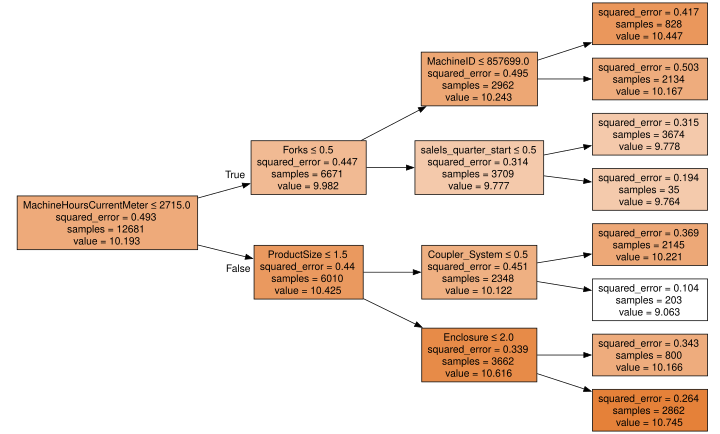

In [41]:
draw_tree(model_rf.estimators_[0], X_small, precision = 3)

### $\bullet$ Tree bagging

[Back to top](#plan)

In [47]:
point = X_valid.iloc[0,:]
print(point)

price = y_valid[0]
print(price, np.exp(price))

SalesID                           4364751
MachineID                         2300944
ModelID                               665
datasource                            172
auctioneerID                          1.0
                                  ...    
saleIs_year_end                     False
saleIs_year_start                   False
saleElapsed                    1284595200
auctioneerID_na                     False
MachineHoursCurrentMeter_na         False
Name: 389125, Length: 65, dtype: object
9.104979856318357 9000.000000000004


In [48]:
# predict takes a list as input, so we turn our single point as a list (with a single element)
base_model.predict([point])

# the model returns a list, so we take the first element, and apply exponetial
np.exp(base_model.predict([point])[0])

9127.840830212968

In [49]:
# model prediction on single data point
trees = base_model
point = [X_valid.iloc[0, :]]
pred = trees.predict(point)

print('Type:', type(pred))
print('Shape:', pred.shape)
print('Value:', np.exp(pred[0]))

Type: <class 'numpy.ndarray'>
Shape: (1,)
Value: 9127.840830212968


In [50]:
# first tree prediction on single data point
tree = base_model.estimators_[0] # chose between 0 and 9 since we have 10 estimators
point = [X_valid.iloc[0, :]]     # tree.predict takes an iterable of data points as input
pred = tree.predict(point)       # tree.predict returns a numpy tensor of predictions as output

print('Type:', type(pred))
print('Shape:', pred.shape)
print('Value:', np.exp(pred[0]))

Type: <class 'numpy.ndarray'>
Shape: (1,)
Value: 9600.000000000004


In [51]:
# first tree prediction on single data point
tree = base_model.estimators_[1] # chose between 0 and 9 since we have 10 estimators
point = [X_valid.iloc[0, :]]     # tree.predict takes an iterable of data points as input
pred = tree.predict(point)       # tree.predict returns a numpy tensor of predictions as output

print('Type:', type(pred))
print('Shape:', pred.shape)
print('Value:', np.exp(pred[0]))

Type: <class 'numpy.ndarray'>
Shape: (1,)
Value: 9000.000000000004


In [52]:
# all tree predictions on single data point
trees = base_model.estimators_
point = [X_valid.iloc[0, :]]
preds = np.asarray([tree.predict(point) for tree in trees])

print('Type:', type(preds))
print('Shape:', preds.shape)
print('Value:', np.exp(preds))

Type: <class 'numpy.ndarray'>
Shape: (10, 1)
Value: [[ 9600.]
 [ 9000.]
 [ 9000.]
 [ 8300.]
 [10000.]
 [10800.]
 [ 8000.]
 [10000.]
 [ 9000.]
 [ 8000.]]


In [53]:
# all tree predictions on all data
preds = np.stack([tree.predict(X_valid) for tree in base_model.estimators_]) # or np.asarray()

# predictions of the 10 trees, mean, and actual value (for first point in validation set)
preds.shape, preds[:,0], np.mean(preds[:,0]), y_valid[0]

((10, 12000),
 array([9.16951838, 9.10497986, 9.10497986, 9.02401079, 9.21034037,
        9.28730141, 8.98719682, 9.21034037, 9.10497986, 8.98719682]),
 9.11908445385843,
 9.104979856318357)

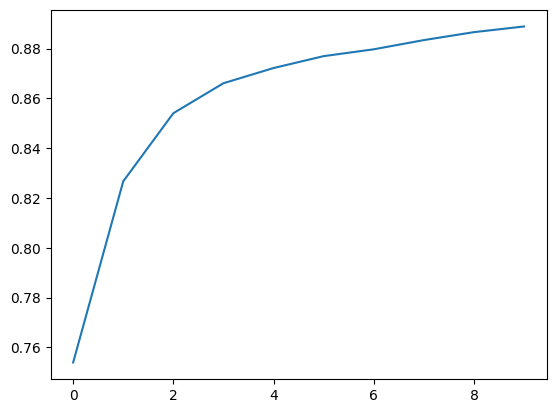

In [54]:
plt.plot([
    metrics.r2_score(y_valid, np.mean(preds[:num_trees], axis = 0))
    for num_trees in range(1, 11)
])

In [55]:
model = RandomForestRegressor(n_estimators = 20, n_jobs = -1, random_state = 42)

%time model.fit(X_small, y_small)
print_score(model, X_small, y_small, X_valid, y_valid)

CPU times: total: 16.2 s
Wall time: 992 ms
RMSE on train set: 0.0942
RMSE on valid set: 0.3306
R^2 on train set: 0.9821
R^2 on valid set: 0.8048


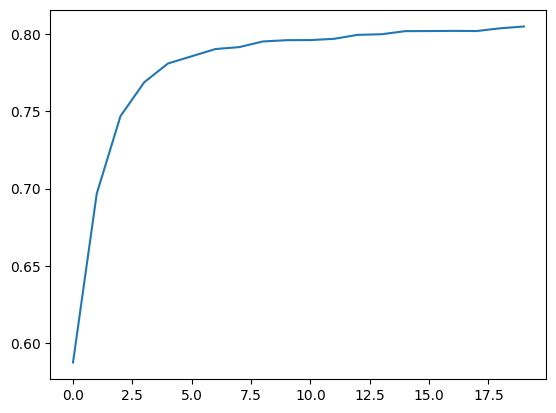

In [56]:
# all tree predictions on all data
preds = np.stack([tree.predict(X_valid) for tree in model.estimators_]) # or np.asarray()

# predictions of the 10 trees, mean, and actual value (for first point in validation set)
preds.shape, preds[:,0], np.mean(preds[:,0]), y_valid[0]

plt.plot([
    metrics.r2_score(y_valid, np.mean(preds[:num_trees], axis = 0))
    for num_trees in range(1, 21)
])

In [248]:
base_model = RandomForestRegressor(n_estimators = 10, n_jobs = -1, random_state = 42)

%time base_model.fit(X_small, y_small)
print_score(base_model, X_small, y_small, X_valid, y_valid)

CPU times: total: 5.03 s
Wall time: 692 ms
RMSE on train set: 0.1045
RMSE on valid set: 0.3381
R^2 on train set: 0.9779
R^2 on valid set: 0.7959


In [249]:
base_model = RandomForestRegressor(n_estimators = 10, max_depth = 15, min_samples_split = 15, n_jobs = -1, random_state = 42)

%time base_model.fit(X_small, y_small)
print_score(base_model, X_small, y_small, X_valid, y_valid)

CPU times: total: 2.78 s
Wall time: 481 ms
RMSE on train set: 0.1749
RMSE on valid set: 0.3302
R^2 on train set: 0.9382
R^2 on valid set: 0.8053


In [250]:
base_model = RandomForestRegressor(n_estimators = 10, n_jobs = -1, random_state = 42)

%time base_model.fit(X_train, y_train)
print_score(base_model, X_train, y_train, X_valid, y_valid)

CPU times: total: 1min 44s
Wall time: 15.8 s
RMSE on train set: 0.0906
RMSE on valid set: 0.2494
R^2 on train set: 0.9828
R^2 on valid set: 0.8889


In [57]:
model = RandomForestRegressor(n_estimators = 30, n_jobs = -1, random_state = 42)

%time model.fit(X_small, y_small)
print_score(model, X_small, y_small, X_valid, y_valid)

CPU times: total: 22 s
Wall time: 1.74 s
RMSE on train set: 0.0913
RMSE on valid set: 0.3273
R^2 on train set: 0.9831
R^2 on valid set: 0.8087


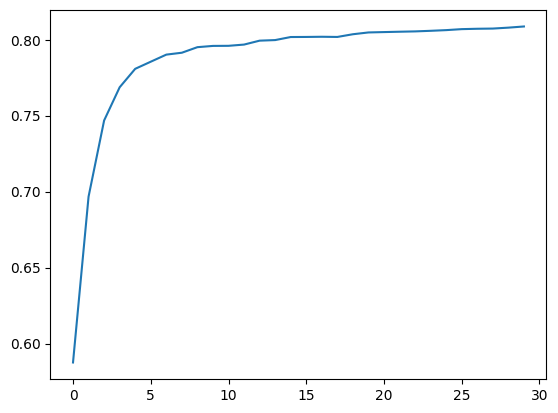

In [58]:
# all tree predictions on all data
preds = np.stack([tree.predict(X_valid) for tree in model.estimators_]) # or np.asarray()

# predictions of the 10 trees, mean, and actual value (for first point in validation set)
preds.shape, preds[:,0], np.mean(preds[:,0]), y_valid[0]

plt.plot([
    metrics.r2_score(y_valid, np.mean(preds[:num_trees], axis = 0))
    for num_trees in range(1, 31)
])

In [59]:
model = RandomForestRegressor(n_estimators = 40, n_jobs = -1, random_state = 42)

%time model.fit(X_small, y_small)
print_score(model, X_small, y_small, X_valid, y_valid)

CPU times: total: 32.8 s
Wall time: 2.01 s
RMSE on train set: 0.0894
RMSE on valid set: 0.3245
R^2 on train set: 0.9838
R^2 on valid set: 0.8119


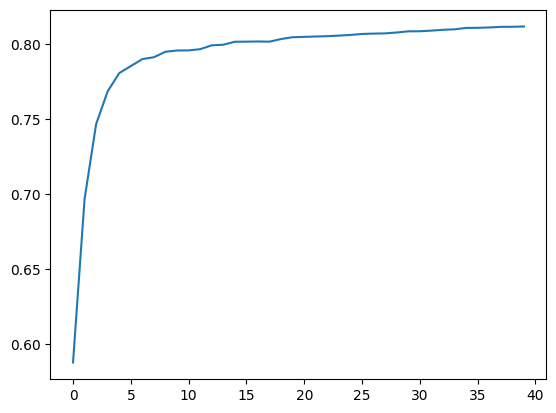

In [60]:
# all tree predictions on all data
preds = np.stack([tree.predict(X_valid) for tree in model.estimators_]) # or np.asarray()

# predictions of the 10 trees, mean, and actual value (for first point in validation set)
preds.shape, preds[:,0], np.mean(preds[:,0]), y_valid[0]

plt.plot([
    metrics.r2_score(y_valid, np.mean(preds[:num_trees], axis = 0))
    for num_trees in range(1, 41)
])

In [61]:
model = RandomForestRegressor(n_estimators = 40,  max_depth = 15, min_samples_split = 15, n_jobs = -1, random_state = 42)

%time model.fit(X_small, y_small)
print_score(model, X_small, y_small, X_valid, y_valid)

CPU times: total: 18.9 s
Wall time: 1.11 s
RMSE on train set: 0.1677
RMSE on valid set: 0.3208
R^2 on train set: 0.9431
R^2 on valid set: 0.8162


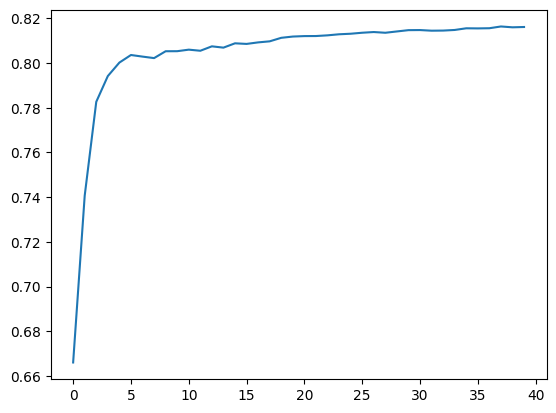

In [62]:
# all tree predictions on all data
preds = np.stack([tree.predict(X_valid) for tree in model.estimators_]) # or np.asarray()

# predictions of the 10 trees, mean, and actual value (for first point in validation set)
preds.shape, preds[:,0], np.mean(preds[:,0]), y_valid[0]

plt.plot([
    metrics.r2_score(y_valid, np.mean(preds[:num_trees], axis = 0))
    for num_trees in range(1, 41)
])

In [63]:
model = RandomForestRegressor(n_estimators = 200, n_jobs = -1, random_state = 42)

%time model.fit(X_small, y_small)
print_score(model, X_small, y_small, X_valid, y_valid)

CPU times: total: 2min 47s
Wall time: 9.96 s
RMSE on train set: 0.0851
RMSE on valid set: 0.3191
R^2 on train set: 0.9854
R^2 on valid set: 0.8182


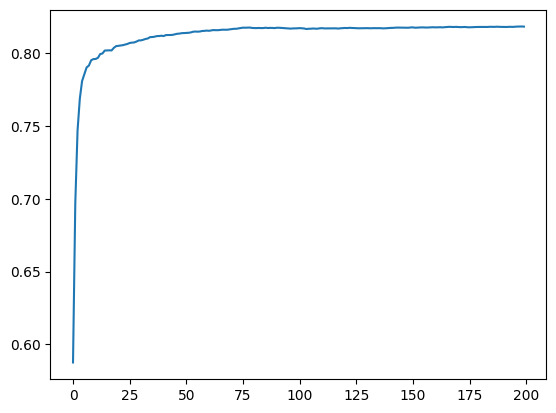

In [64]:
# all tree predictions on all data
preds = np.stack([tree.predict(X_valid) for tree in model.estimators_]) # or np.asarray()

# predictions of the 10 trees, mean, and actual value (for first point in validation set)
preds.shape, preds[:,0], np.mean(preds[:,0]), y_valid[0]

plt.plot([
    metrics.r2_score(y_valid, np.mean(preds[:num_trees], axis = 0))
    for num_trees in range(1, 201)
])

In [65]:
model = RandomForestRegressor(n_estimators = 200, max_depth = 15, min_samples_split = 15,  n_jobs = -1, random_state = 42)

%time model.fit(X_small, y_small)
print_score(model, X_small, y_small, X_valid, y_valid)

CPU times: total: 1min 33s
Wall time: 5.8 s
RMSE on train set: 0.1658
RMSE on valid set: 0.3173
R^2 on train set: 0.9445
R^2 on valid set: 0.8202


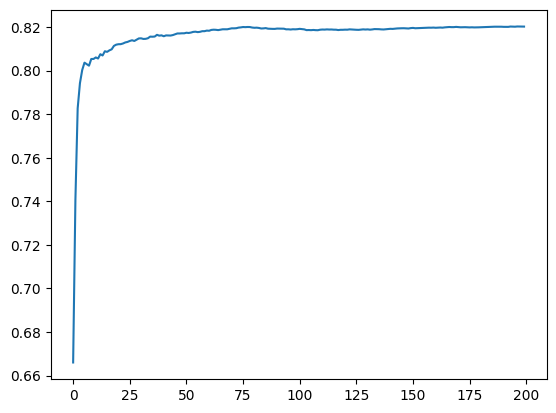

In [66]:
# all tree predictions on all data
preds = np.stack([tree.predict(X_valid) for tree in model.estimators_]) # or np.asarray()

# predictions of the 10 trees, mean, and actual value (for first point in validation set)
preds.shape, preds[:,0], np.mean(preds[:,0]), y_valid[0]

plt.plot([
    metrics.r2_score(y_valid, np.mean(preds[:num_trees], axis = 0))
    for num_trees in range(1, 201)
])

<a id='oob_score'></a>

### $\bullet$ Out-of-bag (OOB) score

[Back to top](#plan)

In [67]:
model = RandomForestRegressor(
    n_estimators = 40,
    n_jobs = -1,
    random_state = 42,

    bootstrap = True,
    oob_score = True, # default = False,
    max_samples = None,
)

%time model.fit(X_small, y_small)
print_score(model, X_small, y_small, X_valid, y_valid)

CPU times: total: 32.4 s
Wall time: 2.21 s
RMSE on train set: 0.0894
RMSE on valid set: 0.3245
R^2 on train set: 0.9838
R^2 on valid set: 0.8119
R^2 on oob set: 0.8832


In [68]:
# Take this model -NB

model = RandomForestRegressor(
    n_estimators = 40,
    n_jobs = -1,
    random_state = 42,

    bootstrap = True,
    oob_score = True, # default = False,
    max_samples = None,
)

%time model.fit(X_train, y_train)
print_score(model, X_train, y_train, X_valid, y_valid)

CPU times: total: 11min 13s
Wall time: 42.5 s
RMSE on train set: 0.0785
RMSE on valid set: 0.2362
R^2 on train set: 0.9871
R^2 on valid set: 0.9003
R^2 on oob set: 0.9084


<a id='tree_pruning'></a>

### $\bullet$ Stoping criteria

[Back to top](#plan)

In [69]:
def decision_tree_max_depth(tree):
    children_left = tree.children_left
    children_right = tree.children_right

    def walk(node_id):
        if (children_left[node_id] != children_right[node_id]):
            left_max = 1 + walk(children_left[node_id])
            right_max = 1 + walk(children_right[node_id])
            return max(left_max, right_max)
        else: # leaf
            return 1

    root_node_id = 0
    return walk(root_node_id)

Baseline model

In [70]:
model = RandomForestRegressor(
    n_estimators = 40,
    criterion = 'squared_error',

    # stoping criteria
    max_depth = None,
    min_samples_split = 2,
    min_samples_leaf = 1,
    min_weight_fraction_leaf = 0.0,
    max_leaf_nodes = None,
    min_impurity_decrease = 0.0,
    ccp_alpha = 0.0,

    # bagging parameters
    max_features = None,
    bootstrap = True,
    oob_score = True,
    max_samples = None,

    # other
    warm_start = False,
    n_jobs = -1, # None
    random_state = 42, # None,
    verbose = 0,
)

%time model.fit(X_small, y_small)
print_score(model, X_small, y_small, X_valid, y_valid)

CPU times: total: 33.3 s
Wall time: 2.2 s
RMSE on train set: 0.0894
RMSE on valid set: 0.3245
R^2 on train set: 0.9838
R^2 on valid set: 0.8119
R^2 on oob set: 0.8832


In [71]:
tree = model.estimators_[0].tree_

decision_tree_max_depth(tree)

35

In [72]:
model = RandomForestRegressor(
    n_estimators = 40,
    min_samples_split = 15,
    min_samples_leaf = 15,
    n_jobs = -1,
    random_state = 42,

    bootstrap = True,
    oob_score = True, # default = False,
    max_samples = None,
)

%time model.fit(X_small, y_small)
print_score(model, X_small, y_small, X_valid, y_valid)

CPU times: total: 14.6 s
Wall time: 994 ms
RMSE on train set: 0.2201
RMSE on valid set: 0.3288
R^2 on train set: 0.9021
R^2 on valid set: 0.8070
R^2 on oob set: 0.8640


In [73]:
tree = model.estimators_[0].tree_

decision_tree_max_depth(tree)

21

### $\bullet$ Data subsampling

[Back to top](#plan)

It turns out that one of the easiest ways to avoid over-fitting is also one of the best ways to speed up analysis: *subsampling*.<br>

**Let's return to using our full dataset**, so that we can demonstrate the impact of this technique.<br>

The basic idea is this: rather than limit the total amount of data that our model can access, let's instead limit it to a *different* random subset per tree. That way, given enough trees, the model can still see *all* the data, but for each individual tree it'll be just as fast as if we had cut down our dataset as before.

In [74]:
model = RandomForestRegressor(
    n_estimators = 40,
    n_jobs = -1,
    random_state = 42,

    bootstrap = True,
    oob_score = True, # default = False,
    max_samples = None,
)

%time model.fit(X_train, y_train)
print_score(model, X_train, y_train, X_valid, y_valid)

CPU times: total: 11min 30s
Wall time: 44.4 s
RMSE on train set: 0.0785
RMSE on valid set: 0.2362
R^2 on train set: 0.9871
R^2 on valid set: 0.9003
R^2 on oob set: 0.9084


In [75]:
model = RandomForestRegressor(
    n_estimators = 40,
    n_jobs = -1,
    random_state = 42,

    bootstrap = True,
    oob_score = True, # default = False,
    max_samples = 0.15, # default = None,
)

%time model.fit(X_train, y_train)
print_score(model, X_train, y_train, X_valid, y_valid)

CPU times: total: 2min 35s
Wall time: 18 s
RMSE on train set: 0.1910
RMSE on valid set: 0.2468
R^2 on train set: 0.9237
R^2 on valid set: 0.8912
R^2 on oob set: 0.8974


In [76]:
model = RandomForestRegressor(
    n_estimators = 200,
    n_jobs = -1,
    random_state = 42,

    bootstrap = True,
    oob_score = True, # default = False,
    max_samples = 0.15, # default = None,
)

%time model.fit(X_train, y_train)
print_score(model, X_train, y_train, X_valid, y_valid)

CPU times: total: 10min 44s
Wall time: 1min 49s
RMSE on train set: 0.1876
RMSE on valid set: 0.2426
R^2 on train set: 0.9265
R^2 on valid set: 0.8949
R^2 on oob set: 0.9009


<a id='feature_sampling'></a>

### $\bullet$ Feature subsampling

[Back to top](#plan)

In [77]:
model = RandomForestRegressor(
    n_estimators = 40,
    #max_features = 0.5, # default = 'auto'/None
    n_jobs = -1,
    random_state = 42,

    bootstrap = True,
    oob_score = True, # default = False,
    max_samples = None,
)

%time model.fit(X_small, y_small)
print_score(model, X_small, y_small, X_valid, y_valid)

CPU times: total: 27.2 s
Wall time: 4.02 s
RMSE on train set: 0.0894
RMSE on valid set: 0.3245
R^2 on train set: 0.9838
R^2 on valid set: 0.8119
R^2 on oob set: 0.8832


In [78]:
model = RandomForestRegressor(
    n_estimators = 40,
    max_features = 0.5, # default = 'auto'/None
    n_jobs = -1,
    random_state = 42,

    bootstrap = True,
    oob_score = True, # default = False,
    max_samples = None,
)

%time model.fit(X_small, y_small)
print_score(model, X_small, y_small, X_valid, y_valid)

CPU times: total: 14.3 s
Wall time: 2.29 s
RMSE on train set: 0.0870
RMSE on valid set: 0.3224
R^2 on train set: 0.9847
R^2 on valid set: 0.8143
R^2 on oob set: 0.8893


In [79]:
model = RandomForestRegressor(
    n_estimators = 40,
    max_features = 0.5, # default = 'auto'/None
    n_jobs = -1,
    random_state = 42,

    bootstrap = True,
    oob_score = True, # default = False,
    max_samples = None,
)

%time model.fit(X_train, y_train)
print_score(model, X_train, y_train, X_valid, y_valid)

CPU times: total: 4min 50s
Wall time: 31.2 s
RMSE on train set: 0.0769
RMSE on valid set: 0.2275
R^2 on train set: 0.9877
R^2 on valid set: 0.9075
R^2 on oob set: 0.9121


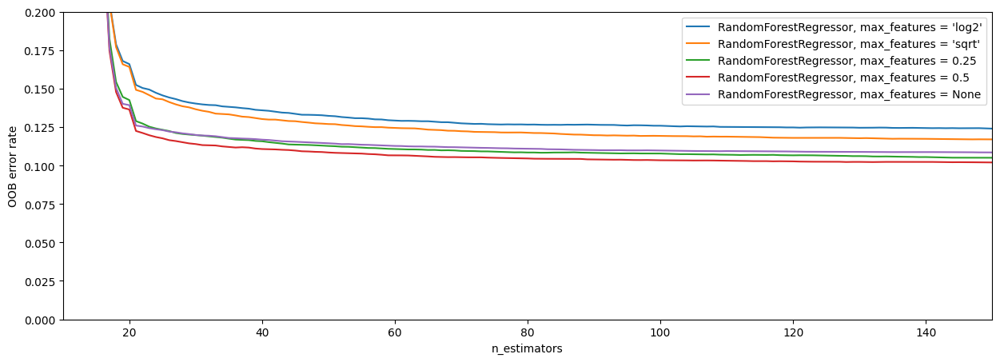

In [80]:
logging.info('warn')

# NOTE: Setting the `warm_start` construction parameter to `True` disables
# support for parallelized ensembles but is necessary for tracking the OOB
# error trajectory during training.
ensemble_clfs = [
    ("RandomForestRegressor, max_features = 'log2'",
        RandomForestRegressor(
            warm_start = True,
            oob_score = True,
            max_features = "log2",
            random_state = 42)),
    ("RandomForestRegressor, max_features = 'sqrt'",
        RandomForestRegressor(
            warm_start = True,
            oob_score = True,
            max_features = "sqrt",
            random_state = 42)),
    ("RandomForestRegressor, max_features = 0.25",
        RandomForestRegressor(
            warm_start = True,
            oob_score = True,
            max_features = 0.25,
            random_state = 42)),
    ("RandomForestRegressor, max_features = 0.5",
        RandomForestRegressor(
            warm_start = True,
            oob_score = True,
            max_features = 0.5,
            random_state = 42)),
    ("RandomForestRegressor, max_features = None",
        RandomForestRegressor(
            warm_start = True,
            oob_score = True,
            max_features = None,
            random_state = 42)),
]

# Map a classifier name to a list of (<n_estimators>, <error rate>) pairs.
error_rate = OrderedDict((label, []) for label, _ in ensemble_clfs)

# Range of `n_estimators` values to explore.
min_estimators = 10
max_estimators = 150

for label, clf in ensemble_clfs:
    for i in range(min_estimators, max_estimators + 1):
        clf.set_params(n_estimators = i)
        clf.fit(X_small, y_small)

        # Record the OOB error for each `n_estimators=i` setting.
        oob_error = 1 - clf.oob_score_
        error_rate[label].append((i, oob_error))

# Generate the "OOB error rate" vs. "n_estimators" plot.
plt.figure(figsize = (15, 5))
for label, clf_err in error_rate.items():
    xs, ys = zip(*clf_err)
    plt.plot(xs, ys, label = label)

# Show the plot
plt.xlim(min_estimators, max_estimators)
plt.ylim(0., 0.2)
plt.xlabel("n_estimators")
plt.ylabel("OOB error rate")
plt.legend(loc = "upper right")
plt.show()

#### Combining all together

In [81]:
model = RandomForestRegressor(
    n_estimators = 100,
    min_samples_split = 10,
    max_features = 0.5, # default = 'auto'/None
    n_jobs = -1,
    random_state = 42,

    bootstrap = True,
    oob_score = True, # default = False,
    max_samples = 0.75, # default = None,
)

%time model.fit(X_small, y_small)
print_score(model, X_small, y_small, X_valid, y_valid)

CPU times: total: 20.7 s
Wall time: 1.57 s
RMSE on train set: 0.1481
RMSE on valid set: 0.3254
R^2 on train set: 0.9557
R^2 on valid set: 0.8109
R^2 on oob set: 0.8912


In [82]:
model = RandomForestRegressor(
    n_estimators = 100,
    min_samples_split = 15,
    max_features = 0.75, # default = 'auto'/None
    n_jobs = -1,
    random_state = 42,

    bootstrap = True,
    oob_score = True, # default = False,
    max_samples = 0.75, # default = None,
)

%time model.fit(X_train, y_train)
print_score(model, X_train, y_train, X_valid, y_valid)

CPU times: total: 12min 11s
Wall time: 49.7 s
RMSE on train set: 0.1438
RMSE on valid set: 0.2294
R^2 on train set: 0.9568
R^2 on valid set: 0.9061
R^2 on oob set: 0.9128


In [83]:
model = RandomForestRegressor(
    n_estimators = 150,
    min_samples_split = 10,
    max_features = 0.5, # default = 'auto'/None
    n_jobs = -1,
    random_state = 42,

    bootstrap = True,
    oob_score = True, # default = False,
    max_samples = 0.75, # default = None,
)

%time model.fit(X_train, y_train)
print_score(model, X_train, y_train, X_valid, y_valid)

CPU times: total: 13min 14s
Wall time: 55.5 s
RMSE on train set: 0.1310
RMSE on valid set: 0.2282
R^2 on train set: 0.9641
R^2 on valid set: 0.9070
R^2 on oob set: 0.9151


### $\bullet$ Bagging as general Ensemble method

[Back to top](#plan)

In [84]:
# native Random Forest
model = RandomForestRegressor(
    n_estimators = 100,
    min_samples_split = 2,
    max_features = 0.5, # default = 'auto'/None
    n_jobs = -1,
    random_state = 42,

    bootstrap = True,
    oob_score = True, # default = False,
    max_samples = None,
)

%time model.fit(X_small, y_small)
print_score(model, X_small, y_small, X_valid, y_valid)

CPU times: total: 42.8 s
Wall time: 2.8 s
RMSE on train set: 0.0834
RMSE on valid set: 0.3199
R^2 on train set: 0.9859
R^2 on valid set: 0.8173
R^2 on oob set: 0.8966


In [85]:
# Random Forest built using the Bagging meta-model
base_model = DecisionTreeRegressor(
    criterion = 'squared_error', # 'mse',
    splitter = 'best',
    max_depth = None,
    min_samples_split = 2,
    min_samples_leaf = 1,
    min_weight_fraction_leaf = 0.0,
    max_features = 'sqrt',
    max_leaf_nodes = None,
    min_impurity_decrease = 0.0,
    ccp_alpha = 0.0,
    random_state = 42, # None,
)

model = BaggingRegressor(
    base_estimator = base_model,
    n_estimators = 100,

    max_features = 0.5,
    max_samples = 1.0,

    bootstrap = True,
    bootstrap_features = False,
    oob_score = True,

    warm_start = False,
    n_jobs = -1,
    random_state = 42,
    verbose = 0,
)

%time model.fit(X_small, y_small)
print_score(model, X_small, y_small, X_valid, y_valid)

CPU times: total: 688 ms
Wall time: 3.28 s
RMSE on train set: 0.0990
RMSE on valid set: 0.3669
R^2 on train set: 0.9802
R^2 on valid set: 0.7596
R^2 on oob set: 0.8565


<a id='cross_validation'></a>

### $\bullet$ Cross validation

[Back to top](#plan)

In [86]:
# native Random Forest
model = RandomForestRegressor(
    n_estimators = 100,
    min_samples_split = 2,
    max_features = None, # default = 'auto'/None
    n_jobs = -1,
    random_state = 42,

    bootstrap = True,
    oob_score = True, # default = False,
    max_samples = None,
)

%time model.fit(X_small, y_small)
print_score(model, X_small, y_small, X_valid, y_valid)

CPU times: total: 1min 24s
Wall time: 5.31 s
RMSE on train set: 0.0860
RMSE on valid set: 0.3201
R^2 on train set: 0.9851
R^2 on valid set: 0.8170
R^2 on oob set: 0.8903


In [87]:
# default is cv = 5
scores = cross_val_score(model, X_small, y_small, cv = 8, n_jobs = -1)

print(scores)
print("r2 is {:.3f} with a standard deviation of {:.3f}".format(scores.mean(), scores.std()))

[0.87696162 0.88638606 0.8941868  0.88819481 0.87445517 0.87586419
 0.87293212 0.84552391]
r2 is 0.877 with a standard deviation of 0.014


In [88]:
# randomized splitting strategy
cv = KFold(n_splits = 8, shuffle = True, random_state = 42)

scores = cross_val_score(model, X_small, y_small, cv = cv, n_jobs = -1)

print(scores)
print("r2 is {:.3f} with a standard deviation of {:.3f}".format(scores.mean(), scores.std()))

[0.88760756 0.89013015 0.88847396 0.88761086 0.89818944 0.88605129
 0.88852586 0.87958351]
r2 is 0.888 with a standard deviation of 0.005


- Change the score formula (ex: switch from $R^2$ to Root Mean Squared Error)

In [89]:
scores = cross_val_score(model, X_small, y_small, cv = 8, scoring = 'r2', n_jobs = -1)

print(scores)
print("r2 is {:.3f} with a standard deviation of {:.3f}".format(scores.mean(), scores.std()))

[0.87696162 0.88638606 0.8941868  0.88819481 0.87445517 0.87586419
 0.87293212 0.84552391]
r2 is 0.877 with a standard deviation of 0.014


In [90]:
scores = cross_val_score(model, X_small, y_small, cv = 8, scoring = 'neg_root_mean_squared_error', n_jobs = -1)

print(scores)
print("RMSE is {:.3f} with a standard deviation of {:.3f}".format(-scores.mean(), scores.std()))

[-0.24775275 -0.23241644 -0.22315334 -0.2317324  -0.24951247 -0.25788235
 -0.25491771 -0.27227847]
RMSE is 0.246 with a standard deviation of 0.015


### $\bullet$ Hyperparameter tuning for final model selection

[Back to top](#plan)

In [91]:
# several grids can be cast into a list

# here we provide only one grid
param_grid = [
    {'n_estimators': [5, 10],
     'max_depth': [10, 20, None],
     'min_samples_split': [2, 10, 50],
     'max_features': [0.25, 0.5, 0.75],
     'max_samples': [0.2, 0.5, 1],
    },
]

model = RandomForestRegressor(
    random_state = 42,
    bootstrap = True,
)

In [92]:
tuned_model = GridSearchCV(
    estimator = model,
    param_grid = param_grid,
    scoring = None, # uses estimator's default score method
    n_jobs = -1,
    refit = True, # keep a fitted version of the overall best model
    cv = 5,
    return_train_score = True,
    verbose = 2,
)

In [93]:
tuned_model.fit(X_small, y_small)

Fitting 5 folds for each of 162 candidates, totalling 810 fits


GridSearchCV(cv=5, estimator=RandomForestRegressor(random_state=42), n_jobs=-1,
             param_grid=[{'max_depth': [10, 20, None],
                          'max_features': [0.25, 0.5, 0.75],
                          'max_samples': [0.2, 0.5, 1],
                          'min_samples_split': [2, 10, 50],
                          'n_estimators': [5, 10]}],
             return_train_score=True, verbose=2)

In [94]:
best_model = tuned_model.best_estimator_
best_model

RandomForestRegressor(max_features=0.75, max_samples=0.5, min_samples_split=10,
                      n_estimators=10, random_state=42)

In [95]:
print_score(best_model, X_small, y_small, X_valid, y_valid)

RMSE on train set: 0.1846
RMSE on valid set: 0.3416
R^2 on train set: 0.9311
R^2 on valid set: 0.7917


In [96]:
best_model.fit(X_train, y_train)

RandomForestRegressor(max_features=0.75, max_samples=0.5, min_samples_split=10,
                      n_estimators=10, random_state=42)

In [97]:
print_score(best_model, X_train, y_train, X_valid, y_valid)

RMSE on train set: 0.1600
RMSE on valid set: 0.2427
R^2 on train set: 0.9465
R^2 on valid set: 0.8948


In [98]:
# randomized splitting strategy
cv = KFold(n_splits = 5, shuffle = True, random_state = 42)

scores = cross_val_score(best_model, X_small, y_small, cv = cv, n_jobs = -1)

print(scores)
print("r2 is {:.3f} with a standard deviation of {:.3f}".format(scores.mean(), scores.std()))

[0.87075681 0.85766326 0.87171154 0.86802049 0.86256216]
r2 is 0.866 with a standard deviation of 0.005


In [99]:
# On the full dataset

# tuned_model.fit(X_train, y_train)
# best_model = tuned_model.best_estimator_
# print_score(model, X_train, y_train, X_valid, y_valid)

### XG Boost

In [100]:
try: 
    from xgboost import XGBRegressor 
except:
    !pip install xgboost
    from xgboost import XGBRegressor 

In [101]:
xgbr = XGBRegressor(n_jobs=-1, n_estimators=400)
%time xgbr.fit(X_train, y_train)

print_score(xgbr, X_train, y_train, X_valid, y_valid)

CPU times: total: 14.7 s
Wall time: 5.76 s
RMSE on train set: 0.1881
RMSE on valid set: 0.2518
R^2 on train set: 0.9260
R^2 on valid set: 0.8868


In [102]:
xgbr = XGBRegressor(n_jobs=-1, n_estimators=400, max_depth=4)
%time xgbr.fit(X_train, y_train)

print_score(xgbr, X_train, y_train, X_valid, y_valid)

CPU times: total: 12.7 s
Wall time: 4.26 s
RMSE on train set: 0.2180
RMSE on valid set: 0.2486
R^2 on train set: 0.9006
R^2 on valid set: 0.8896


In [103]:
xgbr = XGBRegressor(n_jobs=-1, n_estimators=400, max_depth=4)
%time xgbr.fit(X_train, y_train)

print_score(xgbr, X_train, y_train, X_valid, y_valid)

CPU times: total: 12 s
Wall time: 3.78 s
RMSE on train set: 0.2180
RMSE on valid set: 0.2486
R^2 on train set: 0.9006
R^2 on valid set: 0.8896


In [104]:
xgbr = XGBRegressor(n_jobs=-1, n_estimators=400, max_depth=6)
%time xgbr.fit(X_train, y_train)

print_score(xgbr, X_train, y_train, X_valid, y_valid)

CPU times: total: 17 s
Wall time: 4.94 s
RMSE on train set: 0.1881
RMSE on valid set: 0.2518
R^2 on train set: 0.9260
R^2 on valid set: 0.8868


In [105]:
xgbr = XGBRegressor(n_jobs=-1, n_estimators=400, max_depth=7, colsample_bytree=int(df_raw.shape[1]**0.5)/df_raw.shape[1])
%time xgbr.fit(X_train, y_train)

print_score(xgbr, X_train, y_train, X_valid, y_valid)

CPU times: total: 22.7 s
Wall time: 5.42 s
RMSE on train set: 0.1925
RMSE on valid set: 0.2494
R^2 on train set: 0.9226
R^2 on valid set: 0.8889


In [251]:
xgbr = XGBRegressor(n_jobs=-1, n_estimators=400, max_depth=7, colsample_bytree=int(df_raw.shape[1]**0.5)/df_raw.shape[1], learning_rate=0.1, subsample=0.8, min_child_weight=1, gamma=0.0)
%time xgbr.fit(X_train, y_train)
print_score(xgbr, X_train, y_train, X_valid, y_valid)


CPU times: total: 5.14 s
Wall time: 6.15 s
RMSE on train set: 0.2150
RMSE on valid set: 0.2522
R^2 on train set: 0.9034
R^2 on valid set: 0.8864


### LightGBM

In [252]:
params = {'metric': 'rmse',
              'num_leaves': 356,
              'learning_rate': 0.008,
              'feature_fraction': 0.75,
              'bagging_freq': 5,
              'force_col_wise' : True,
              'subsample' : 0.9,
              'random_state': 10,
              'n_estimators' : 2000,
              'verbose': -1}

model = lgb.LGBMRegressor(**params)
%time model.fit(X_train, y_train)

CPU times: total: 4min 4s
Wall time: 1min


LGBMRegressor(bagging_freq=5, feature_fraction=0.75, force_col_wise=True,
              learning_rate=0.008, metric='rmse', n_estimators=2000,
              num_leaves=356, random_state=10, subsample=0.9, verbose=-1)

In [253]:
print_score(model, X_train, y_train, X_valid, y_valid)

RMSE on train set: 0.1785
RMSE on valid set: 0.2322
R^2 on train set: 0.9334
R^2 on valid set: 0.9037


In [108]:


# def train_lightgbm_models():

# for state in X_train['state'].unique():
#     print(state)
#     finalised = X_train[X_train['state'] == state.reset_index(drop=True)
#     finalised.drop('state', axis=1, inplace=True)


#     cv_scores, average_mse, models = train_lightgbm_models(x_train, y_train)

#     ensemble_model = VotingRegressor(estimators=[(f'model_{str(i)}', model)for i, model in enumerate(models)], weights = [1 - i for i in cv_scores], n_jobs=-1)
#     ensemble_model.fit(x_train, y_train)



# 4. Classification, and differences with Regression

[Back to top](#plan)

In [255]:
# import raw data
df_raw = pd.read_feather(path_to_bulldozers+'/Data Files/bulldozers-raw')

# preprocess data
df, y, nas = proc_df(df_raw, 'SalePrice')

In [256]:
n_total = len(df)
n_valid = 12000  # same as Kaggle's test set size
n_train = n_total - n_valid
n_small = 20000

X_train, X_valid = split_vals(df, n_train)
y_train, y_valid = split_vals(y, n_train)

X_small, _ = split_vals(X_train, n_small)
y_small, _ = split_vals(y_train, n_small)

print('Number of small training data points: X = {}, y = {}'.format(X_small.shape, y_small.shape))
print('Number of full training data points: X = {}, y = {}'.format(X_train.shape, y_train.shape))
print('Number of validation data points: X = {}, y = {}'.format(X_valid.shape, y_valid.shape))

Number of small training data points: X = (20000, 65), y = (20000,)
Number of full training data points: X = (389125, 65), y = (389125,)
Number of validation data points: X = (12000, 65), y = (12000,)


In [257]:
len(X_train.columns)

65

In [258]:
X_train.head(3)

,SalesID,MachineID,ModelID,datasource,auctioneerID,YearMade,MachineHoursCurrentMeter,UsageBand,fiModelDesc,fiBaseModel,...,saleDayofyear,saleIs_month_end,saleIs_month_start,saleIs_quarter_end,saleIs_quarter_start,saleIs_year_end,saleIs_year_start,saleElapsed,auctioneerID_na,MachineHoursCurrentMeter_na
0,1139246,999089,3157,121,3.0,2004,68.0,0,950,296,...,320,False,False,False,False,False,False,1163635200,False,False
1,1139248,117657,77,121,3.0,1996,4640.0,0,1725,527,...,86,False,False,False,False,False,False,1080259200,False,False
2,1139249,434808,7009,121,3.0,2001,2838.0,2,331,110,...,57,False,False,False,False,False,False,1077753600,False,False


<a id='categorical_target'></a>

### $\bullet$ Categorical target

[Back to top](#plan)

<Axes: ylabel='Density'>

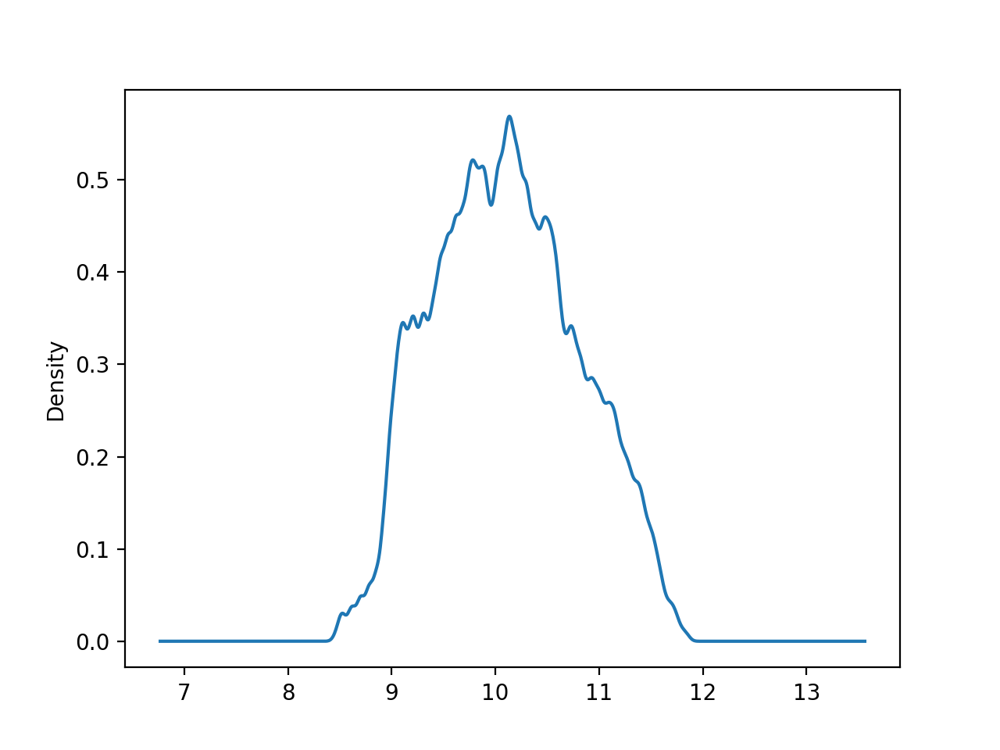

In [259]:
pd.Series(y_train).plot(kind = 'density', bw_method = 0.05)

# alternatively
# sns.set_style('whitegrid')
# sns.kdeplot(np.array(y_train), bw_method = 0.05)

<Axes: ylabel='Density'>

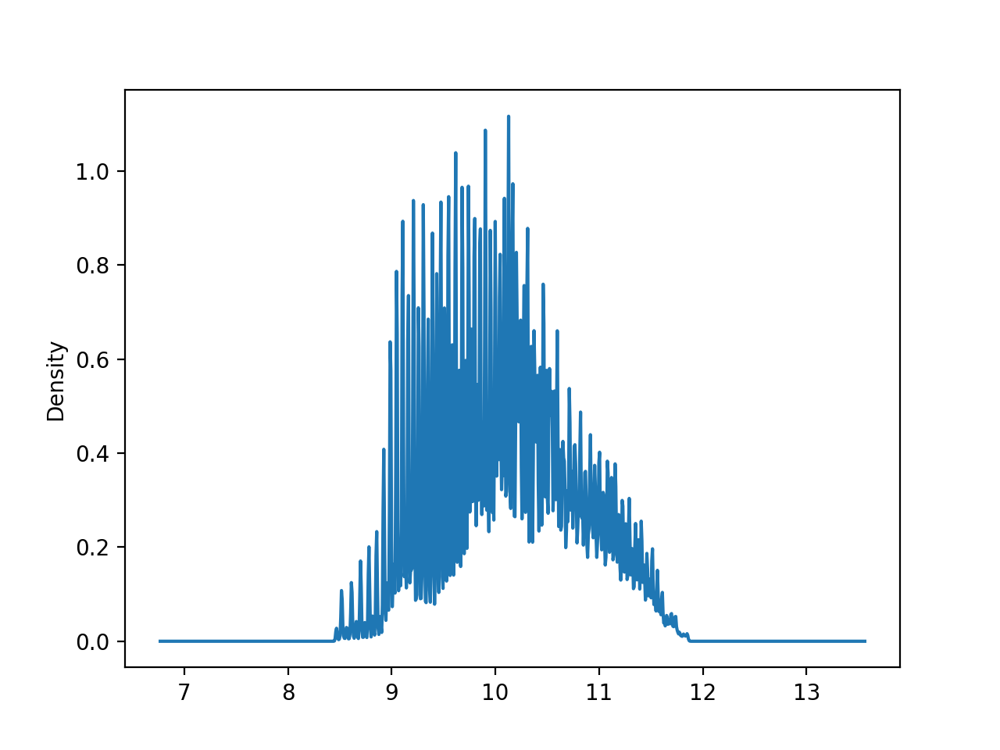

In [260]:
pd.Series(y_train).plot(kind = 'density', bw_method = 0.01)

In [261]:
y[:10]

array([11.09741002, 10.95080655,  9.21034037, 10.55841352,  9.30565055,
       10.18490001,  9.95227772, 10.20359214,  9.97580821, 11.08214255])

In [262]:
# intervals are taken along the median (10.165):
# ]8.463, 10.165]
# ]10.165, 11.864]
intervals_2 = pd.cut(y, bins = 2)

In [263]:
intervals_2[:10].tolist()

[Interval(10.165, 11.864, closed='right'),
 Interval(10.165, 11.864, closed='right'),
 Interval(8.463, 10.165, closed='right'),
 Interval(10.165, 11.864, closed='right'),
 Interval(8.463, 10.165, closed='right'),
 Interval(10.165, 11.864, closed='right'),
 Interval(8.463, 10.165, closed='right'),
 Interval(10.165, 11.864, closed='right'),
 Interval(8.463, 10.165, closed='right'),
 Interval(10.165, 11.864, closed='right')]

In [264]:
type(intervals_2[0])

pandas._libs.interval.Interval

In [265]:
label_encoder = LabelEncoder()

y_cat_2 = label_encoder.fit_transform(intervals_2)

In [266]:
y_cat_2[:10]

array([1, 1, 0, 1, 0, 1, 0, 1, 0, 1])

In [267]:
label_encoder.classes_.tolist()

[Interval(8.463, 10.165, closed='right'),
 Interval(10.165, 11.864, closed='right')]

In [269]:
y_cat_2_train, y_cat_2_valid = split_vals(y_cat_2, n_train)
y_cat_2_small, _ = split_vals(y_cat_2, n_small)

y_cat_2_train.shape, y_cat_2_valid.shape, y_cat_2_small.shape

((389125,), (12000,), (20000,))

<a id='decision_tree_classifier'></a>

### $\bullet$ Decision Tree Classifier

[Back to top](#plan)

In [270]:
tree_classifier = DecisionTreeClassifier(
    class_weight = None, # specific to classifiers
    criterion = 'gini',  # specific to classifiers
    splitter = 'best',
    max_depth = 3,
    min_samples_split = 2,
    min_samples_leaf = 1,
    min_weight_fraction_leaf = 0.0,
    max_features = None,
    max_leaf_nodes = None,
    min_impurity_decrease = 0.0,
    ccp_alpha = 0.0,
    random_state = None,
)

In [271]:
%time tree_classifier.fit(X_small, y_cat_2_small)

print(tree_classifier.score(X_small, y_cat_2_small))
print(tree_classifier.score(X_valid, y_cat_2_valid))

CPU times: total: 46.9 ms
Wall time: 66.9 ms
0.75195
0.7346666666666667


In [272]:
fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (15, 10), dpi = 300)
plot_tree(tree_classifier, filled = True)

[Text(0.625, 0.875, 'x[37] <= 0.5\ngini = 0.499\nsamples = 20000\nvalue = [9640, 10360]'),
 Text(0.5, 0.625, 'x[19] <= 2.0\ngini = 0.473\nsamples = 16815\nvalue = [6455, 10360]'),
 Text(0.25, 0.375, 'x[2] <= 4573.0\ngini = 0.465\nsamples = 4400\nvalue = [2785, 1615]'),
 Text(0.125, 0.125, 'gini = 0.487\nsamples = 2002\nvalue = [839, 1163]'),
 Text(0.375, 0.125, 'gini = 0.306\nsamples = 2398\nvalue = [1946, 452]'),
 Text(0.75, 0.375, 'x[19] <= 4.5\ngini = 0.416\nsamples = 12415\nvalue = [3670, 8745]'),
 Text(0.625, 0.125, 'gini = 0.252\nsamples = 7193\nvalue = [1065, 6128]'),
 Text(0.875, 0.125, 'gini = 0.5\nsamples = 5222\nvalue = [2605, 2617]'),
 Text(0.75, 0.625, 'gini = 0.0\nsamples = 3185\nvalue = [3185, 0]')]

In [273]:
# draw_tree(tree_classifier, X_small, precision = 3)

In [274]:
tree_classifier.predict_proba(X_valid[:1])[0]

array([0.41908092, 0.58091908])

In [275]:
tree_classifier.predict(X_valid[:1])[0]

1

In [276]:
839/(839 + 1163), 1163/(839 + 1163)

(0.4190809190809191, 0.580919080919081)

<a id='random_forest_classifier'></a>

### $\bullet$ Random Forest Classifier

[Back to top](#plan)

In [277]:
classifier = RandomForestClassifier(
    n_estimators = 20,
    class_weight = None, # classifier specific
    criterion = 'gini',  # classifier specific
    max_depth = 3,
    min_samples_split = 2,
    min_samples_leaf = 1,
    min_weight_fraction_leaf = 0.0,
    max_features = 'sqrt',
    max_leaf_nodes = None,
    min_impurity_decrease = 0.0,
    ccp_alpha = 0.0,
    random_state = 42,
    bootstrap = True,
    oob_score = True,
    max_samples = None,
    warm_start = False,
    n_jobs = -1,
    verbose = 0,
)

In [278]:
%time classifier.fit(X_small, y_cat_2_small)

print(classifier.score(X_small, y_cat_2_small)) # classification accuracy on training set
print(classifier.score(X_valid, y_cat_2_valid)) # classification accuracy on validation set
print(classifier.oob_score_)                    # classification accuracy on oob samples

CPU times: total: 46.9 ms
Wall time: 92.5 ms
0.81155
0.8093333333333333
0.79105


In [279]:
classifier.predict_proba(X_valid[:1])[0]

array([0.50318863, 0.49681137])

In [280]:
classifier.predict(X_valid[:1])[0]

0

In [281]:
# The predicted label is 1 precisely when its estimated probability is > 0.5
probas_1 = classifier.predict_proba(X_valid)[:, 1]
prob_labels = [int(p > 0.5) for p in probas_1]

pred_labels = classifier.predict(X_valid)

sum(prob_labels == pred_labels)/len(pred_labels)

1.0

In [282]:
# all tree predictions on single data point
trees = classifier.estimators_
point = X_valid[:1]
preds = np.asarray([tree.predict_proba(point)[0] for tree in trees])

avg = preds.sum(0)
avg = avg/sum(avg)

print('Tree probabilities:\n', preds)
print('\nAverage probability:\n', avg)

Tree probabilities:
 [[0.46867925 0.53132075]
 [0.27021597 0.72978403]
 [0.66732722 0.33267278]
 [0.53928571 0.46071429]
 [0.24373106 0.75626894]
 [0.42138978 0.57861022]
 [0.68947182 0.31052818]
 [0.66478555 0.33521445]
 [0.38405207 0.61594793]
 [0.38308728 0.61691272]
 [0.39336578 0.60663422]
 [0.52643092 0.47356908]
 [0.65783439 0.34216561]
 [0.65597668 0.34402332]
 [0.46039783 0.53960217]
 [0.6537859  0.3462141 ]
 [0.24499784 0.75500216]
 [0.75409111 0.24590889]
 [0.58167053 0.41832947]
 [0.40319584 0.59680416]]

Average probability:
 [0.50318863 0.49681137]


<a id='binary_classifier_scoring'></a>

### $\bullet$ Evaluation criteria of binary classifiers

[Back to top](#plan)

In [283]:
classifier = RandomForestClassifier(
    n_estimators = 20,
    class_weight = None, # classifier specific
    criterion = 'gini',  # classifier specific
    max_depth = 3,
    min_samples_split = 2,
    min_samples_leaf = 1,
    min_weight_fraction_leaf = 0.0,
    max_features = 'sqrt',
    max_leaf_nodes = None,
    min_impurity_decrease = 0.0,
    ccp_alpha = 0.0,
    random_state = 42,
    bootstrap = True,
    oob_score = True,
    max_samples = None,
    warm_start = False,
    n_jobs = -1,
    verbose = 0,
)

In [284]:
%time classifier.fit(X_small, y_cat_2_small)

print(classifier.score(X_small, y_cat_2_small)) # classification accuracy on training set
print(classifier.score(X_valid, y_cat_2_valid)) # classification accuracy on validation set
print(classifier.oob_score_)                    # classification accuracy on oob samples

CPU times: total: 31.2 ms
Wall time: 103 ms
0.81155
0.8093333333333333
0.79105


In [285]:
def specificity_score(y_true, y_predict):
    '''
    Computes the proba that a label is 0 knowing that the prediction is 0
    '''
    y_predict_0  = [(pred, true) for pred, true in zip(y_predict, y_true) if true == 0]
    y_predict_00 = [(pred, true) for pred, true in y_predict_0 if pred == 0]
    specificity  = (0 if len(y_predict_0) == 0 else len(y_predict_00)/len(y_predict_0))
    return specificity

In [286]:
y_predict_valid = classifier.predict(X_valid)

acc = metrics.accuracy_score(y_cat_2_valid, y_predict_valid)
rec = metrics.recall_score(y_cat_2_valid, y_predict_valid)
prc = metrics.precision_score(y_cat_2_valid, y_predict_valid)
spe = specificity_score(y_cat_2_valid, y_predict_valid)
f1  = metrics.f1_score(y_cat_2_valid, y_predict_valid)

print('Accuracy : {:.2f}%'.format(acc*100))
print('Recall : {:.2f}%'.format(rec*100))
print('Precision : {:.2f}%'.format(prc*100))
print('Specificity : {:.2f}%'.format(spe*100))
print('F1-score : {:.2f}%'.format(f1*100))

Accuracy : 80.93%
Recall : 82.06%
Precision : 74.79%
Specificity : 80.12%
F1-score : 78.26%


<a id='rec_prc_curve'></a>

### $\bullet$ Dealing with imbalanced data 1 : Precision - Recall curve and threshold selection

[Back to top](#plan)

In [287]:
def precision_recall_curve_with_threshold(targets, probas, threshold = 0.5):

    def sort_pair(X, Y):
        rangee = [(x, y) for x, y in sorted(zip(X, Y), key = lambda pair: pair[0])]
        return [pair[0] for pair in rangee], [pair[1] for pair in rangee]

    # --- main
    targets, probas = sort_pair(targets, probas)
    precision, recall, thresholds = metrics.precision_recall_curve(targets, probas)

    # calculate precision-recall AUC
    auc_val = metrics.auc(recall, precision)
    print('Area Under Curve (AUC) : {:.3f}'.format(auc_val))
    # plot no skill
    if threshold is not None :
        index = len([y for y in thresholds if y <= threshold]) # thresholds are sorted

        print('Recall with threshold = {}: {:.2f}%'.format(threshold, recall[index]*100))
        print('Precision with threshold = {} : {:.2f}%'.format(threshold, precision[index]*100))

        plt.plot([0, 1], [precision[index], precision[index]], linestyle='--', color = 'grey')
        plt.plot([recall[index], recall[index]], [0, 1], linestyle='--', color = 'grey')

        # plot the precision-recall curve for the model
        plt.plot(recall[:index], precision[:index], color = 'navy', marker='.')
        plt.plot(recall[index:], precision[index:], color = 'orange', marker='.')

        # show the plot
        plt.title('Precision-Recall curve with threshold = {}'.format(threshold))
        plt.xlabel('Recall $P(\, \widehat{1}\, | 1)$')
        plt.ylabel('Precision $P(\, 1\, | \widehat{1})$                                ', rotation = 'horizontal')
    else :
        # plot the precision-recall curve for the model
        plt.plot(recall, precision, color = 'orange', marker='.')

        # show the plot
        plt.title('Precision-Recall curve')
        plt.xlabel('Recall $P(\, \widehat{1}\, | 1)$')
        plt.ylabel('Precision $P(\, 1\, | \widehat{1})$                                ', rotation = 'horizontal')

    plt.show()
    return

In [288]:
# The predicted label is 1 precisely when its estimated probability is >= 0.5
threshold = 0.5

probas_1 = classifier.predict_proba(X_valid)[:, 1]
prob_labels = [int(p > threshold) for p in probas_1]

pred_labels = classifier.predict(X_valid)

sum(prob_labels == pred_labels)/len(pred_labels)

1.0

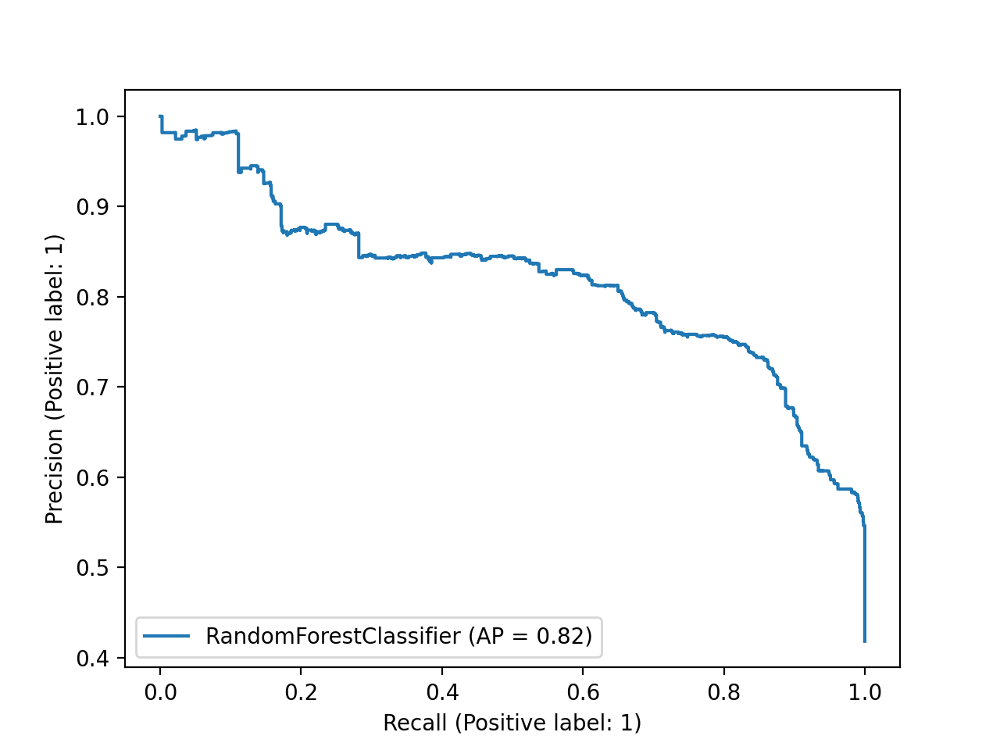

In [289]:
# beware that y axis is along [0.5, 1]
rec_prc_curve = metrics.PrecisionRecallDisplay.from_estimator(classifier, X_valid, y_cat_2_valid)
rec_prc_curve

In [290]:
y_predict_valid = classifier.predict(X_valid)

acc = metrics.accuracy_score(y_cat_2_valid, y_predict_valid)
rec = metrics.recall_score(y_cat_2_valid, y_predict_valid)
prc = metrics.precision_score(y_cat_2_valid, y_predict_valid)
spe = specificity_score(y_cat_2_valid, y_predict_valid)
f1  = metrics.f1_score(y_cat_2_valid, y_predict_valid)

print('Accuracy : {:.2f}%'.format(acc*100))
print('Recall : {:.2f}%'.format(rec*100))
print('Precision : {:.2f}%'.format(prc*100))
print('Specificity : {:.2f}%'.format(spe*100))
print('F1-score : {:.2f}%'.format(f1*100))

Accuracy : 80.93%
Recall : 82.06%
Precision : 74.79%
Specificity : 80.12%
F1-score : 78.26%


In [291]:
probs = classifier.predict_proba(X_valid)[:, 1]
preds = [int(prob > 0.55) for prob in probs]
y_predict_valid = preds

acc = metrics.accuracy_score(y_cat_2_valid, y_predict_valid)
rec = metrics.recall_score(y_cat_2_valid, y_predict_valid)
prc = metrics.precision_score(y_cat_2_valid, y_predict_valid)
spe = specificity_score(y_cat_2_valid, y_predict_valid)
f1  = metrics.f1_score(y_cat_2_valid, y_predict_valid)

print('Accuracy : {:.2f}%'.format(acc*100))
print('Recall : {:.2f}%'.format(rec*100))
print('Precision : {:.2f}%'.format(prc*100))
print('Specificity : {:.2f}%'.format(spe*100))
print('F1-score : {:.2f}%'.format(f1*100))

Accuracy : 78.87%
Recall : 68.29%
Precision : 78.39%
Specificity : 86.47%
F1-score : 72.99%


In this situation a threshold of 0.55 seems to yield a more balanced classifier :

Area Under Curve (AUC) : 0.819
Recall with threshold = 0.5: 82.06%
Precision with threshold = 0.5 : 74.79%


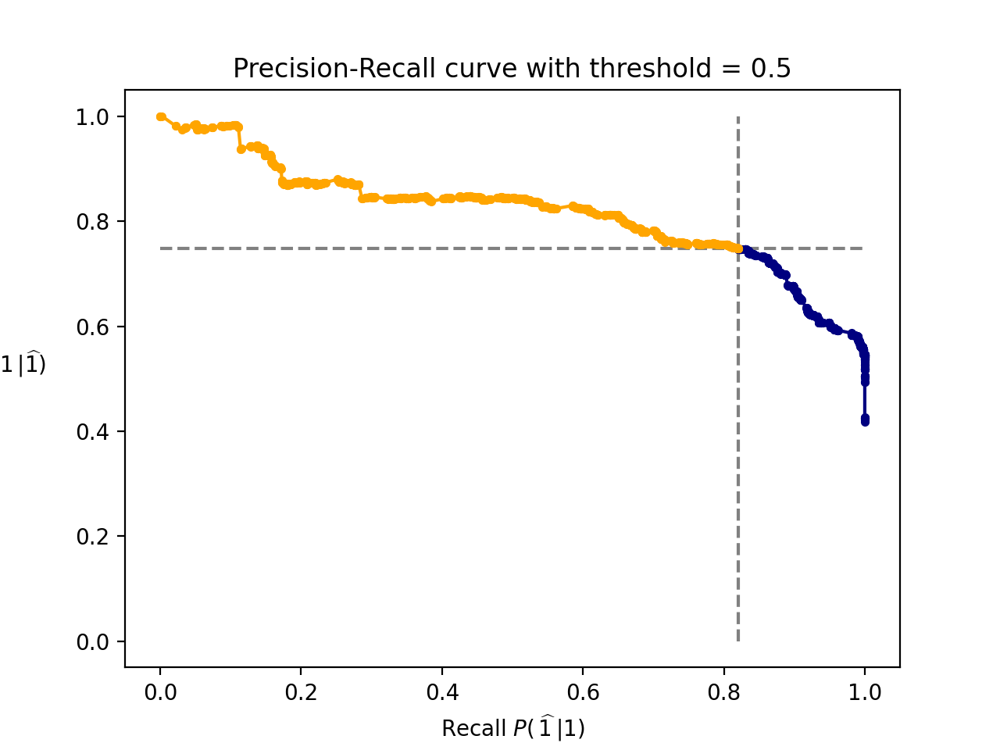

In [292]:
probas = classifier.predict_proba(X_valid)[:, 1]

precision_recall_curve_with_threshold(y_cat_2_valid, probas, threshold = 0.5)

Area Under Curve (AUC) : 0.819
Recall with threshold = 0.55: 68.29%
Precision with threshold = 0.55 : 78.39%


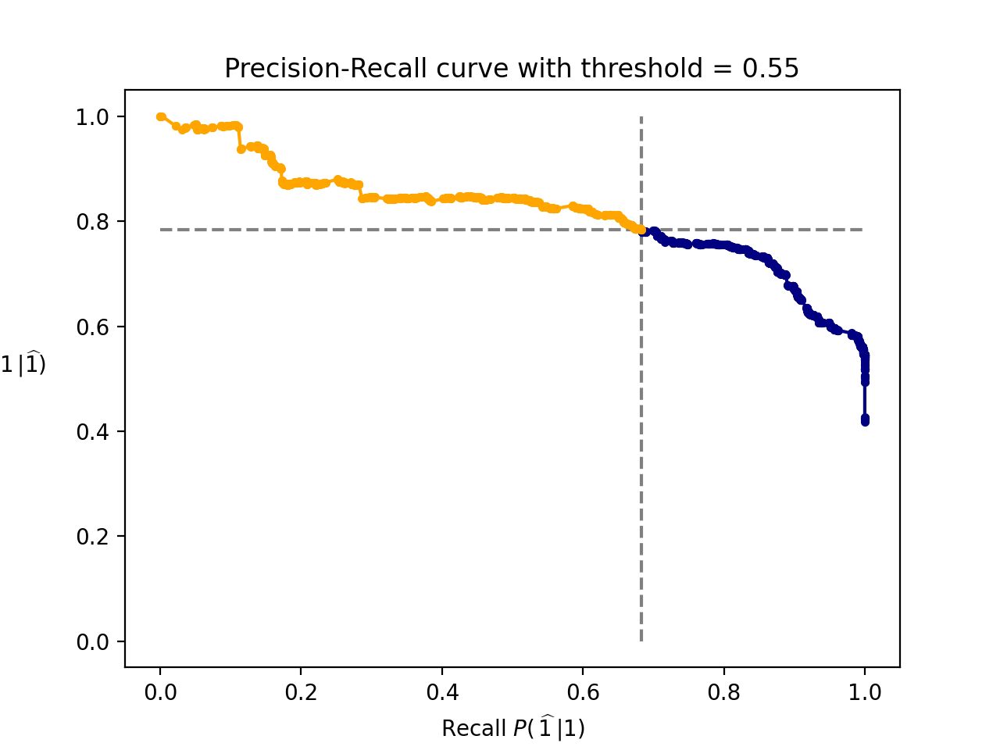

In [293]:
probas = classifier.predict_proba(X_valid)[:, 1]

precision_recall_curve_with_threshold(y_cat_2_valid, probas, threshold = 0.55)

In [294]:
classifier.predict(X_valid[:1])[0]

0

In [295]:
proba = classifier.predict_proba(X_valid[:1])[:, 1]
pred = int(proba > 0.4)
pred

1

<a id='class_weight'></a>

### $\bullet$ Dealing with imbalanced data 2 : Class weights

[Back to top](#plan)


In [296]:
classifier = RandomForestClassifier(
    n_estimators = 20,
    class_weight = 'balanced', # classifier specific
    criterion = 'gini',  # classifier specific
    max_depth = 3,
    min_samples_split = 2,
    min_samples_leaf = 1,
    min_weight_fraction_leaf = 0.0,
    max_features = 'sqrt',
    max_leaf_nodes = None,
    min_impurity_decrease = 0.0,
    ccp_alpha = 0.0,
    random_state = 42,
    bootstrap = True,
    oob_score = True,
    max_samples = None,
    warm_start = False,
    n_jobs = -1,
    verbose = 0,
)

In [297]:
%time classifier.fit(X_small, y_cat_2_small)

print(classifier.score(X_small, y_cat_2_small)) # classification accuracy on training set
print(classifier.score(X_valid, y_cat_2_valid)) # classification accuracy on validation set
print(classifier.oob_score_)                    # classification accuracy on oob samples

CPU times: total: 62.5 ms
Wall time: 104 ms
0.82155
0.8095833333333333
0.79605


In [298]:
y_predict_valid = classifier.predict(X_valid)

acc = metrics.accuracy_score(y_cat_2_valid, y_predict_valid)
rec = metrics.recall_score(y_cat_2_valid, y_predict_valid)
prc = metrics.precision_score(y_cat_2_valid, y_predict_valid)
spe = specificity_score(y_cat_2_valid, y_predict_valid)
f1  = metrics.f1_score(y_cat_2_valid, y_predict_valid)

print('Accuracy : {:.2f}%'.format(acc*100))
print('Recall : {:.2f}%'.format(rec*100))
print('Precision : {:.2f}%'.format(prc*100))
print('Specificity : {:.2f}%'.format(spe*100))
print('F1-score : {:.2f}%'.format(f1*100))

Accuracy : 80.96%
Recall : 80.17%
Precision : 75.72%
Specificity : 81.52%
F1-score : 77.88%


Area Under Curve (AUC) : 0.829
Recall with threshold = 0.5: 80.17%
Precision with threshold = 0.5 : 75.72%


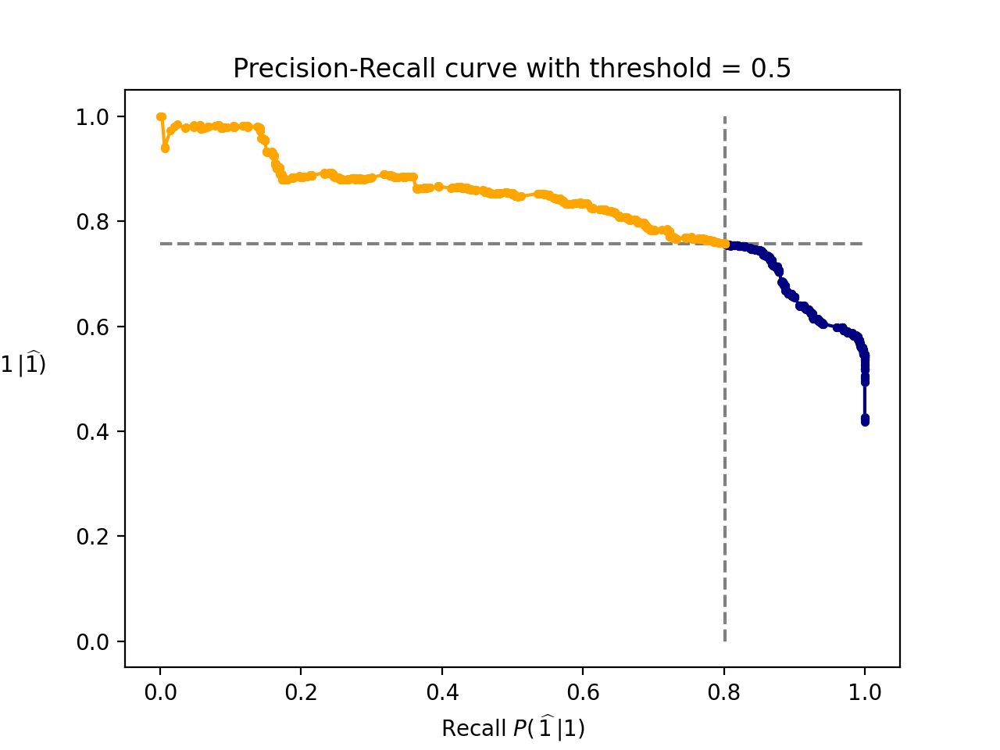

In [299]:
probas = classifier.predict_proba(X_valid)[:, 1]

precision_recall_curve_with_threshold(y_cat_2_valid, probas, threshold = 0.5)

Area Under Curve (AUC) : 0.829
Recall with threshold = 0.55: 67.24%
Precision with threshold = 0.55 : 80.28%


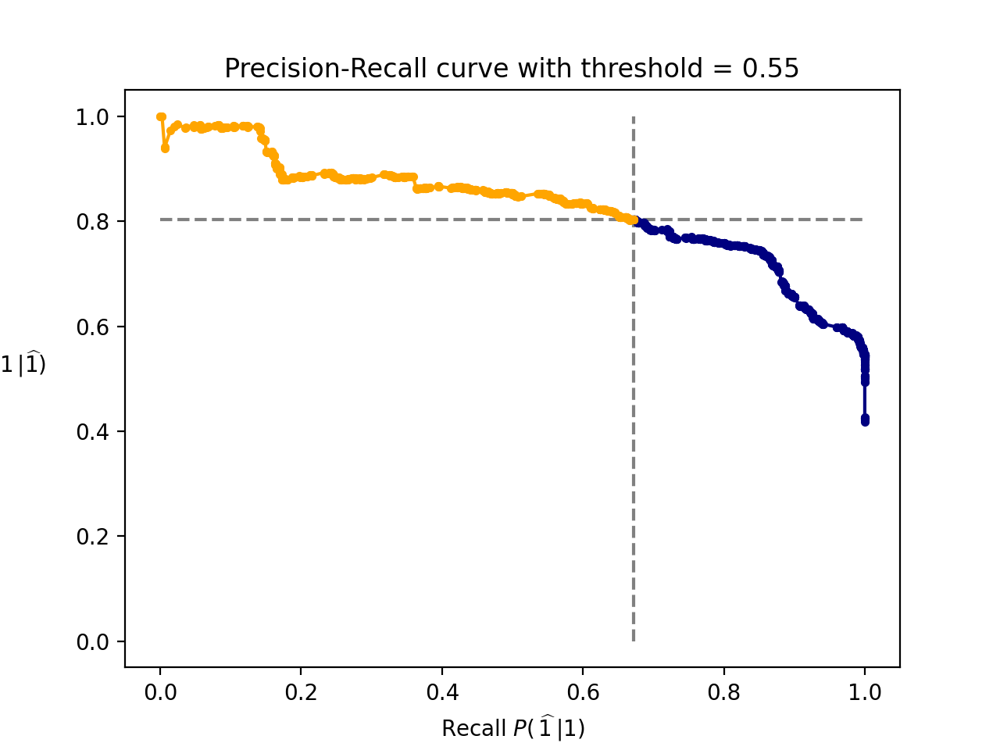

In [300]:
probas = classifier.predict_proba(X_valid)[:, 1]

precision_recall_curve_with_threshold(y_cat_2_valid, probas, threshold = 0.55)

<a id='model_calibration'></a>

### $\bullet$ Model calibration

[Back to top](#plan)


Manually selecting the threshold in order to balance precision and recall can be dangerous for _uncalibrated_ classifiers, that is, classifiers where determinisitc predictions change a lot for a small change of threshold :

In [301]:
classifier = RandomForestClassifier(
    n_estimators = 20,
    class_weight = 'balanced', # classifier specific
    criterion = 'gini',  # classifier specific
    max_depth = 3,
    min_samples_split = 2,
    min_samples_leaf = 1,
    min_weight_fraction_leaf = 0.0,
    max_features = 'sqrt',
    max_leaf_nodes = None,
    min_impurity_decrease = 0.0,
    ccp_alpha = 0.0,
    random_state = 42,
    bootstrap = True,
    oob_score = True,
    max_samples = None,
    warm_start = False,
    n_jobs = -1,
    verbose = 0,
)

In [302]:
%time classifier.fit(X_small, y_cat_2_small)

print(classifier.score(X_small, y_cat_2_small)) # classification accuracy on smalling set
print(classifier.score(X_valid, y_cat_2_valid)) # classification accuracy on validation set
print(classifier.oob_score_)                    # classification accuracy on oob samples

CPU times: total: 46.9 ms
Wall time: 98.7 ms
0.82155
0.8095833333333333
0.79605


Area Under Curve (AUC) : 0.829
Recall with threshold = 0.4: 98.31%
Precision with threshold = 0.4 : 58.47%


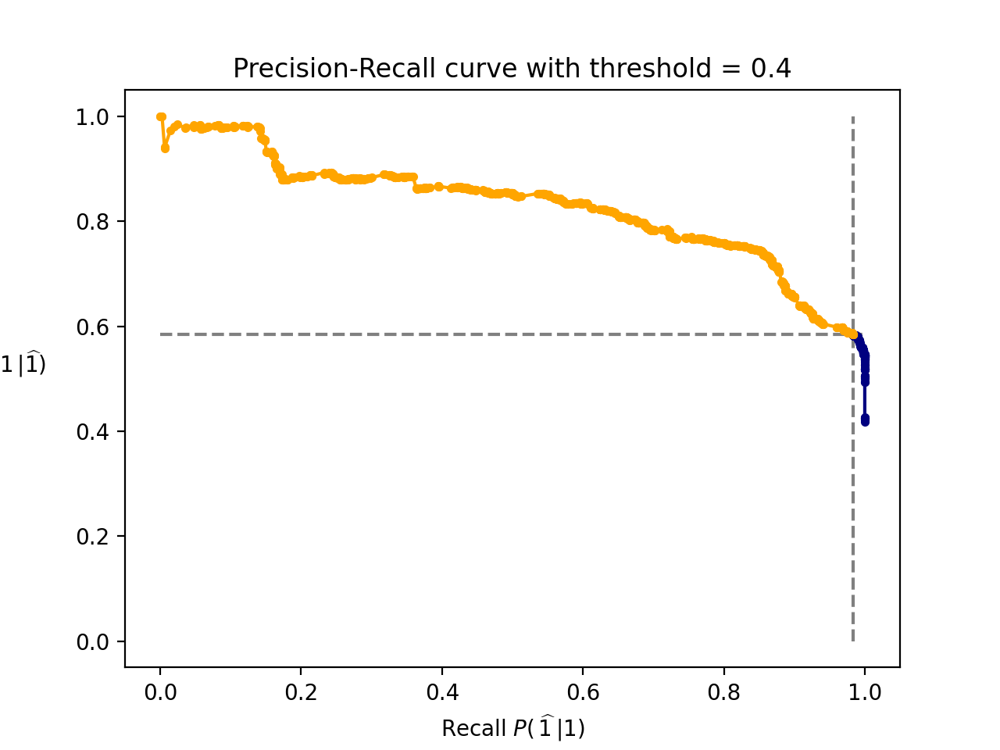

In [303]:
probas = classifier.predict_proba(X_valid)[:, 1]

precision_recall_curve_with_threshold(y_cat_2_valid, probas, threshold = 0.4)

Area Under Curve (AUC) : 0.829
Recall with threshold = 0.6: 49.28%
Precision with threshold = 0.6 : 85.36%


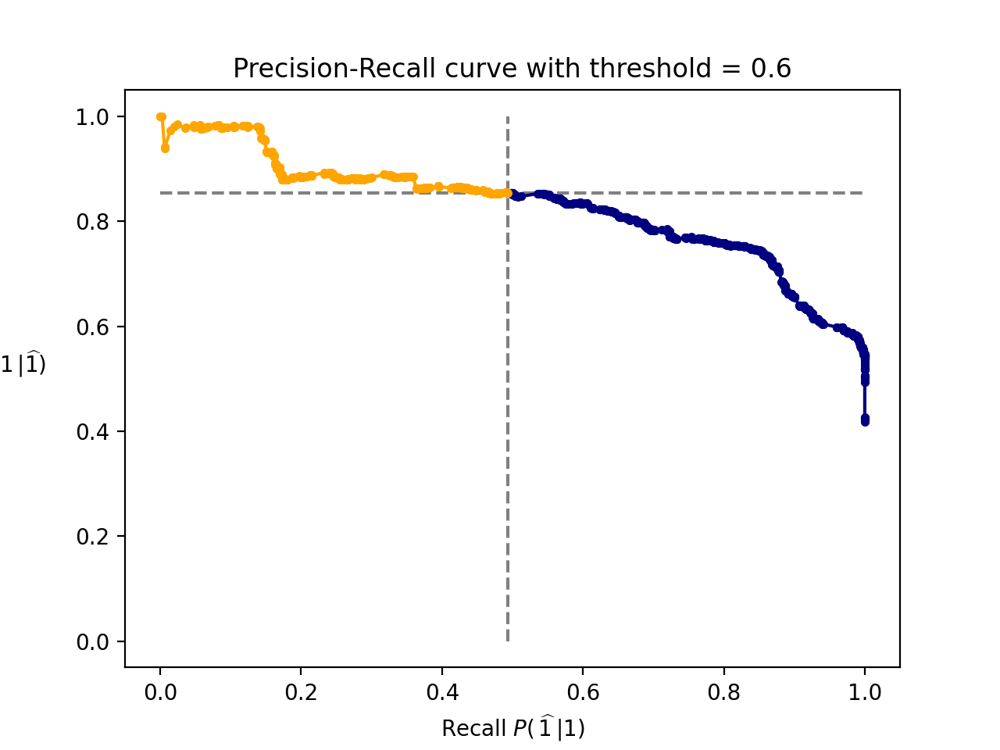

In [304]:
probas = classifier.predict_proba(X_valid)[:, 1]

precision_recall_curve_with_threshold(y_cat_2_valid, probas, threshold = 0.6)

In [305]:
calibrated_classifier = CalibratedClassifierCV(
    base_estimator = classifier,
    method = 'sigmoid', # 'sigmoid' or 'isotonic'
    ensemble = True,
    cv = 8, # int of 'prefit'
    n_jobs = -1,
)

In [306]:
%time calibrated_classifier.fit(X_small, y_cat_2_small)

print(calibrated_classifier.score(X_small, y_cat_2_small)) # classification accuracy on smalling set
print(calibrated_classifier.score(X_valid, y_cat_2_valid)) # classification accuracy on validation set

CPU times: total: 78.1 ms
Wall time: 2.3 s
0.81225
0.8061666666666667


In [307]:
y_predict_valid = calibrated_classifier.predict(X_valid)

acc = metrics.accuracy_score(y_cat_2_valid, y_predict_valid)
rec = metrics.recall_score(y_cat_2_valid, y_predict_valid)
prc = metrics.precision_score(y_cat_2_valid, y_predict_valid)
spe = specificity_score(y_cat_2_valid, y_predict_valid)
f1  = metrics.f1_score(y_cat_2_valid, y_predict_valid)

print('Accuracy : {:.2f}%'.format(acc*100))
print('Recall : {:.2f}%'.format(rec*100))
print('Precision : {:.2f}%'.format(prc*100))
print('Specificity : {:.2f}%'.format(spe*100))
print('F1-score : {:.2f}%'.format(f1*100))

Accuracy : 80.62%
Recall : 72.92%
Precision : 79.10%
Specificity : 86.15%
F1-score : 75.88%


Area Under Curve (AUC) : 0.844
Recall with threshold = 0.4: 81.61%
Precision with threshold = 0.4 : 75.99%


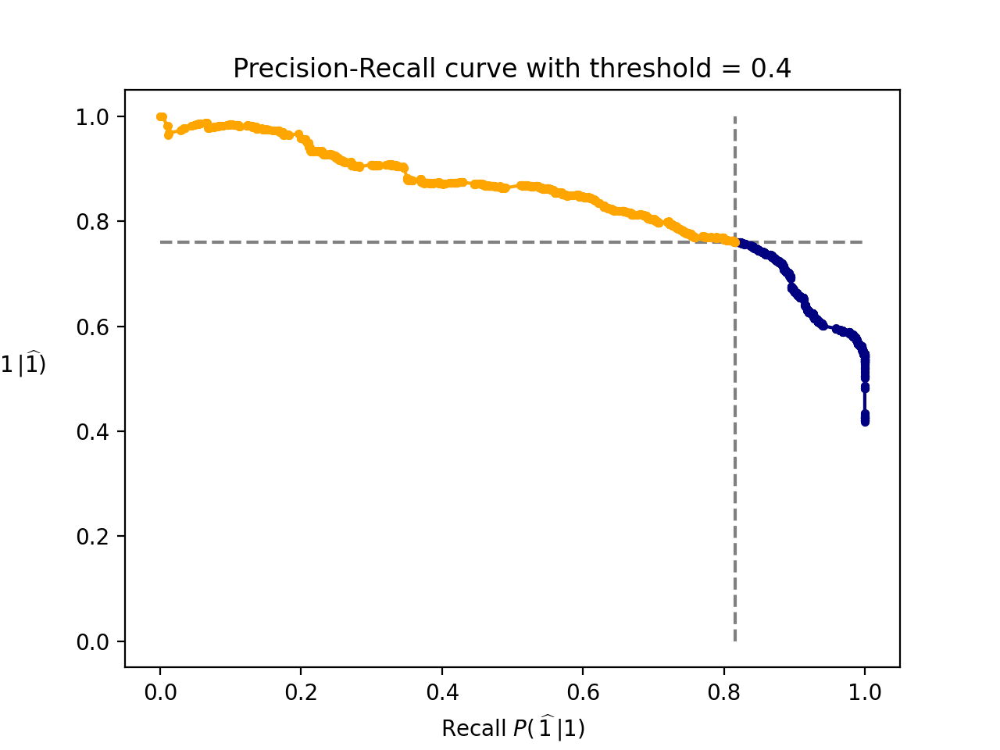

In [308]:
probas = calibrated_classifier.predict_proba(X_valid)[:, 1]

precision_recall_curve_with_threshold(y_cat_2_valid, probas, threshold = 0.4)

Area Under Curve (AUC) : 0.844
Recall with threshold = 0.6: 65.78%
Precision with threshold = 0.6 : 81.91%


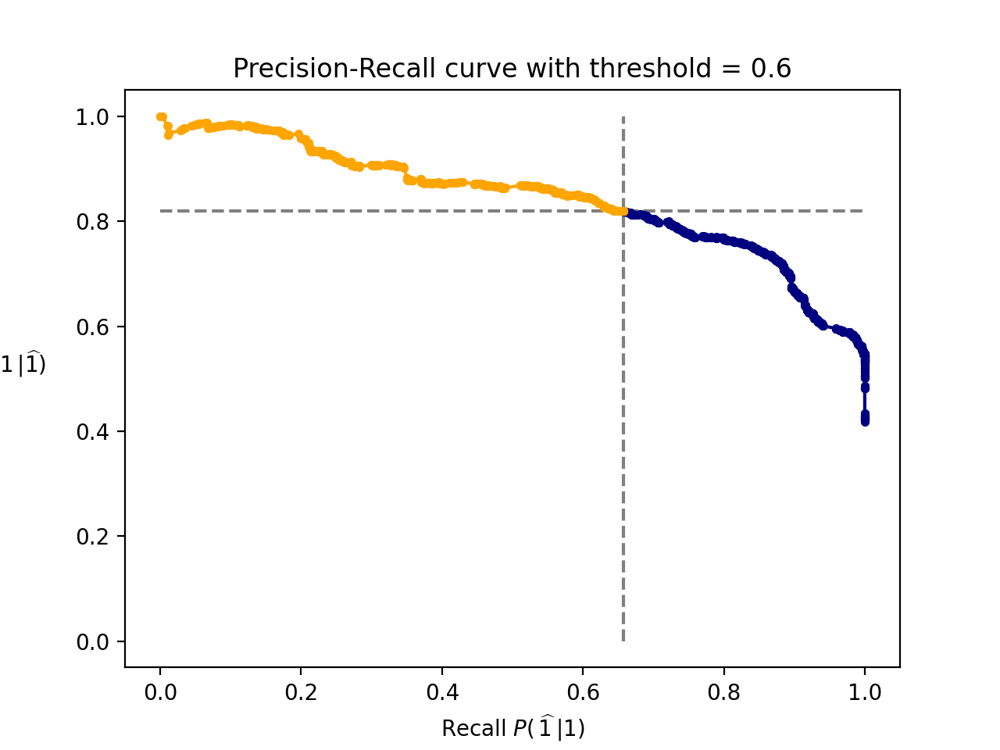

In [309]:
probas = calibrated_classifier.predict_proba(X_valid)[:, 1]

precision_recall_curve_with_threshold(y_cat_2_valid, probas, threshold = 0.6)

<a id='multiclass_classification'></a>

### $\bullet$ Multiclass classification

[Back to top](#plan)


Let us replicate the process followed for binary classification to the case of 5-fold classification

#### Data categorization

Area Under Curve (AUC) : 0.844
Recall with threshold = 0.5: 72.92%
Precision with threshold = 0.5 : 79.10%


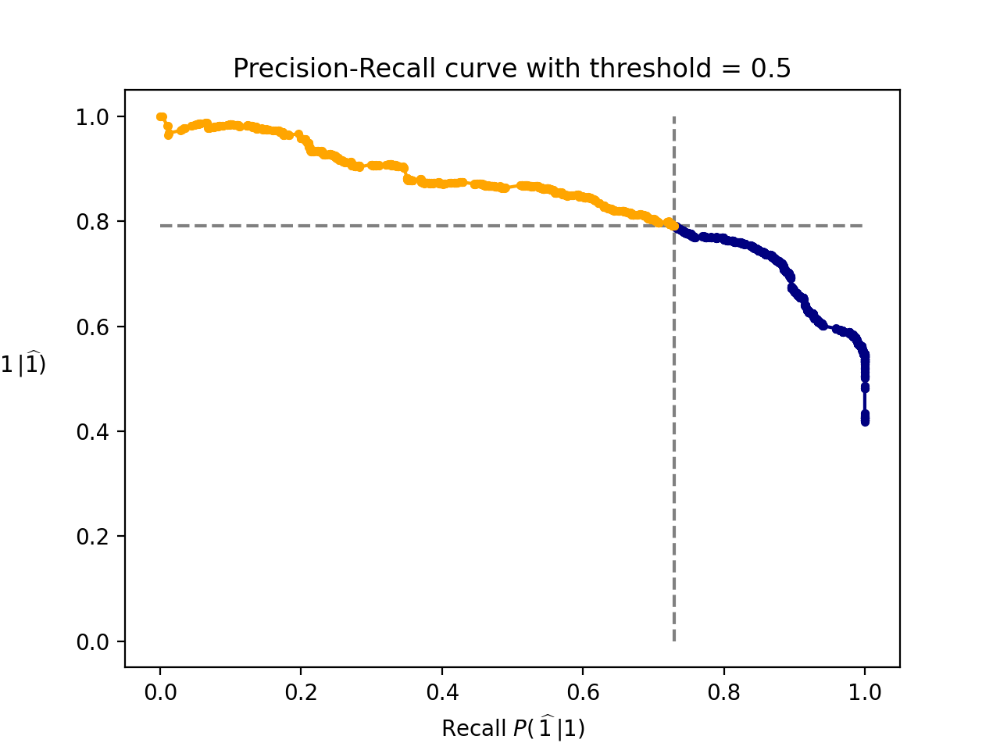

In [310]:
probas = calibrated_classifier.predict_proba(X_valid)[:, 1]

precision_recall_curve_with_threshold(y_cat_2_valid, probas, threshold = 0.5)

In [311]:
intervals_5 = pd.cut(y, bins = 5)
intervals_5[:10].tolist()

[Interval(10.505, 11.184, closed='right'),
 Interval(10.505, 11.184, closed='right'),
 Interval(9.145, 9.825, closed='right'),
 Interval(10.505, 11.184, closed='right'),
 Interval(9.145, 9.825, closed='right'),
 Interval(9.825, 10.505, closed='right'),
 Interval(9.825, 10.505, closed='right'),
 Interval(9.825, 10.505, closed='right'),
 Interval(9.825, 10.505, closed='right'),
 Interval(10.505, 11.184, closed='right')]

In [312]:
label_encoder = LabelEncoder()

y_cat_5 = label_encoder.fit_transform(intervals_5)
y_cat_5[:10]

array([3, 3, 1, 3, 1, 2, 2, 2, 2, 3])

In [313]:
label_encoder.classes_.tolist()

[Interval(8.463, 9.145, closed='right'),
 Interval(9.145, 9.825, closed='right'),
 Interval(9.825, 10.505, closed='right'),
 Interval(10.505, 11.184, closed='right'),
 Interval(11.184, 11.864, closed='right')]

In [314]:
y_cat_5_train, y_cat_5_valid = split_vals(y_cat_5, n_train)
y_cat_5_small, _ = split_vals(y_cat_5, n_small)

y_cat_5_train.shape, y_cat_5_valid.shape, y_cat_5_small.shape

((389125,), (12000,), (20000,))

#### Model training

In [315]:
classifier = RandomForestClassifier(
    n_estimators = 20,
    class_weight = 'balanced', # classifier specific
    criterion = 'gini',  # classifier specific
    max_depth = 3,
    min_samples_split = 2,
    min_samples_leaf = 1,
    min_weight_fraction_leaf = 0.0,
    max_features = 'sqrt',
    max_leaf_nodes = None,
    min_impurity_decrease = 0.0,
    ccp_alpha = 0.0,
    random_state = 42,
    bootstrap = True,
    oob_score = True,
    max_samples = None,
    warm_start = False,
    n_jobs = -1,
    verbose = 0,
)


calibrated_classifier = CalibratedClassifierCV(
    base_estimator = classifier,
    method = 'sigmoid', # 'sigmoid' or 'isotonic'
    ensemble = True,
    cv = 5, # int of 'prefit'
    n_jobs = -1,
)

In [316]:
%time classifier.fit(X_small, y_cat_5_small)

print(classifier.score(X_small, y_cat_5_small)) # classification accuracy on training set
print(classifier.score(X_valid, y_cat_5_valid)) # classification accuracy on validation set

CPU times: total: 46.9 ms
Wall time: 107 ms
0.41805
0.44308333333333333


In [317]:
%time calibrated_classifier.fit(X_small, y_cat_5_small)

print(calibrated_classifier.score(X_small, y_cat_5_small)) # classification accuracy on training set
print(calibrated_classifier.score(X_valid, y_cat_5_valid)) # classification accuracy on validation set

CPU times: total: 0 ns
Wall time: 1.06 s
0.5544
0.5485833333333333


Macro-averages :

In [318]:
y_predict_valid = classifier.predict(X_valid)

average = 'macro'

acc = metrics.accuracy_score(y_cat_5_valid, y_predict_valid)
rec = metrics.recall_score(y_cat_5_valid, y_predict_valid, average = average)
prc = metrics.precision_score(y_cat_5_valid, y_predict_valid, average = average)
f1  = metrics.f1_score(y_cat_5_valid, y_predict_valid, average = average)

print('Accuracy : {:.2f}%'.format(acc*100))
print('Recall : {:.2f}%'.format(rec*100))
print('Precision : {:.2f}%'.format(prc*100))
print('F1-score : {:.2f}%'.format(f1*100))

Accuracy : 44.31%
Recall : 52.56%
Precision : 47.30%
F1-score : 45.31%


In [319]:
y_predict_valid = calibrated_classifier.predict(X_valid)

average = 'macro'

acc = metrics.accuracy_score(y_cat_5_valid, y_predict_valid)
rec = metrics.recall_score(y_cat_5_valid, y_predict_valid, average = average)
prc = metrics.precision_score(y_cat_5_valid, y_predict_valid, average = average)
f1  = metrics.f1_score(y_cat_5_valid, y_predict_valid, average = average)

print('Accuracy : {:.2f}%'.format(acc*100))
print('Recall : {:.2f}%'.format(rec*100))
print('Precision : {:.2f}%'.format(prc*100))
print('F1-score : {:.2f}%'.format(f1*100))

Accuracy : 54.86%
Recall : 45.53%
Precision : 66.82%
F1-score : 46.11%


Weighted macro-averages :

In [320]:
y_predict_valid = classifier.predict(X_valid)

average = 'weighted'

acc = metrics.accuracy_score(y_cat_5_valid, y_predict_valid)
rec = metrics.recall_score(y_cat_5_valid, y_predict_valid, average = average)
prc = metrics.precision_score(y_cat_5_valid, y_predict_valid, average = average)
f1  = metrics.f1_score(y_cat_5_valid, y_predict_valid, average = average)

print('Accuracy : {:.2f}%'.format(acc*100))
print('Recall : {:.2f}%'.format(rec*100))
print('Precision : {:.2f}%'.format(prc*100))
print('F1-score : {:.2f}%'.format(f1*100))

Accuracy : 44.31%
Recall : 44.31%
Precision : 53.18%
F1-score : 44.18%


In [321]:
y_predict_valid = calibrated_classifier.predict(X_valid)

average = 'weighted'

acc = metrics.accuracy_score(y_cat_5_valid, y_predict_valid)
rec = metrics.recall_score(y_cat_5_valid, y_predict_valid, average = average)
prc = metrics.precision_score(y_cat_5_valid, y_predict_valid, average = average)
f1  = metrics.f1_score(y_cat_5_valid, y_predict_valid, average = average)

print('Accuracy : {:.2f}%'.format(acc*100))
print('Recall : {:.2f}%'.format(rec*100))
print('Precision : {:.2f}%'.format(prc*100))
print('F1-score : {:.2f}%'.format(f1*100))

Accuracy : 54.86%
Recall : 54.86%
Precision : 61.49%
F1-score : 52.88%


The different scores are better summarized in the following report :

In [322]:
y_predict_valid = classifier.predict(X_valid)

report = metrics.classification_report(
    y_cat_5_valid,
    y_predict_valid,
    target_names = [str(interval) for interval in label_encoder.classes_.tolist()],
)
print(report)

                  precision    recall  f1-score   support

  (8.463, 9.145]       0.44      0.66      0.53      1345
  (9.145, 9.825]       0.74      0.30      0.43      3962
 (9.825, 10.505]       0.54      0.41      0.46      3352
(10.505, 11.184]       0.30      0.44      0.36      2323
(11.184, 11.864]       0.34      0.81      0.48      1018

        accuracy                           0.44     12000
       macro avg       0.47      0.53      0.45     12000
    weighted avg       0.53      0.44      0.44     12000



In [323]:
y_predict_valid = calibrated_classifier.predict(X_valid)

report = metrics.classification_report(
    y_cat_5_valid,
    y_predict_valid,
    target_names = [str(interval) for interval in label_encoder.classes_.tolist()],
)
print(report)

                  precision    recall  f1-score   support

  (8.463, 9.145]       0.85      0.21      0.33      1345
  (9.145, 9.825]       0.67      0.61      0.64      3962
 (9.825, 10.505]       0.49      0.65      0.56      3352
(10.505, 11.184]       0.46      0.67      0.55      2323
(11.184, 11.864]       0.88      0.13      0.23      1018

        accuracy                           0.55     12000
       macro avg       0.67      0.46      0.46     12000
    weighted avg       0.61      0.55      0.53     12000



#### Confusion matrix

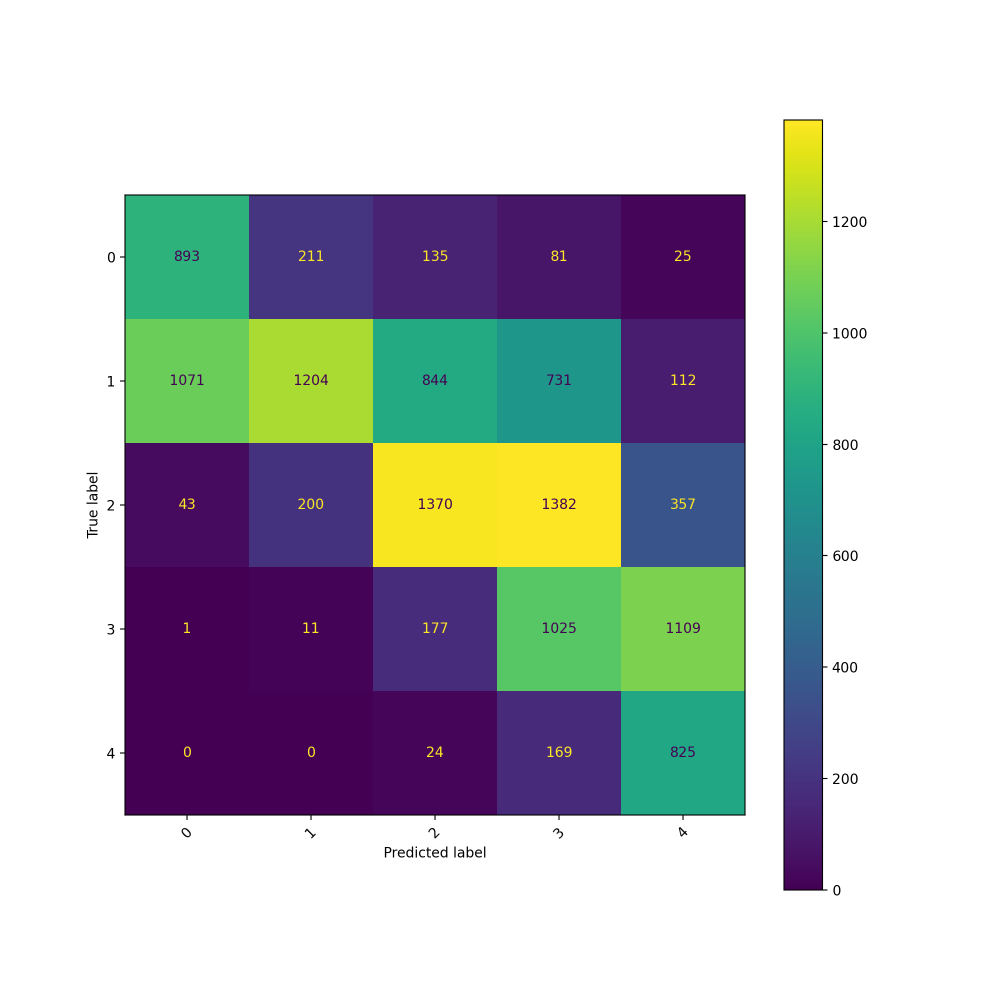

In [324]:
from sklearn.metrics import ConfusionMatrixDisplay

fig, ax = plt.subplots(figsize=(10, 10))

ConfusionMatrixDisplay.from_estimator(
    classifier,
    X_valid,
    y_cat_5_valid,
    #labels = [str(interval) for interval in label_encoder.classes_.tolist()],
    include_values = True,
    xticks_rotation = 45,
    values_format = None,
    cmap = 'viridis',
    ax = ax,
    colorbar = True,
)

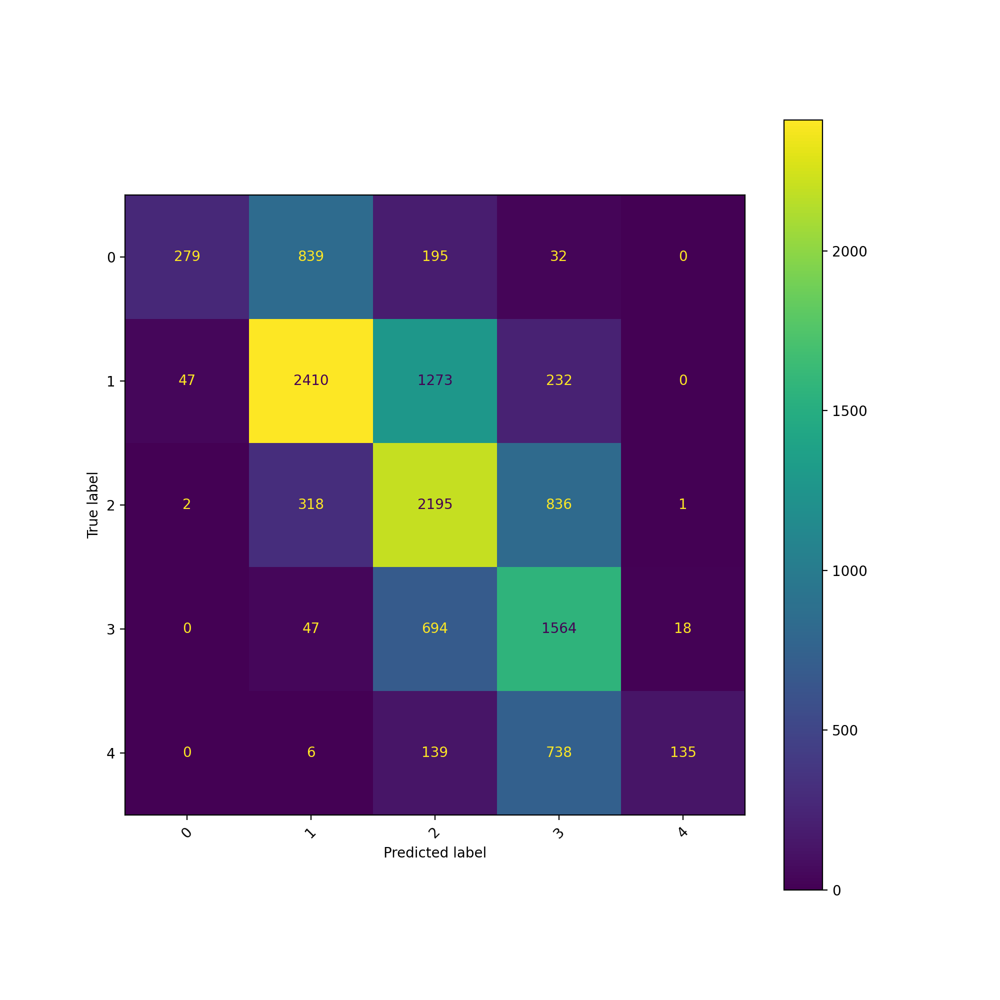

In [325]:
fig, ax = plt.subplots(figsize=(10, 10))

ConfusionMatrixDisplay.from_estimator(
    calibrated_classifier,
    X_valid,
    y_cat_5_valid,
    #display_labels = [str(interval) for interval in label_encoder.classes_.tolist()],
    include_values = True,
    xticks_rotation = 45,
    values_format = None,
    cmap = 'viridis',
    ax = ax,
    colorbar = True,
)

# 5. Model Interpretation

[Back to top](#plan)

In [326]:
# import raw data
df_raw = pd.read_feather(path_to_bulldozers+'/Data Files/bulldozers-raw')

# preprocess data
df, y, nas = proc_df(df_raw, 'SalePrice')

In [327]:
def split_vals(df, n):
    return df[:n].copy(), df[n:].copy()

In [392]:
n_total = len(df)
n_valid = 12000  # same as Kaggle's test set size
n_train = n_total - n_valid
n_small = 20000

X_train, X_valid = split_vals(df, n_train)
y_train, y_valid = split_vals(y, n_train)

X_small, _ = split_vals(X_train, n_small)
y_small, _ = split_vals(y_train, n_small)

print('Number of small training data points: X = {}, y = {}'.format(X_small.shape, y_small.shape))
print('Number of full training data points: X = {}, y = {}'.format(X_train.shape, y_train.shape))
print('Number of validation data points: X = {}, y = {}'.format(X_valid.shape, y_valid.shape))

Number of small training data points: X = (20000, 65), y = (20000,)
Number of full training data points: X = (389125, 65), y = (389125,)
Number of validation data points: X = (12000, 65), y = (12000,)


In [393]:
def rmse(y_gold, y_pred):
    return math.sqrt(((y_gold - y_pred)**2).mean())


def print_score(m, X_train, y_train, X_valid, y_valid):
    print('RMSE on train set: {:.4f}'.format(rmse(m.predict(X_train), y_train)))
    print('RMSE on valid set: {:.4f}'.format(rmse(m.predict(X_valid), y_valid)))
    print('R^2 on train set: {:.4f}'.format(m.score(X_train, y_train)))
    print('R^2 on valid set: {:.4f}'.format(m.score(X_valid, y_valid)))
    if hasattr(m, 'oob_score_'): print('R^2 on oob set: {:.4f}'.format(m.oob_score_))
    return

<a id='RF_feature_importance'></a>

### $\bullet$ Random Forest feature importance

[Back to top](#plan)

In [330]:
def rf_feat_importance(model, df):
    feat_importance = pd.DataFrame({
        'cols': df.columns,
        'imp': model.feature_importances_,
    })
    feat_importance = feat_importance.sort_values('imp', ascending = False)
    return feat_importance


def rf_unfolded_feat_importance(model, df):
    feat_importance = pd.DataFrame({
        'cols': df.columns,
        'imp': model.feature_importances_,
    })
    for i, tree in enumerate(model.estimators_):
        feat_importance['imp_' + str(i)] = tree.feature_importances_
    feat_importance = feat_importance.sort_values('imp', ascending = False)
    return feat_importance


# found at
# https://stackoverflow.com/questions/49170296/scikit-learn-feature-importance-calculation-in-decision-trees
def tree_feature_importance(model, normalize = True):

    left_c = model.tree_.children_left
    right_c = model.tree_.children_right

    impurity = model.tree_.impurity
    node_samples = model.tree_.weighted_n_node_samples

    # Initialize the feature importance, those not used remain zero
    feature_importance = np.zeros((model.tree_.n_features,))

    for idx, node in enumerate(model.tree_.feature):
        if node >= 0:
            # Accumulate the feature importance over all the nodes where it's used
            feature_importance[node] += (
                impurity[idx]*node_samples[idx] -
                impurity[left_c[idx]]*node_samples[left_c[idx]] -
                impurity[right_c[idx]]*node_samples[right_c[idx]])

    # Number of samples at the root node
    feature_importance /= node_samples[0]

    if normalize:
        normalizer = feature_importance.sum()
        if normalizer > 0:
            feature_importance /= normalizer

    return feature_importance

In [403]:
model = RandomForestRegressor(
    n_estimators = 40,
    min_samples_split = 10,
    max_features = 0.5, # default = 'auto'/None
    n_jobs = -1,
    random_state = 42,

    bootstrap = True,
    oob_score = True, # default = False,
    max_samples = 0.75, # default = None,
)

%time model.fit(X_small, y_small)
print_score(model, X_small, y_small, X_valid, y_valid)

CPU times: total: 8.05 s
Wall time: 659 ms
RMSE on train set: 0.1508
RMSE on valid set: 0.3273
R^2 on train set: 0.9541
R^2 on valid set: 0.8087
R^2 on oob set: 0.8860


In [399]:
model.feature_importances_

array([1.05946285e-02, 2.02128537e-02, 3.64694437e-02, 0.00000000e+00,
       0.00000000e+00, 9.36812983e-02, 2.51393164e-02, 3.61618184e-02,
       3.52419938e-02, 2.09695687e-02, 5.37286696e-02, 4.05819897e-03,
       1.88052704e-02, 4.84678755e-02, 6.38398865e-02, 6.84668188e-03,
       6.80136426e-03, 2.00981593e-02, 3.23779701e-03, 1.29201768e-01,
       8.18591993e-04, 3.81309478e-03, 3.90172960e-04, 8.81468714e-04,
       1.20428586e-02, 4.74057180e-04, 6.35612567e-04, 1.58317997e-03,
       5.54080302e-04, 1.07826567e-03, 7.54658607e-03, 1.24547354e-03,
       3.55537154e-03, 1.72992594e-03, 8.14810181e-04, 1.04329860e-02,
       1.33382280e-03, 1.35613373e-01, 5.73455288e-02, 4.12565401e-02,
       9.48122018e-03, 2.31681282e-03, 3.18944802e-03, 8.28502123e-04,
       7.40270481e-04, 2.68040813e-04, 3.69220204e-04, 2.80059181e-03,
       6.96449666e-03, 3.77923030e-04, 3.29473508e-04, 8.23125326e-03,
       3.32325692e-03, 5.61376359e-03, 1.12914075e-03, 7.10996923e-03,
      

#### Feature importance of a single tree

In [400]:
# pick the first tree of the forest
tree = model.estimators_[0]

We propose 3 ways to access the feature importances of a single tree, with one given by the function `tree_feature_importance` which can serve as an explanation of how these scores are computed:

In [401]:
# method 1
# tree.tree_.compute_feature_importances(normalize = True)

# method 2
# tree_feature_importance(tree, normalize = True)

# method 3
tree.feature_importances_

array([9.64115853e-03, 1.82564637e-02, 3.83769427e-02, 0.00000000e+00,
       0.00000000e+00, 6.78181998e-02, 2.80715661e-02, 4.04053235e-02,
       3.97527702e-02, 9.65114935e-03, 1.81826068e-01, 4.56121290e-03,
       7.14338506e-02, 3.71708549e-02, 7.60018099e-02, 8.86446864e-03,
       8.24330964e-04, 5.72544501e-03, 3.92676197e-03, 6.79914601e-02,
       5.35264193e-04, 3.65880179e-05, 3.20119211e-04, 1.81570491e-04,
       1.35826771e-02, 4.55996091e-05, 0.00000000e+00, 3.53677080e-04,
       5.00016460e-04, 0.00000000e+00, 5.06038086e-03, 3.17185195e-03,
       1.71108415e-03, 5.44161893e-05, 1.85386957e-04, 1.56309479e-03,
       1.14717666e-03, 4.73666853e-02, 1.65493311e-03, 1.25103916e-01,
       2.78586765e-03, 9.75760083e-04, 1.13887468e-03, 8.90799152e-04,
       3.53399829e-04, 3.90286199e-04, 7.14369617e-04, 8.31491861e-04,
       2.00797307e-02, 6.42248383e-05, 0.00000000e+00, 9.42955576e-03,
       5.11944069e-03, 5.65887500e-03, 1.62994836e-03, 7.58895506e-03,
      

In [402]:
feat_importance = rf_feat_importance(tree, X_small)
feat_importance[:20]

,cols,imp
10,fiSecondaryDesc,0.181826
39,Hydraulics_Flow,0.125104
14,fiProductClassDesc,0.076002
12,fiModelDescriptor,0.071434
19,Enclosure,0.067991
5,YearMade,0.067818
37,Coupler_System,0.047367
7,UsageBand,0.040405
8,fiModelDesc,0.039753
2,ModelID,0.038377


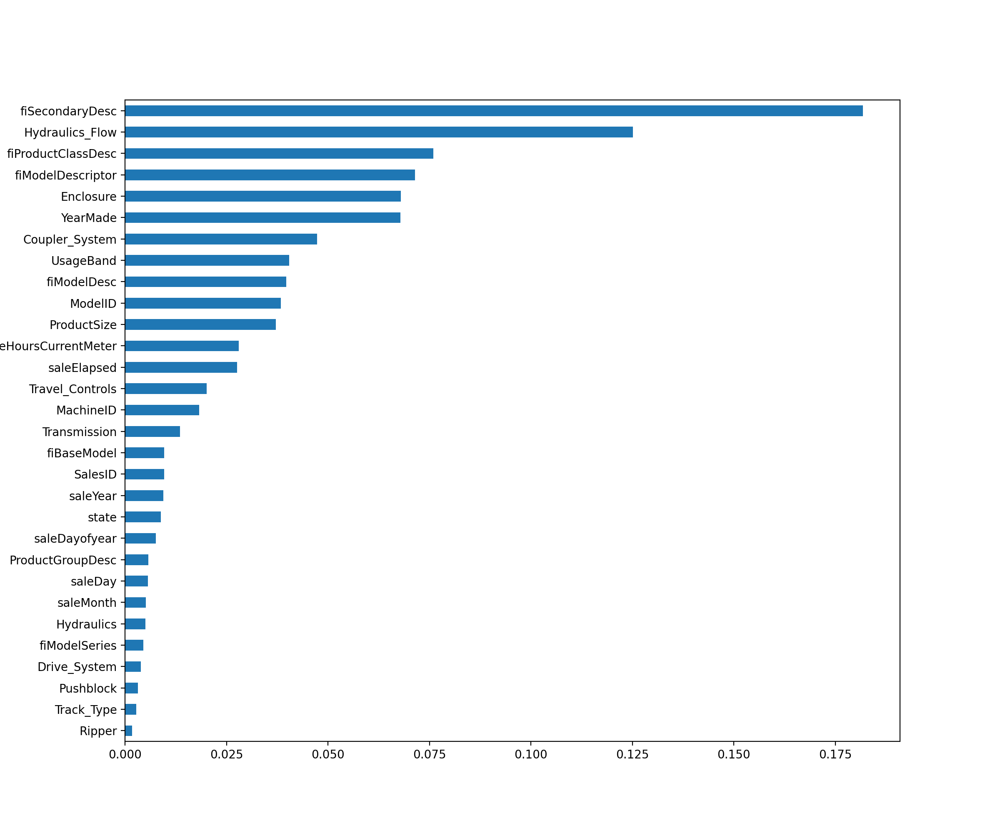

In [336]:
barh = feat_importance[:30].plot('cols', 'imp', 'barh', figsize = (12,10), legend = False)
barh = barh.invert_yaxis()
barh

#### Feature importance of the whole random forest



In [337]:
feat_importance = rf_feat_importance(model, X_small)
feat_importance[:20]

,cols,imp
37,Coupler_System,0.135613
19,Enclosure,0.129202
5,YearMade,0.093681
14,fiProductClassDesc,0.063840
38,Grouser_Tracks,0.057346
10,fiSecondaryDesc,0.053729
13,ProductSize,0.048468
39,Hydraulics_Flow,0.041257
2,ModelID,0.036469
7,UsageBand,0.036162


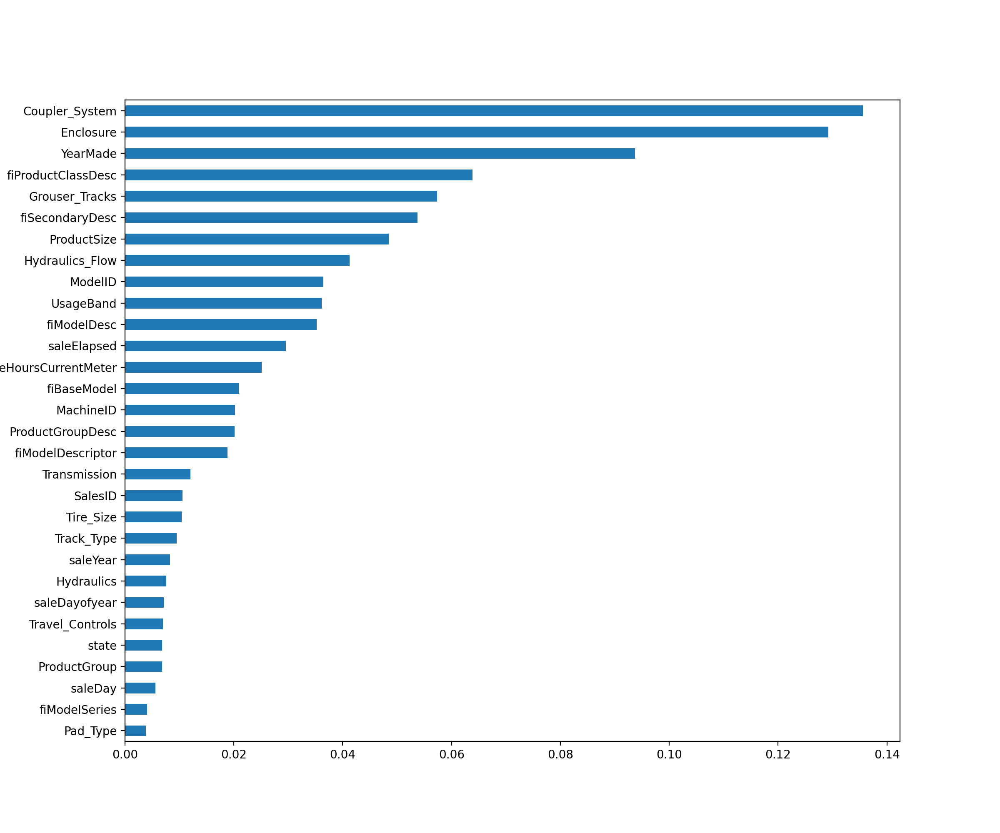

In [338]:
barh = feat_importance[:30].plot('cols', 'imp', 'barh', figsize = (12,10), legend = False)
barh = barh.invert_yaxis()
barh

#### Ablation of least important features



In [339]:
to_keep = feat_importance[feat_importance.imp > 0.005].cols
len(to_keep)

28

In [340]:
to_keep

37              Coupler_System
19                   Enclosure
5                     YearMade
14          fiProductClassDesc
38              Grouser_Tracks
10             fiSecondaryDesc
13                 ProductSize
39             Hydraulics_Flow
2                      ModelID
7                    UsageBand
8                  fiModelDesc
62                 saleElapsed
6     MachineHoursCurrentMeter
9                  fiBaseModel
1                    MachineID
17            ProductGroupDesc
12           fiModelDescriptor
24                Transmission
0                      SalesID
35                   Tire_Size
40                  Track_Type
51                    saleYear
30                  Hydraulics
55               saleDayofyear
48             Travel_Controls
15                       state
16                ProductGroup
53                     saleDay
Name: cols, dtype: object

In [405]:
# perform ablation of columns with low importance
df_keep = df[to_keep].copy()

n_total = len(df_keep)
n_valid = 12000  # same as Kaggle's test set size
n_train = n_total - n_valid
n_small = 20000

X_train_keep, X_valid_keep = split_vals(df_keep, n_train)
y_train, y_valid = split_vals(y, n_train)

X_small_keep, _ = split_vals(X_train_keep, n_small)
y_small, _ = split_vals(y_train, n_small)

print('Number of small training data points: X = {}, y = {}'.format(X_small.shape, y_small.shape))
print('Number of full training data points: X = {}, y = {}'.format(X_train.shape, y_train.shape))
print('Number of validation data points: X = {}, y = {}'.format(X_valid.shape, y_valid.shape))

Number of small training data points: X = (20000, 65), y = (20000,)
Number of full training data points: X = (389125, 65), y = (389125,)
Number of validation data points: X = (12000, 65), y = (12000,)


In [406]:
model = RandomForestRegressor(
    n_estimators = 40,
    min_samples_split = 10,
    max_features = 0.5, # default = 'auto'/None
    n_jobs = -1,
    random_state = 42,

    bootstrap = True,
    oob_score = True, # default = False,
    max_samples = 0.75, # default = None,
)

%time model.fit(X_small_keep, y_small)
print_score(model, X_small_keep, y_small, X_valid_keep, y_valid)

CPU times: total: 797 ms
Wall time: 202 ms
RMSE on train set: 0.2176
RMSE on valid set: 0.2891
R^2 on train set: 0.9043
R^2 on valid set: 0.8507
R^2 on oob set: 0.8525


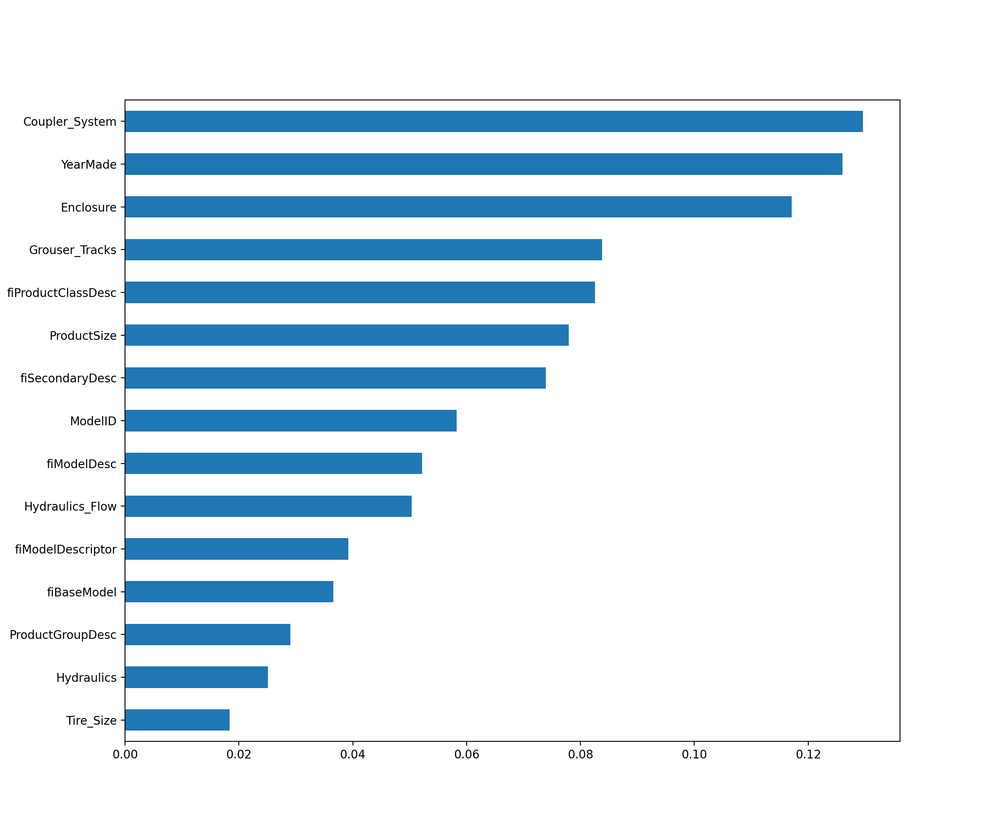

In [407]:
feat_importance = rf_feat_importance(model, X_small_keep)

barh = feat_importance.plot('cols', 'imp', 'barh', figsize = (12,10), legend = False)
barh = barh.invert_yaxis()
barh

<a id='permutation_feature_importance'></a>

### $\bullet$ Permutation importance

[Back to top](#plan)

In [344]:
model = RandomForestRegressor(
    n_estimators = 50,
    min_samples_split = 10,
    max_features = 0.5, # default = 'auto'/None
    n_jobs = -1,
    random_state = 42,

    bootstrap = True,
    oob_score = True, # default = False,
    max_samples = 0.75, # default = None,
)

%time model.fit(X_small, y_small)
print_score(model, X_small, y_small, X_valid, y_valid)

CPU times: total: 10.9 s
Wall time: 936 ms
RMSE on train set: 0.1500
RMSE on valid set: 0.3250
R^2 on train set: 0.9545
R^2 on valid set: 0.8114
R^2 on oob set: 0.8876


In [345]:
result = permutation_importance(
    model,
    X_valid,
    y_valid,
    n_repeats = 10,
    random_state = 42, n_jobs = -1,
)
sorted_idx = result.importances_mean.argsort()

In [346]:
result

{'importances_mean': array([ 1.11022302e-17,  6.92197588e-03,  2.68439509e-02,  3.33066907e-17,
         2.22044605e-17,  2.10261504e-01,  2.96688206e-03, -2.71878083e-04,
         2.33115129e-02,  1.81882991e-02,  7.61051687e-02,  3.35768087e-03,
         1.98968854e-02,  1.24771060e-01,  6.75872496e-02,  3.29124817e-04,
         5.39958304e-03,  1.03177543e-02,  1.68165978e-03,  1.30485600e-01,
         3.97061578e-04,  1.39911626e-03,  4.61353424e-05,  2.34775873e-04,
         8.34490026e-03,  3.81750120e-04,  4.08438761e-04,  1.33366777e-03,
        -1.56609530e-05,  3.65582873e-04,  3.01620981e-03,  1.02652867e-03,
         2.07729451e-03,  1.00246969e-03,  4.49997562e-04,  8.01019301e-03,
         1.31960679e-04,  2.28083825e-01,  3.86493168e-02,  2.19451423e-02,
         1.20532953e-02,  1.61020021e-03,  3.16592160e-03,  6.04709697e-04,
         6.18815144e-04, -1.39125628e-04,  3.54947732e-04,  3.90116236e-04,
         6.82624133e-04,  6.47079906e-04,  1.01795778e-04,  6.833205

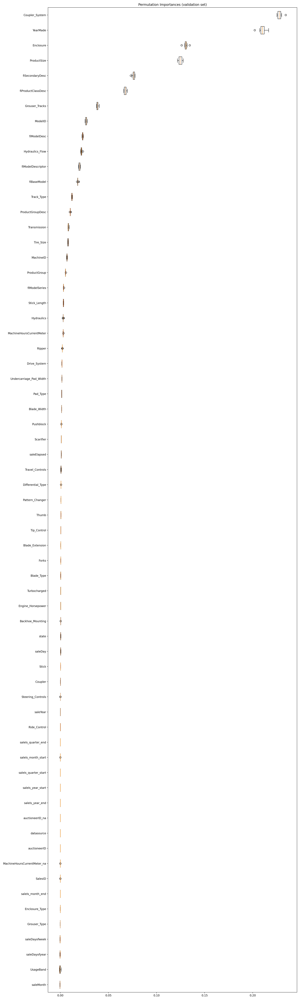

In [347]:
fig, ax = plt.subplots(figsize = (15, 50))
ax.boxplot(
    result.importances[sorted_idx].T,
    vert = False,
    labels = X_valid.columns[sorted_idx],
)
ax.set_title("Permutation Importances (validation set)")
fig.tight_layout()
plt.show()

#### Ablation of least important features



In [348]:
bool_filter = result.importances_mean > 0.005
bool_filter

array([False,  True,  True, False, False,  True, False, False,  True,
        True,  True, False,  True,  True,  True, False,  True,  True,
       False,  True, False, False, False, False,  True, False, False,
       False, False, False, False, False, False, False, False,  True,
       False,  True,  True,  True,  True, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False])

In [349]:
to_keep = df.columns[bool_filter]

df_keep = df[to_keep].copy()

n_total = len(df_keep)
n_valid = 12000  # same as Kaggle's test set size
n_train = n_total - n_valid
n_small = 20000

X_train_keep, X_valid_keep = split_vals(df_keep, n_train)
y_train, y_valid = split_vals(y, n_train)

X_small_keep, _ = split_vals(df_keep, n_small)
y_small, _ = split_vals(y, n_small)

print('Number of small training data points: X = {}, y = {}'.format(X_small.shape, y_small.shape))
print('Number of full training data points: X = {}, y = {}'.format(X_train.shape, y_train.shape))
print('Number of validation data points: X = {}, y = {}'.format(X_valid.shape, y_valid.shape))

Number of small training data points: X = (20000, 65), y = (20000,)
Number of full training data points: X = (389125, 65), y = (389125,)
Number of validation data points: X = (12000, 65), y = (12000,)


In [350]:
model = RandomForestRegressor(
    n_estimators = 50,
    min_samples_split = 10,
    max_features = 0.5, # default = 'auto'/None
    n_jobs = -1,
    random_state = 42,

    bootstrap = True,
    oob_score = True, # default = False,
    max_samples = 0.75, # default = None,
)

%time model.fit(X_small_keep, y_small)
print_score(model, X_small_keep, y_small, X_valid_keep, y_valid)

CPU times: total: 3.23 s
Wall time: 425 ms
RMSE on train set: 0.1968
RMSE on valid set: 0.2989
R^2 on train set: 0.9217
R^2 on valid set: 0.8404
R^2 on oob set: 0.8525


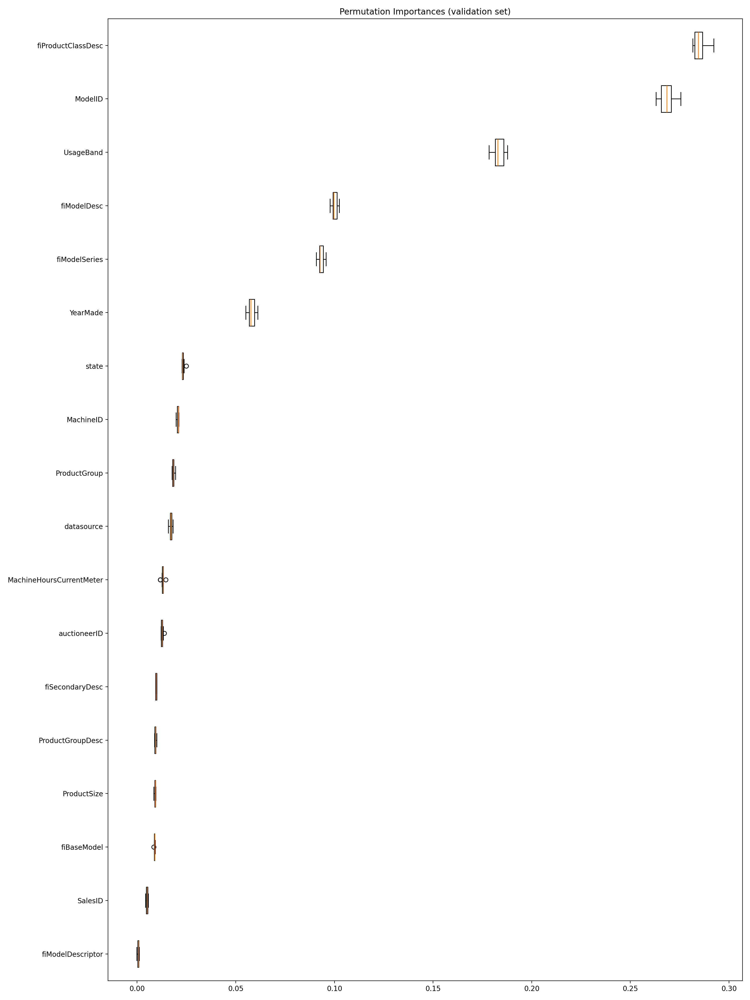

In [351]:
result = permutation_importance(
    model,
    X_valid_keep,
    y_valid,
    n_repeats = 10,
    random_state = 42, n_jobs = -1,
)
sorted_idx = result.importances_mean.argsort()

# plot boxplot
fig, ax = plt.subplots(figsize = (15, 20))
ax.boxplot(
    result.importances[sorted_idx].T,
    vert = False,
    labels = X_valid.columns[sorted_idx],
)
ax.set_title("Permutation Importances (validation set)")
fig.tight_layout()
plt.show()

#### Ablation after training on full data

In [352]:
model = RandomForestRegressor(
    n_estimators = 50,
    max_depth = 15,
    min_samples_split = 10,
    max_features = 0.5, # default = 'auto'/None
    n_jobs = -1,
    random_state = 42,

    bootstrap = True,
    oob_score = True, # default = False,
    max_samples = 0.75, # default = None,
)

%time model.fit(X_train, y_train)
print_score(model, X_train, y_train, X_valid, y_valid)

CPU times: total: 2min 40s
Wall time: 13.6 s
RMSE on train set: 0.2068
RMSE on valid set: 0.2431
R^2 on train set: 0.9106
R^2 on valid set: 0.8945
R^2 on oob set: 0.8925


In [353]:
result = permutation_importance(
    model,
    X_valid,
    y_valid,
    n_repeats = 5,
    random_state = 42,
    n_jobs = -1,
)
sorted_idx = result.importances_mean.argsort()

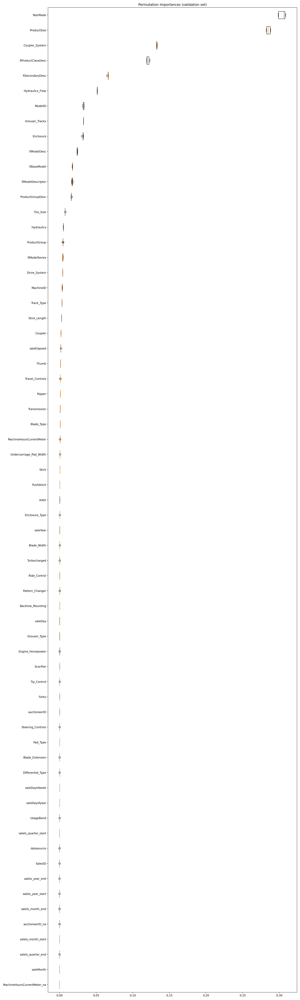

In [354]:
fig, ax = plt.subplots(figsize = (15, 50))
ax.boxplot(
    result.importances[sorted_idx].T,
    vert = False,
    labels = X_valid.columns[sorted_idx],
)
ax.set_title("Permutation Importances (validation set)")
fig.tight_layout()
plt.show()

In [355]:
bool_filter = result.importances_mean > 0.005
to_keep = df.columns[bool_filter]

df_keep = df[to_keep].copy()

n_total = len(df_keep)
n_valid = 12000  # same as Kaggle's test set size
n_train = n_total - n_valid
n_small = 20000

X_train_keep, X_valid_keep = split_vals(df_keep, n_train)
y_train, y_valid = split_vals(y, n_train)

X_small_keep, _ = split_vals(X_train_keep, n_small)
y_small, _ = split_vals(y_train, n_small)

print('Number of small training data points: X = {}, y = {}'.format(X_small.shape, y_small.shape))
print('Number of full training data points: X = {}, y = {}'.format(X_train.shape, y_train.shape))
print('Number of validation data points: X = {}, y = {}'.format(X_valid.shape, y_valid.shape))

Number of small training data points: X = (20000, 65), y = (20000,)
Number of full training data points: X = (389125, 65), y = (389125,)
Number of validation data points: X = (12000, 65), y = (12000,)


In [356]:
model = RandomForestRegressor(
    n_estimators = 50,
    max_depth = 15,
    min_samples_split = 10,
    max_features = 0.5, # default = 'auto'/None
    n_jobs = -1,
    random_state = 42,

    bootstrap = True,
    oob_score = True, # default = False,
    max_samples = 0.75, # default = None,
)

%time model.fit(X_train_keep, y_train)
print_score(model, X_train_keep, y_train, X_valid_keep, y_valid)

CPU times: total: 22.1 s
Wall time: 3.01 s
RMSE on train set: 0.2943
RMSE on valid set: 0.2838
R^2 on train set: 0.8190
R^2 on valid set: 0.8562
R^2 on oob set: 0.8077


In [357]:
# default is cv = 5
scores = cross_val_score(model, X_small_keep, y_small, cv = 5, n_jobs = -1)

print(scores)
print("r2 is {:.3f} with a standard deviation of {:.3f}".format(scores.mean(), scores.std()))

[0.83856298 0.84396686 0.81994659 0.85508206 0.8023175 ]
r2 is 0.832 with a standard deviation of 0.019


<a id='redundant_features'></a>

### $\bullet$ Feature correlations

[Back to top](#plan)

In [358]:
# something is weird with this column
cols = df.columns.tolist()
cols.index('saleIs_year_start')

61

In [359]:
# something is weird with this column
cols = df.columns.tolist()
cols.remove('saleIs_year_start')
cols

['SalesID',
 'MachineID',
 'ModelID',
 'datasource',
 'auctioneerID',
 'YearMade',
 'MachineHoursCurrentMeter',
 'UsageBand',
 'fiModelDesc',
 'fiBaseModel',
 'fiSecondaryDesc',
 'fiModelSeries',
 'fiModelDescriptor',
 'ProductSize',
 'fiProductClassDesc',
 'state',
 'ProductGroup',
 'ProductGroupDesc',
 'Drive_System',
 'Enclosure',
 'Forks',
 'Pad_Type',
 'Ride_Control',
 'Stick',
 'Transmission',
 'Turbocharged',
 'Blade_Extension',
 'Blade_Width',
 'Enclosure_Type',
 'Engine_Horsepower',
 'Hydraulics',
 'Pushblock',
 'Ripper',
 'Scarifier',
 'Tip_Control',
 'Tire_Size',
 'Coupler',
 'Coupler_System',
 'Grouser_Tracks',
 'Hydraulics_Flow',
 'Track_Type',
 'Undercarriage_Pad_Width',
 'Stick_Length',
 'Thumb',
 'Pattern_Changer',
 'Grouser_Type',
 'Backhoe_Mounting',
 'Blade_Type',
 'Travel_Controls',
 'Differential_Type',
 'Steering_Controls',
 'saleYear',
 'saleMonth',
 'saleDay',
 'saleDayofweek',
 'saleDayofyear',
 'saleIs_month_end',
 'saleIs_month_start',
 'saleIs_quarter_end',


In [360]:
len(df.columns)

65

In [361]:
corr = np.round(scipy.stats.spearmanr(df[cols]).correlation, 4)
corr.size

4096

[Text(0, -1.0, ''),
 Text(0, 0.0, 'Transmission'),
 Text(0, 1.0, 'Turbocharged'),
 Text(0, 2.0, 'Blade_Extension'),
 Text(0, 3.0, 'Blade_Width'),
 Text(0, 4.0, 'Enclosure_Type'),
 Text(0, 5.0, 'Engine_Horsepower'),
 Text(0, 6.0, 'Hydraulics'),
 Text(0, 7.0, 'Pushblock'),
 Text(0, 8.0, '')]

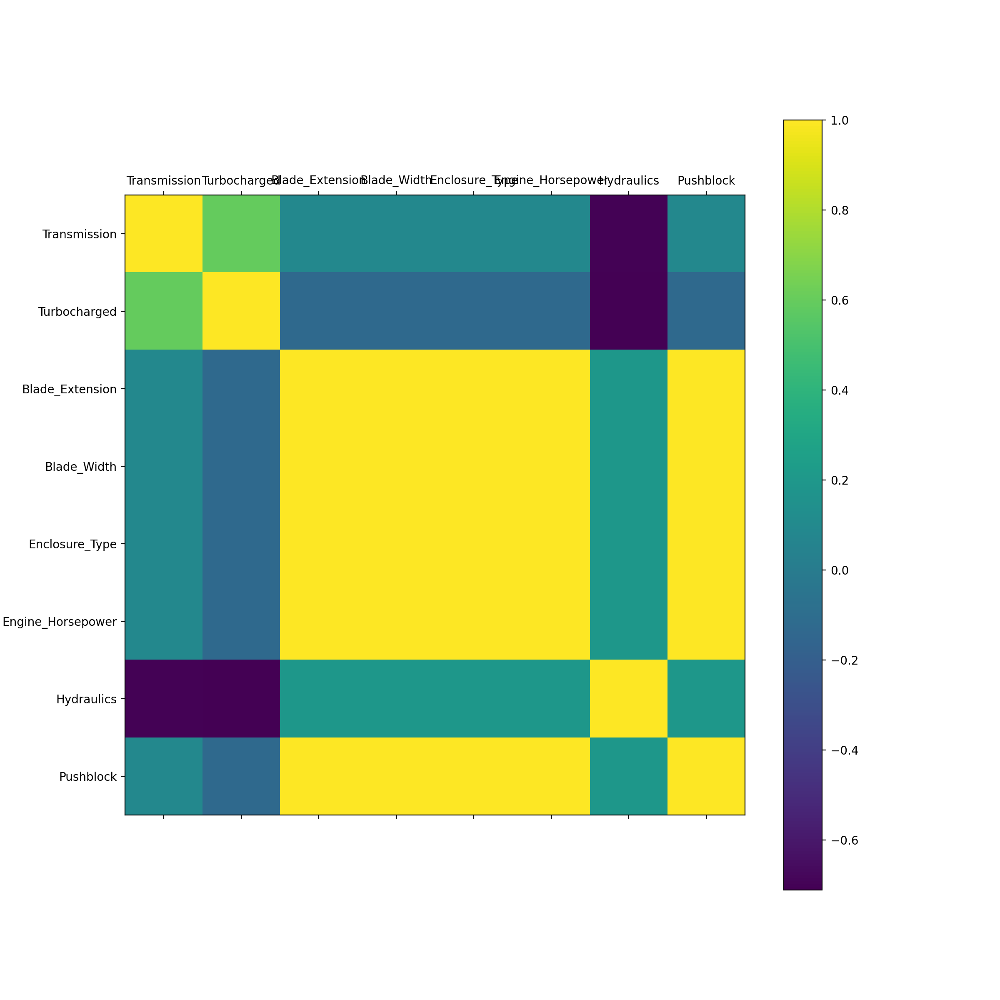

In [362]:
col_small = [
    'Transmission',
    'Turbocharged',
    'Blade_Extension',
    'Blade_Width',
    'Enclosure_Type',
    'Engine_Horsepower',
    'Hydraulics',
    'Pushblock',
]
corr_small = np.round(scipy.stats.spearmanr(df[col_small]).correlation, 4)
corr_small.size

fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111)
cax = ax.matshow(corr_small)

fig.colorbar(cax)

ax.set_xticklabels([''] + col_small)
ax.set_yticklabels([''] + col_small)


In [363]:
# corr with size = (65, 65) -> corr_condensed with size (65 * 64)/2
corr_condensed = hierarchy.distance.squareform(1 - corr)
corr_condensed.size

2016

In [364]:
(65 * 64)/2

2080.0

In [365]:
corr_linkage = hierarchy.linkage(corr_condensed, method = 'average')

In [366]:
corr_linkage

array([[1.60000000e+01, 1.70000000e+01, 0.00000000e+00, 2.00000000e+00],
       [2.60000000e+01, 2.90000000e+01, 1.00000000e-04, 2.00000000e+00],
       [8.00000000e+00, 9.00000000e+00, 3.00000000e-04, 2.00000000e+00],
       [2.80000000e+01, 6.50000000e+01, 3.50000000e-04, 3.00000000e+00],
       [3.80000000e+01, 3.90000000e+01, 5.00000000e-04, 2.00000000e+00],
       [3.10000000e+01, 6.70000000e+01, 5.00000000e-04, 4.00000000e+00],
       [3.40000000e+01, 6.90000000e+01, 7.00000000e-04, 5.00000000e+00],
       [2.70000000e+01, 7.00000000e+01, 8.60000000e-04, 6.00000000e+00],
       [3.30000000e+01, 7.10000000e+01, 1.11666667e-03, 7.00000000e+00],
       [4.90000000e+01, 5.00000000e+01, 1.20000000e-03, 2.00000000e+00],
       [3.70000000e+01, 6.80000000e+01, 1.85000000e-03, 3.00000000e+00],
       [5.10000000e+01, 6.10000000e+01, 2.40000000e-03, 2.00000000e+00],
       [2.10000000e+01, 2.50000000e+01, 2.50000000e-03, 2.00000000e+00],
       [5.20000000e+01, 5.50000000e+01, 5.20000000e

In [367]:
help(hierarchy.linkage)

Help on function linkage in module scipy.cluster.hierarchy:

linkage(y, method='single', metric='euclidean', optimal_ordering=False)
    Perform hierarchical/agglomerative clustering.
    
    The input y may be either a 1-D condensed distance matrix
    or a 2-D array of observation vectors.
    
    If y is a 1-D condensed distance matrix,
    then y must be a :math:`\binom{n}{2}` sized
    vector, where n is the number of original observations paired
    in the distance matrix. The behavior of this function is very
    similar to the MATLAB linkage function.
    
    A :math:`(n-1)` by 4 matrix ``Z`` is returned. At the
    :math:`i`-th iteration, clusters with indices ``Z[i, 0]`` and
    ``Z[i, 1]`` are combined to form cluster :math:`n + i`. A
    cluster with an index less than :math:`n` corresponds to one of
    the :math:`n` original observations. The distance between
    clusters ``Z[i, 0]`` and ``Z[i, 1]`` is given by ``Z[i, 2]``. The
    fourth value ``Z[i, 3]`` represents t

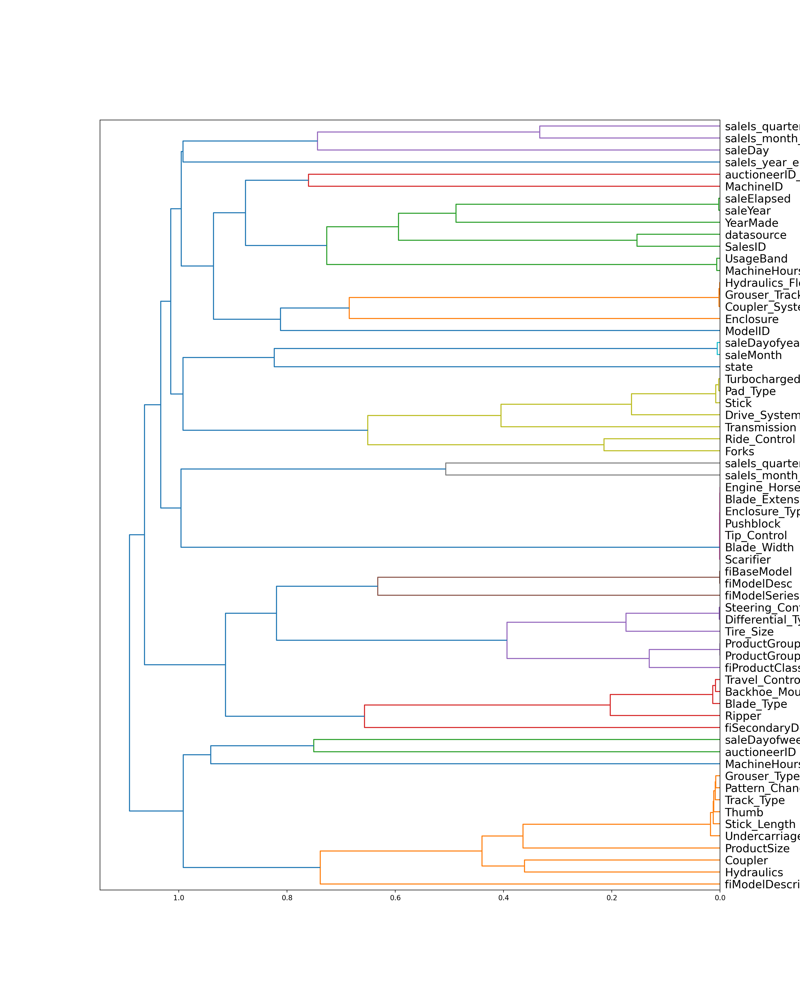

In [368]:


# compute plot
fig = plt.figure(figsize = (16,20))
dendrogram = hierarchy.dendrogram(
    corr_linkage,
    labels = cols,
    orientation = 'left',
    leaf_font_size = 16,
)
plt.show()

In [369]:
from collections import defaultdict

In [370]:
# compute hierarchical clustering
threshold = 0.1
cluster_ids = hierarchy.fcluster(corr_linkage, threshold, criterion = 'distance')

In [371]:
cluster_ids

array([32, 36, 30, 33,  6, 35, 31, 31, 16, 16, 11, 17,  5,  4, 13, 27, 12,
       12, 24, 29, 21, 23, 22, 23, 25, 23, 18, 18, 18, 18,  1, 18, 10, 18,
       18, 15,  2, 28, 28, 28,  3,  3,  3,  3,  3,  3,  9,  9,  9, 14, 14,
       34, 26, 40,  7, 26, 38, 19, 39, 20, 41, 34, 37,  8], dtype=int32)

In [372]:
# reshape clustering as {cluster_index : feature_index}
cluster_id_to_feature_ids = defaultdict(list)
for idx, cluster_id in enumerate(cluster_ids):
    cluster_id_to_feature_ids[cluster_id].append(idx)

In [373]:
cluster_id_to_feature_ids

defaultdict(list,
            {32: [0],
             36: [1],
             30: [2],
             33: [3],
             6: [4],
             35: [5],
             31: [6, 7],
             16: [8, 9],
             11: [10],
             17: [11],
             5: [12],
             4: [13],
             13: [14],
             27: [15],
             12: [16, 17],
             24: [18],
             29: [19],
             21: [20],
             23: [21, 23, 25],
             22: [22],
             25: [24],
             18: [26, 27, 28, 29, 31, 33, 34],
             1: [30],
             10: [32],
             15: [35],
             2: [36],
             28: [37, 38, 39],
             3: [40, 41, 42, 43, 44, 45],
             9: [46, 47, 48],
             14: [49, 50],
             34: [51, 61],
             26: [52, 55],
             40: [53],
             7: [54],
             38: [56],
             19: [57],
             39: [58],
             20: [59],
             41: [60],
           

In [374]:
# keep only first feature for each cluster
selected_features = [v[0] for v in cluster_id_to_feature_ids.values()]

# shift feature index after 62
selected_features = [(i if i < 62 else i+1) for i in selected_features]

In [375]:
selected_features

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 8,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 18,
 19,
 20,
 21,
 22,
 24,
 26,
 30,
 32,
 35,
 36,
 37,
 40,
 46,
 49,
 51,
 52,
 53,
 54,
 56,
 57,
 58,
 59,
 60,
 63,
 64]

In [376]:
# retained set of features
selected_features = [df.columns[i] for i in selected_features]
selected_features

['SalesID',
 'MachineID',
 'ModelID',
 'datasource',
 'auctioneerID',
 'YearMade',
 'MachineHoursCurrentMeter',
 'fiModelDesc',
 'fiSecondaryDesc',
 'fiModelSeries',
 'fiModelDescriptor',
 'ProductSize',
 'fiProductClassDesc',
 'state',
 'ProductGroup',
 'Drive_System',
 'Enclosure',
 'Forks',
 'Pad_Type',
 'Ride_Control',
 'Transmission',
 'Blade_Extension',
 'Hydraulics',
 'Ripper',
 'Tire_Size',
 'Coupler',
 'Coupler_System',
 'Track_Type',
 'Backhoe_Mounting',
 'Differential_Type',
 'saleYear',
 'saleMonth',
 'saleDay',
 'saleDayofweek',
 'saleIs_month_end',
 'saleIs_month_start',
 'saleIs_quarter_end',
 'saleIs_quarter_start',
 'saleIs_year_end',
 'auctioneerID_na',
 'MachineHoursCurrentMeter_na']

In [377]:
len(selected_features)

41

#### Perform training on ablated set of features

In [378]:
df_keep = df[selected_features].copy()

n_total = len(df_keep)
n_valid = 12000  # same as Kaggle's test set size
n_train = n_total - n_valid
n_small = 20000

X_train_keep, X_valid_keep = split_vals(df_keep, n_train)
y_train, y_valid = split_vals(y, n_train)

X_small_keep, _ = split_vals(df_keep, n_small)
y_small, _ = split_vals(y, n_small)

print('Number of small training data points: X = {}, y = {}'.format(X_small.shape, y_small.shape))
print('Number of full training data points: X = {}, y = {}'.format(X_train.shape, y_train.shape))
print('Number of validation data points: X = {}, y = {}'.format(X_valid.shape, y_valid.shape))

Number of small training data points: X = (20000, 65), y = (20000,)
Number of full training data points: X = (389125, 65), y = (389125,)
Number of validation data points: X = (12000, 65), y = (12000,)


In [379]:
model = RandomForestRegressor(
    n_estimators = 50,
    max_depth = 15,
    min_samples_split = 10,
    max_features = 0.5, # default = 'auto'/None
    n_jobs = -1,
    random_state = 42,

    bootstrap = True,
    oob_score = True, # default = False,
    max_samples = 0.75, # default = None,
)

%time model.fit(X_train_keep, y_train)
print_score(model, X_train_keep, y_train, X_valid_keep, y_valid)

CPU times: total: 2min 5s
Wall time: 10 s
RMSE on train set: 0.2107
RMSE on valid set: 0.2455
R^2 on train set: 0.9072
R^2 on valid set: 0.8924
R^2 on oob set: 0.8882




#### Permutation of feature importance after feature selection

In [380]:
result = permutation_importance(
    model,
    X_valid_keep,
    y_valid,
    n_repeats = 5,
    random_state = 42,
    n_jobs = -1,
)
sorted_idx = result.importances_mean.argsort()

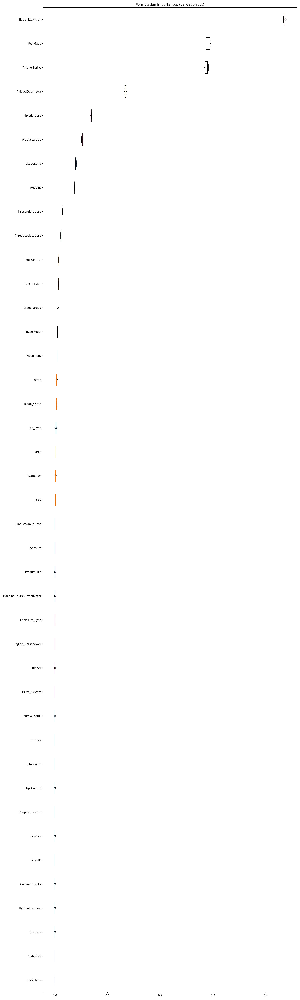

In [381]:
fig, ax = plt.subplots(figsize = (15, 50))
ax.boxplot(
    result.importances[sorted_idx].T,
    vert = False,
    labels = X_valid.columns[sorted_idx],
)
ax.set_title("Permutation Importances (validation set)")
fig.tight_layout()
plt.show()

<a id='feature_explicability'></a>

### $\bullet$ Individual feature explicability

[Back to top](#plan)

installs requiered:
- `pip install plotnine`
- `conda install matplotlib=2.2.3`

#### Partial Dependance Plots of explanatory variables

In [382]:
sample = get_sample(df_raw[df_raw.YearMade > 1930], 500)

In [383]:
help(stat_smooth)

Help on class stat_smooth in module plotnine.stats.stat_smooth:

class stat_smooth(plotnine.stats.stat.stat)
 |  stat_smooth(mapping: 'Aes | None' = None, data: 'DataLike | None' = None, **kwargs: 'Any')
 |  
 |  Calculate a smoothed conditional mean
 |  
 |  
 |  .. rubric:: Usage
 |  
 |  ::
 |  
 |      stat_smooth(mapping=None, data=None, geom='smooth', position='identity',
 |                  na_rm=False, fullrange=False, formula=None, method='auto',
 |                  method_args={}, se=True, span=0.75, n=80, level=0.95, **kwargs)
 |  
 |  Only the ``mapping`` and ``data`` can be positional, the rest must
 |  be keyword arguments. ``**kwargs`` can be aesthetics (or parameters)
 |  used by the ``geom``.
 |  
 |  
 |  Parameters
 |  ----------
 |  mapping : aes, optional
 |      Aesthetic mappings created with :meth:`~plotnine.aes`. If specified and :py:`inherit.aes=True`, it is combined with the default mapping for the plot. You must supply mapping if there is no plot mapping.
 |

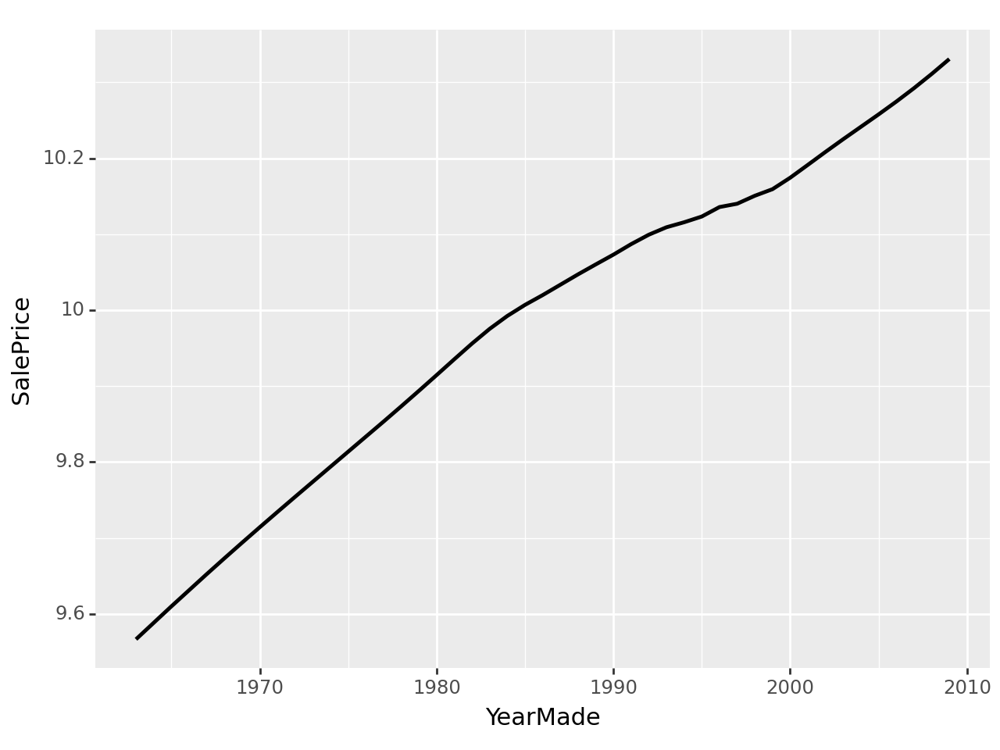

<Figure Size: (640 x 480)>

In [384]:
plot = ggplot(sample, aes('YearMade', 'SalePrice')) + stat_smooth(se = True, method = 'auto')
plot

#### Individual Conditional Expectation plots of explanatory variables


Individual Conditional Expectation (ICE) plots display one line per instance that shows how the instance's prediction changes when a feature changes. The values for a line (and one instance) can be computed by keeping all other features the same, creating variants of this instance by replacing the feature's value with values from a grid and making predictions with the black box model for these newly created instances. The result is a set of points for an instance with the feature value from the grid and the respective predictions. An ICE plot is more precise than a partial dependence plot as the latter does not focus on specific instances, but on an overall average, which can obscure a heterogeneous relationship created by interactions.

See more on ICE plots [here](https://christophm.github.io/interpretable-ml-book/ice.html)

In [385]:
# x = get_sample(X_train[X_train.YearMade > 1930], 500)
x = get_sample(df[df.YearMade > 1930], 500)

In [386]:
def plot_pdp(model, x, feat, clusters = None, feat_name = None):
    feat_name = feat_name or feat
    p = pdp.pdp_isolate(model, x.loc[:,model.feature_names_in_], feat)
    return pdp.pdp_plot(p, feat_name, plot_lines=True,
                        cluster=clusters is not None,
                        n_cluster_centers=clusters)

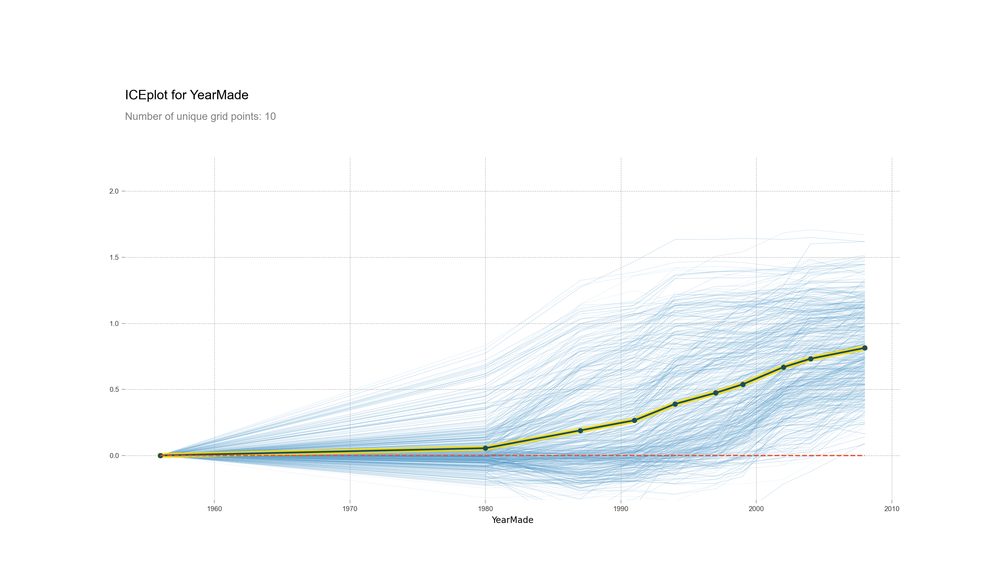

In [387]:
plot_pdp(model, x, 'YearMade')

In [388]:
def ice_cluster_plot(x, ice_lines, display_columns, n_cluster_centers, cluster_method, ax, plot_params):
	if cluster_method == 'approx':
		from sklearn.cluster import MiniBatchKMeans
		kmeans = MiniBatchKMeans(n_clusters=n_cluster_centers, random_state=0, verbose=0)
	else:
		from sklearn.cluster import KMeans
		kmeans = KMeans(n_clusters=n_cluster_centers, random_state=0)

	kmeans.fit(ice_lines[display_columns])
	cluster_plot_data = pd.DataFrame(kmeans.cluster_centers_, columns=display_columns)

	cluster_cmap = 'Blues'

	if plot_params is not None:
		if 'cluster_cmap' in plot_params.keys():
			cluster_cmap = plot_params['cluster_cmap']

	colors = plt.get_cmap(cluster_cmap)(np.linspace(0,1,20))[5:15]

	for i in range(len(cluster_plot_data)):
		y = list(cluster_plot_data[display_columns].iloc[i].values)
		ax.plot(x, y, linewidth=1, c=colors[i%10])

pdp._ice_cluster_plot = ice_cluster_plot

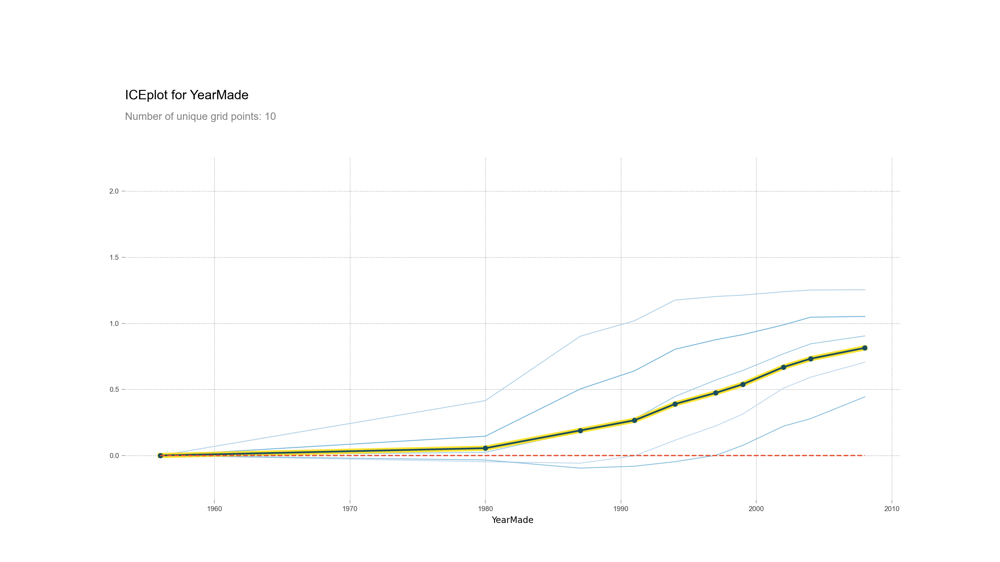

In [389]:
# cluster 500 lines into 5 clusters
plot_pdp(model, x, 'YearMade', clusters = 5)

In [390]:
x.loc[:,model.feature_names_in_].columns

Index(['SalesID', 'MachineID', 'ModelID', 'datasource', 'auctioneerID',
       'YearMade', 'MachineHoursCurrentMeter', 'fiModelDesc',
       'fiSecondaryDesc', 'fiModelSeries', 'fiModelDescriptor', 'ProductSize',
       'fiProductClassDesc', 'state', 'ProductGroup', 'Drive_System',
       'Enclosure', 'Forks', 'Pad_Type', 'Ride_Control', 'Transmission',
       'Blade_Extension', 'Hydraulics', 'Ripper', 'Tire_Size', 'Coupler',
       'Coupler_System', 'Track_Type', 'Backhoe_Mounting', 'Differential_Type',
       'saleYear', 'saleMonth', 'saleDay', 'saleDayofweek', 'saleIs_month_end',
       'saleIs_month_start', 'saleIs_quarter_end', 'saleIs_quarter_start',
       'saleIs_year_end', 'auctioneerID_na', 'MachineHoursCurrentMeter_na'],
      dtype='object')

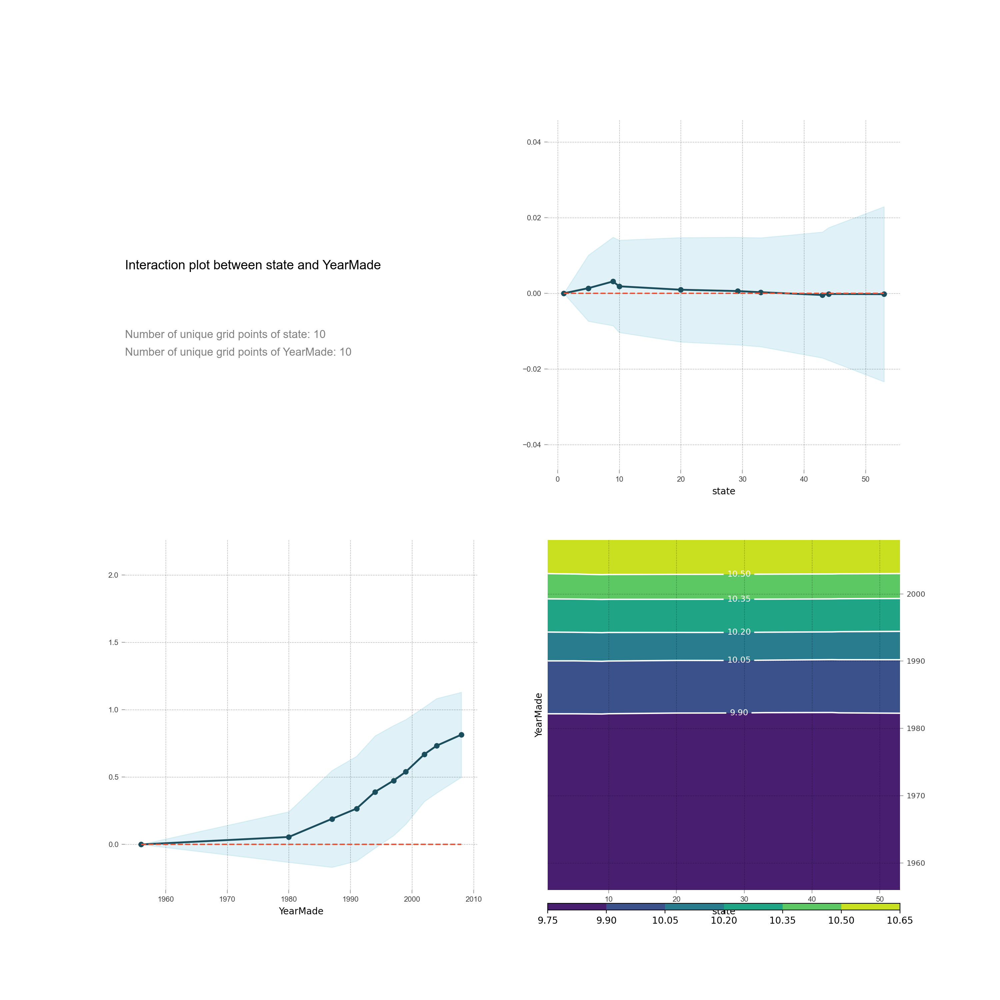

In [391]:
feats = ['state', 'YearMade']
p = pdp.pdp_interact(model, x.loc[:, model.feature_names_in_], features=feats)
pdp.pdp_interact_plot(p, feats)


# handle error of gdp_plot updates:
# https://forums.fast.ai/t/pbpbox-error-on-pdp-interact-plot/28468/2
# in C:\Users\Jb\.conda\envs\fastai-cpu-v0.7\Lib\site-packages\pdpbox/pdp.py
# Line 1147 change
# ax.clabel(c2, contour_label_fontsize=9, inline=1)
# ax.clabel(c2, fontsize=9, inline=1)

<a id='bottom'></a>

[Back to top](#plan)